<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Temperature Forecast Project using ML</b>
 </div>

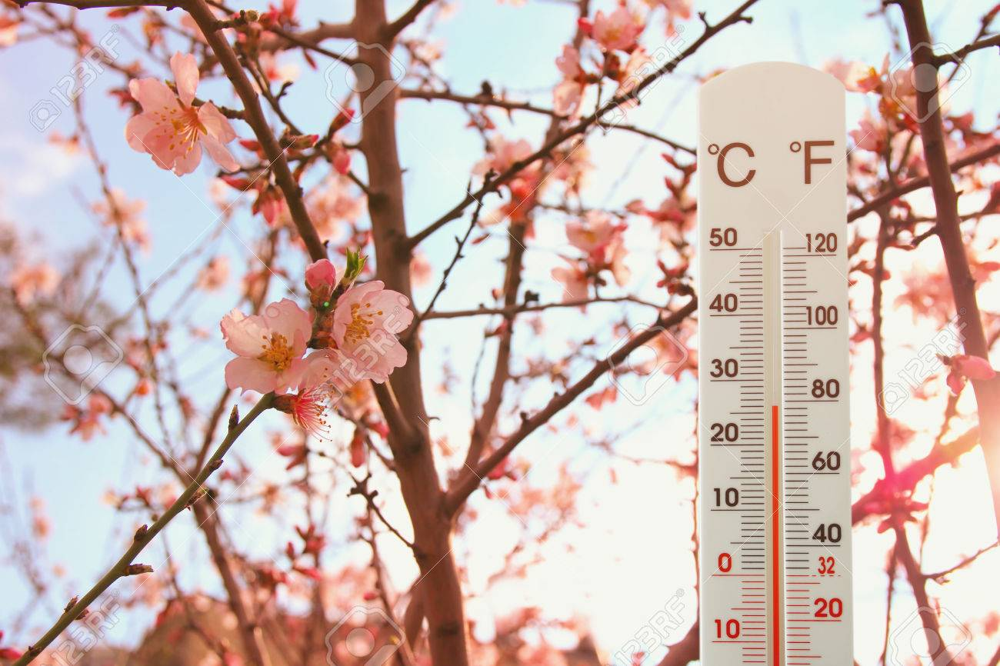

**Project Description**

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

**Attribute Information:**

For more information, read [Cho et al, 2020].

**1. station -** used weather station number: 1 to 25

**2. Date -** Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')

**3. Present_Tmax -** Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6

**4. Present_Tmin -** Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9

**5. LDAPS_RHmin -** LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5

**6. LDAPS_RHmax -** LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100

**7. LDAPS_Tmax_lapse -** LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5

**8. LDAPS_Tmin_lapse -**LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6

**9. LDAPS_WS -** LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9

**10. LDAPS_LH -** LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4

**11. LDAPS_CC1 -** LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97

**12. LDAPS_CC2 -** LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97

**13. LDAPS_CC3 -** LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98

**14. LDAPS_CC4 -** LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97

**15. LDAPS_PPT1 -** LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7

**16. LDAPS_PPT2 -** LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6

**17. LDAPS_PPT3 -** LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8

**18. LDAPS_PPT4 -** LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7

**19. lat -** Latitude (Â°): 37.456 to 37.645

**20. lon -** Longitude (Â°): 126.826 to 127.135

**21. DEM -** Elevation (m): 12.4 to 212.3

**22. Slope -** Slope (Â°): 0.1 to 5.2

**23. Solar radiation -** Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9

**24. Next_Tmax -** The next-day maximum air temperature (Â°C): 17.4 to 38.9

**25. Next_Tmin -** The next-day minimum air temperature (Â°C): 11.3 to 29.8T

**You have to build separate models that can predict the minimum temperature for the next day and the maximum temperature for the next day based on the details provided in the dataset.**

**Dataset Link-**

https://github.com/dsrscientist/Dataset2/blob/main/temperature.csv


<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Bringing in Vital Libraries</b>
 </div>

In [1]:
# Data Manipulation
import pandas as pd  # Data manipulation
import numpy as np   # Numerical operations
# Data Visualization
import seaborn as sns  # Statistical Data Visualization
import matplotlib.pyplot as plt  # Plotting
# Jupyter Notebook Integration # Inline plotting in the notebook environment
%matplotlib inline
import copy
# Visualizing Missing Data
import missingno as msno  # Visualizing Missing Data

# Suppressing Warnings
import warnings  # Suppressing warnings
warnings.filterwarnings("ignore")  # Ignore warnings

# Statistical Analysis
import scipy.stats as stats  # Statistical functions and tests
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Data Preprocessing
from scipy.stats import zscore  # Z-Score transformation
from sklearn.preprocessing import PowerTransformer, StandardScaler

# Regression Models
from sklearn.linear_model import (
    LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor
)
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor,
    BaggingRegressor, ExtraTreesRegressor
)
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor

from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score
)

from sklearn.model_selection import (
    train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
)

# Exploring Data Dimensions and Visualizing Insights with PCA and Matplotlib
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

<div style="background-color: #F4F2DE; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Fetching the Dataset</b>
 </div>

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [5]:
df.sample()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
5321,22.0,26-07-2016,32.3,25.8,78.432396,94.115723,28.295179,25.88262,6.879831,51.746017,...,0.843244,0.111669,0.015338,37.5102,127.086,21.9668,0.1332,5499.104492,29.9,26.5


### Comprehensive  Overview  for  Dataset

**Features/Attributes/Independent/input:**

**Station:** Identifier for the weather station.

**Date:** Date of weather data recording.

**Present_Tmax:** Maximum temperature at the present time.

**Present_Tmin:** Minimum temperature at the present time.

**LDAPS_RHmin:** LDAPS (Land Data Assimilation System) minimum relative humidity.

**LDAPS_RHmax:** LDAPS maximum relative humidity.

**LDAPS_Tmax_lapse:** LDAPS temperature maximum after lapse rate adjustment.

**LDAPS_Tmin_lapse:** LDAPS temperature minimum after lapse rate adjustment.

**LDAPS_WS:** LDAPS wind speed.

**LDAPS_LH:** LDAPS latent heat flux.

**LDAPS_CC1-6:** LDAPS cloud cover at different levels.

**LDAPS_PPT1-4:** LDAPS precipitation at different time intervals.

**Latitude (lat):** Geographic latitude of the station location.

**Longitude (lon):** Geographic longitude of the station location.

**DEM (Digital Elevation Model):** Elevation above sea level.

**Slope:** Slope of the terrain.

**Solar Radiation:** Solar radiation incident on the surface.

**Label/Target/Output:**

> **Situations : The dataset can be approached from two perspectives: one for predicting the Next_Tmax, and the other for predicting the Next_Tmin.**

**Next_Tmax:** Maximum temperature for the following day.

**Next_Tmin:** Minimum temperature for the following day.

**Observation:-** The Dataset contains 25 columns, with 23 serving as independent variables and 2 as dependent variables, namely 'Next_Tmax' and 'Next_Tmin.' The task involves regression to forecast continuous values for the next day's maximum and minimum temperatures, and the dataset features a combination of numerical, categorical, and nominal data, with continuous variables measured on different scales.

**Targets to achieve:-**

**Objective 1:-** The primary focus of our analysis is on the continuous target variable, "Next_Tmax." Since "Next_Tmax" represents temperature data and is a continuous variable, our approach is centered on regression techniques for making predictions. Regression is a suitable choice when the goal is to estimate or predict numerical values, such as temperature, based on other features in the dataset. In this context, our objective is to predict the maximum daily temperature ("Next_Tmax") as a numerical value, rather than categorizing it into predefined temperature ranges or classes ( not assigning it to temperature classes like "hot," "moderate," or "cold.").

**Objective 2:-** The secondary focus of our analysis is on the continuous target variable, "Next_Tmin." "Next_Tmin" represents temperature data and is a continuous numerical variable. Therefore, our approach revolves around regression techniques to make predictions. Regression is the suitable choice when the goal is to estimate or predict numerical values, such as temperature, based on other features within the dataset. Our objective is to predict the minimum daily temperature ("Next_Tmin") as a numerical value, rather than categorizing it into predefined temperature ranges or classes.

**I will validate my dataset assumptions by conducting comprehensive exploratory data analysis, utilizing data visualizations, and performing various analytical processes to confirm my understanding.**


**workflow instructions:** The preliminary exploratory data analysis (EDA) will be nearly identical for both tasks. As a result, we will initiate the process with EDA, complete it, proceed to Objective 1, and subsequently move on to Objective 2.

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Exploratory Data Analysis (EDA)</b>
 </div>

In [6]:
df.shape

(7752, 25)

In [7]:
print(f"The DataFrame has {df.shape[0]} rows and {df.shape[1]} columns.")

The DataFrame has 7752 rows and 25 columns.


In [8]:
list(df.columns)

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

In [9]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [10]:
type_groups = df.columns.to_series().groupby(df.dtypes).groups
type_counts = df.dtypes.value_counts()

for dtype, columns in type_groups.items():
    capitalized_dtype = str(dtype).upper()
    print(f"\033[1mData Type:\033[0m {capitalized_dtype}, \033[1mCount:\033[0m {type_counts[dtype]}")
    for column in columns:
        print(f"  - {column}")

Data Type: FLOAT64, Count: 24
  - station
  - Present_Tmax
  - Present_Tmin
  - LDAPS_RHmin
  - LDAPS_RHmax
  - LDAPS_Tmax_lapse
  - LDAPS_Tmin_lapse
  - LDAPS_WS
  - LDAPS_LH
  - LDAPS_CC1
  - LDAPS_CC2
  - LDAPS_CC3
  - LDAPS_CC4
  - LDAPS_PPT1
  - LDAPS_PPT2
  - LDAPS_PPT3
  - LDAPS_PPT4
  - lat
  - lon
  - DEM
  - Slope
  - Solar radiation
  - Next_Tmax
  - Next_Tmin
Data Type: OBJECT, Count: 1
  - Date


> * The dataset contains 24 columns with a data type of FLOAT64, which typically represents numerical, continuous values.

> * These columns appear to include meteorological and geographic features such as temperature, humidity, wind speed, cloud cover, precipitation, latitude, longitude, elevation (DEM), slope, solar radiation, and the target variables Next_Tmax and Next_Tmin.

> * There is one column with a data type of OBJECT. This column is named **"Date."**

**The "Date" column likely contains date or timestamp information. To work with date and time data more effectively, it is common practice to convert the "Date" column to a datetime data type.**

In [11]:
df['Date'] = pd.to_datetime(df['Date'])

In [12]:
df.columns.to_series().groupby(df.dtypes).groups

{float64: ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'], datetime64[ns]: ['Date']}

**The dataset is composed of 24 FLOAT64 columns that capture meteorological and geographic data, along with one datetime64[ns] column ('Date') used for timestamp information.**

<div style="background-color: #F4F2DE; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Instant Data Overview</b>
 </div>

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

**Observations:**

> **The dataset is represented as a Pandas DataFrame with a total of 7752 entries (rows) and 25 columns.**

> * The column "station" has 7750 non-null entries, indicating that there are 2 missing values in this column.

> * The "Date" column is correctly identified as a datetime data type (datetime64[ns]).

> * The columns "Present_Tmax" and "Present_Tmin" each have 7682 non-null entries, implying that there are missing values in these columns.

> * The columns related to LDAPS (e.g., "LDAPS_RHmin," "LDAPS_Tmax_lapse," "LDAPS_PPT1," etc.) have 7677 non-null entries, indicating missing data points in these columns.

> * The columns "Next_Tmax" and "Next_Tmin" each have 7725 non-null entries, suggesting the presence of some missing values.

> * All columns, except for "Date," are of the FLOAT64 data type, suitable for numerical data representation.

> * The "lat," "lon," "DEM," "Slope," and "Solar radiation" columns have no missing values (7752 non-null entries).

> **Need to Address The Missing Values:**

> For the "station," "Present_Tmax," "Present_Tmin," "Next_Tmax," and "Next_Tmin" columns, it's necessary to handle missing data, either by imputation or removal, to ensure data completeness.

> **Data Type Validation:**

> * Confirm that the datetime information in the "Date" column is accurate and in the expected format.

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Checking Duplicate & Null Values</b>
 </div>

In [14]:
# Checking the duplicate values row-wise
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7747    False
7748    False
7749    False
7750    False
7751    False
Length: 7752, dtype: bool

In [15]:
# Checking the duplicate values count for dataset
df.duplicated().sum()

0

In [16]:
df.isna()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7748,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7749,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7750,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [17]:
print('\033[1mTotal missing value in dataset: ', df.isna().sum().sum(),'\033[0m', '\n')

missing_count = df.isnull().sum().sort_values(ascending=False)
percentage_missing = ((missing_count / len(df)) * 100).round(2)
print(pd.concat([missing_count, percentage_missing], axis=1, keys=['Missing Values', '% Missing Data']))

Total missing value in dataset:  1248  

                  Missing Values  % Missing Data
LDAPS_CC3                     75            0.97
LDAPS_PPT4                    75            0.97
LDAPS_PPT2                    75            0.97
LDAPS_PPT1                    75            0.97
LDAPS_CC4                     75            0.97
LDAPS_CC2                     75            0.97
LDAPS_CC1                     75            0.97
LDAPS_LH                      75            0.97
LDAPS_WS                      75            0.97
LDAPS_Tmin_lapse              75            0.97
LDAPS_Tmax_lapse              75            0.97
LDAPS_RHmax                   75            0.97
LDAPS_RHmin                   75            0.97
LDAPS_PPT3                    75            0.97
Present_Tmin                  70            0.90
Present_Tmax                  70            0.90
Next_Tmax                     27            0.35
Next_Tmin                     27            0.35
Date                        

In [18]:
percentage_missing_data = (1248 / 7752) * 100
print(f"\033[1mPercentage of missing data in the dataset: {percentage_missing_data:.2f}%\033[0m")

Percentage of missing data in the dataset: 16.10%


**Based on the provided data, it isevident that the column's missing values amount to less than one percent.**

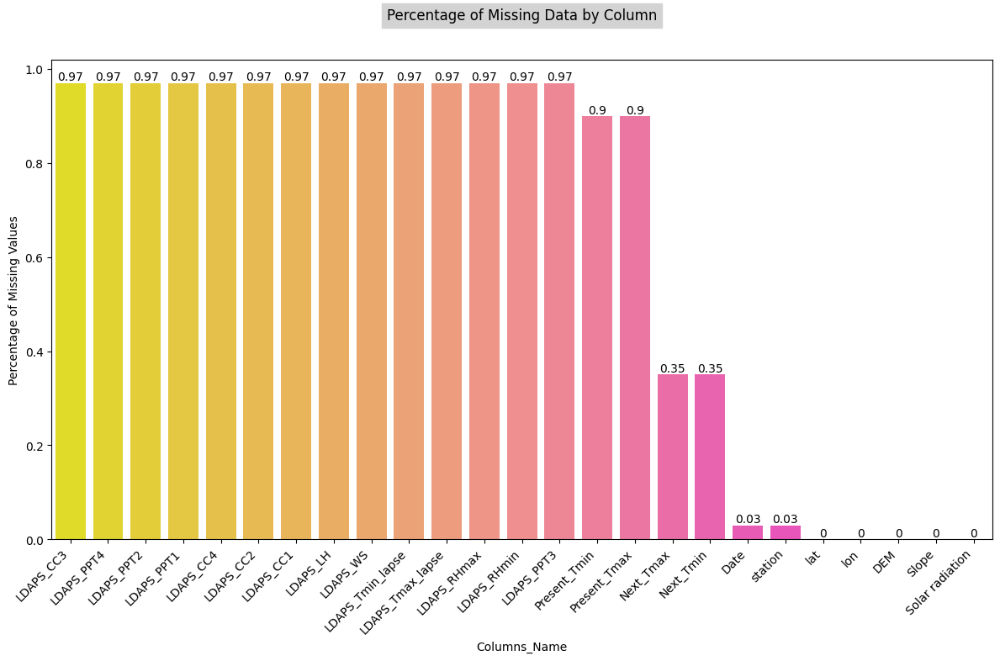

In [19]:
# Create a bar plot to visualize missing data
plt.figure(figsize=(12, 8))
plt.grid(False)
ax = sns.barplot(x=percentage_missing.index, y=percentage_missing.values, palette="spring_r")
for i in ax.containers:
    ax.bar_label(i)
ax.set(xlabel='Columns_Name', ylabel='Percentage of Missing Values')
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right',rotation=45)
ax.set_title("Percentage of Missing Data by Column", backgroundcolor='Lightgray', y=1.07)
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

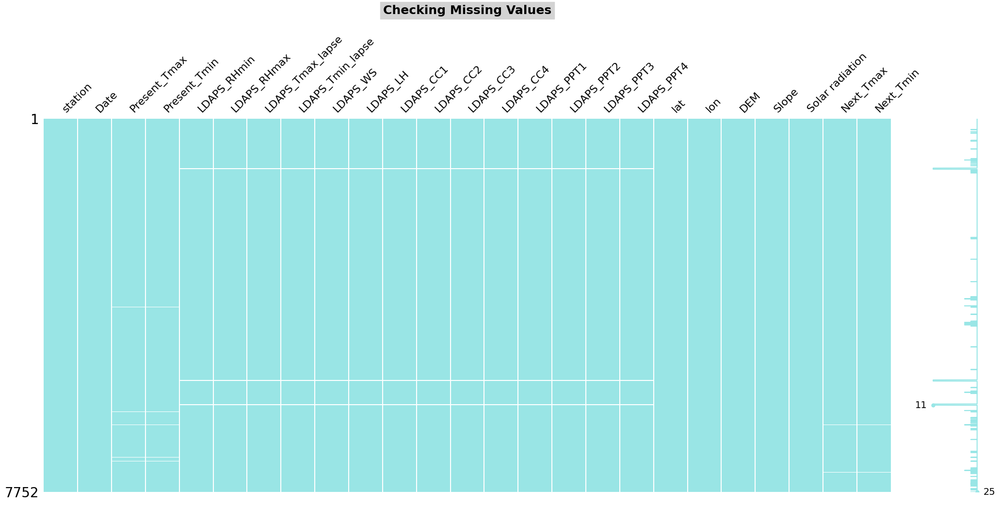

In [20]:
# Visiualizing missing data in DataFrame
plt.figure(figsize=(12, 6))
msno.matrix(df, color=( 0.6, 0.9, 0.9))
plt.title('Checking Missing Values', fontsize=18, fontweight='bold', backgroundcolor='Lightgray', y=1.27)
plt.show()

I have observed straight lines, blocks, or any systematic pattern in the "Missingno" matrix graph, it may indicate that the missing data is related to other variables or some underlying structure in your data. This suggests that the missing data is Missing at Random (MAR). In such cases, it's important to consider imputation methods or other strategies instead of removing rows to avoid introducing bias.

In [21]:
missing_cols = [column for column in df.columns if df[column].isna().any()]
print(f"\033[1mNumber of columns with missing values:\033[0m {len(missing_cols)}\n")
print(missing_cols)

Number of columns with missing values: 20

['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']


In [22]:
df[['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']].skew()

station             0.000000
Present_Tmax       -0.262942
Present_Tmin       -0.365875
LDAPS_RHmin         0.298765
LDAPS_RHmax        -0.850870
LDAPS_Tmax_lapse   -0.226775
LDAPS_Tmin_lapse   -0.578943
LDAPS_WS            1.571581
LDAPS_LH            0.670491
LDAPS_CC1           0.457231
LDAPS_CC2           0.470060
LDAPS_CC3           0.637630
LDAPS_CC4           0.663251
LDAPS_PPT1          5.367675
LDAPS_PPT2          5.747360
LDAPS_PPT3          6.425829
LDAPS_PPT4          6.792379
Next_Tmax          -0.339607
Next_Tmin          -0.403743
dtype: float64

In [23]:
df[['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']].dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

* The dataset contains 20 columns, primarily represented as FLOAT64 data types, with a single column recognized as a datetime data type (datetime64[ns]).

* The "station" column is of data type FLOAT64.

* The "Date" column is correctly identified as a datetime data type (datetime64[ns]) for timestamp information.

* The columns related to meteorological data, including "Present_Tmax," "Present_Tmin," "LDAPS_RHmin," "LDAPS_RHmax," "LDAPS_Tmax_lapse," "LDAPS_Tmin_lapse," "LDAPS_WS," "LDAPS_LH," "LDAPS_CC1," "LDAPS_CC2," "LDAPS_CC3," "LDAPS_CC4," "LDAPS_PPT1," "LDAPS_PPT2," "LDAPS_PPT3," "LDAPS_PPT4," "Next_Tmax," and "Next_Tmin," are all represented as FLOAT64 data types.

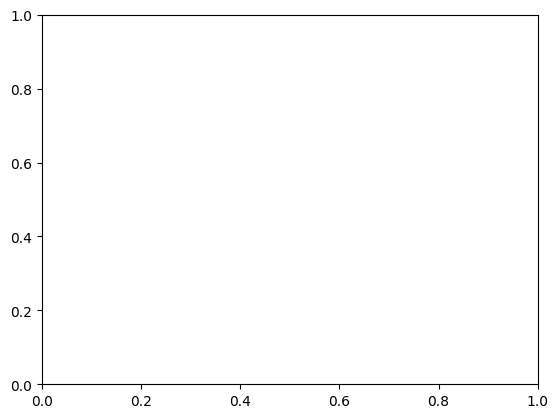

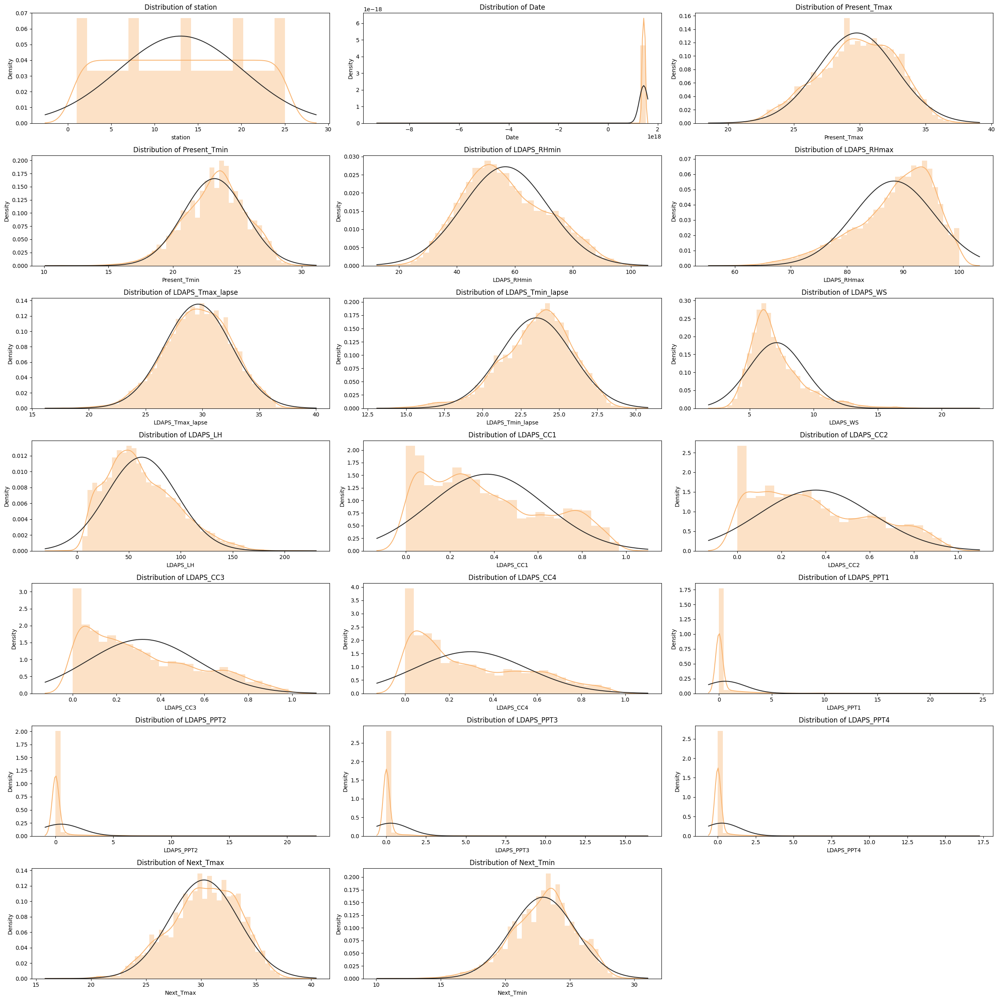

In [24]:
# List of columns to visualize
columns = ['station', 'Date','Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']
plt.grid(False)
# Determine the number of rows for subplots
num_cols = len(columns)

# Calculate the number of rows needed for three graphs in each row
num_rows = (num_cols + 2) // 3

# Create the subplot
fig, axes = plt.subplots(num_rows, 3, figsize=(25, 25))

# Loop through each column in the list
for i, col in enumerate(columns):
    row = i // 3
    col_num = i % 3
    sns.distplot(df[col], fit=stats.norm, color='#F9B572', ax=axes[row, col_num])
    axes[row, col_num].set_title(f'Distribution of {col}')

# Hide empty subplots
for i in range(num_cols, num_rows * 3):
    fig.delaxes(axes[i // 3, i % 3])

plt.tight_layout()
plt.show()



**From the data and graphical repersentation, I can observe that:-**

* "station" has a skewness of 0.000000, indicating that it is approximately normally distributed (symmetrical).

* "Present_Tmax" has a negative skewness of -0.262942, which is close to zero and suggests it is close to being symmetrical.

* "Present_Tmin" has a negative skewness of -0.365875, which is also close to zero, indicating it is nearly symmetrical.

* "LDAPS_RHmin" has a positive skewness of 0.298765, which is relatively close to zero and suggests it is nearly bell-shaped.

* "LDAPS_RHmax" has a negative skewness of -0.850870, indicating it is moderately left-skewed.

* "LDAPS_Tmax_lapse" has a negative skewness of -0.226775, which is relatively close to zero and suggests it is nearly bell-shaped.

* "LDAPS_Tmin_lapse" has a negative skewness of -0.578943, indicating it is moderately left-skewed.

* "LDAPS_WS" has a positive skewness of 1.571581, indicating it is significantly right-skewed.

* "LDAPS_LH" has a positive skewness of 0.670491, indicating it is moderately right-skewed.

* "LDAPS_CC1" has a positive skewness of 0.457231, indicating it is moderately right-skewed.

* "LDAPS_CC2" has a positive skewness of 0.470060, suggesting it is moderately right-skewed.

* "LDAPS_CC3" has a positive skewness of 0.637630, indicating it is moderately right-skewed.

* "LDAPS_CC4" has a positive skewness of 0.663251, suggesting it is moderately right-skewed.

* "LDAPS_PPT1" has a positive skewness of 5.367675, indicating it is highly right-skewed.

* "LDAPS_PPT2" has a positive skewness of 5.747360, suggesting it is highly right-skewed.

* "LDAPS_PPT3" has a positive skewness of 6.425829, indicating it is highly right-skewed.

* "LDAPS_PPT4" has a positive skewness of 6.792379, suggesting it is highly right-skewed.

* "Next_Tmax" has a negative skewness of -0.339607, which is relatively close to zero and suggests it is nearly bell-shaped.

* "Next_Tmin" has a negative skewness of -0.403743, which is relatively close to zero and suggests it is nearly bell-shaped.

### Handlig the missing values for categorical columns:-

In [25]:
# Address the missing "Dependents" values by filling them
print (df["Date"].mode()[0])
df["Date"] = df["Date"].fillna(df["Date"].mode()[0])

2013-01-07 00:00:00


In [26]:
print (df["station"].mean())
df["station"] = df["station"].fillna(df["station"].mean())

13.0


In [27]:
print (df["Present_Tmax"].mean())
df["Present_Tmax"] = df["Present_Tmax"].fillna(df["Present_Tmax"].mean())

29.7682114032804


In [28]:
print (df["Present_Tmin"].mean())
df["Present_Tmin"] = df["Present_Tmin"].fillna(df["Present_Tmin"].mean())

23.225058578495183


In [29]:
print (df["LDAPS_RHmin"].mean())
df["LDAPS_RHmin"] = df["LDAPS_RHmin"].fillna(df["LDAPS_RHmin"].mean())

56.759372150692975


In [30]:
print (df["Next_Tmax"].mean())
df["Next_Tmax"] = df["Next_Tmax"].fillna(df["Next_Tmax"].mean())

30.274886731391586


In [31]:
print (df["Next_Tmin"].mean())
df["Next_Tmin"] = df["Next_Tmin"].fillna(df["Next_Tmin"].mean())

22.93222006472492


In [32]:
print (df["LDAPS_Tmin_lapse"].mean())
df["LDAPS_Tmin_lapse"] = df["LDAPS_Tmin_lapse"].fillna(df["LDAPS_Tmin_lapse"].mean())

23.5125887762798


In [33]:
print (df["LDAPS_Tmax_lapse"].median())
df["LDAPS_Tmax_lapse"] = df["LDAPS_Tmax_lapse"].fillna(df["LDAPS_Tmax_lapse"].median())

29.70342642


In [34]:
print (df["LDAPS_RHmax"].median())
df["LDAPS_RHmax"] = df["LDAPS_RHmax"].fillna(df["LDAPS_RHmax"].median())

89.79347992


In [35]:
print (df["LDAPS_WS"].median())
df["LDAPS_WS"] = df["LDAPS_WS"].fillna(df["LDAPS_WS"].median())

6.547470301


In [36]:
print (df["LDAPS_LH"].median())
df["LDAPS_LH"] = df["LDAPS_LH"].fillna(df["LDAPS_LH"].median())

56.86548154


In [37]:
print (df["LDAPS_CC1"].median())
df["LDAPS_CC1"] = df["LDAPS_CC1"].fillna(df["LDAPS_CC1"].median())

0.315696837


In [38]:
print (df["LDAPS_CC2"].median())
df["LDAPS_CC2"] = df["LDAPS_CC2"].fillna(df["LDAPS_CC2"].median())

0.312421315


In [39]:
print (df["LDAPS_CC3"].median())
df["LDAPS_CC3"] = df["LDAPS_CC3"].fillna(df["LDAPS_CC3"].median())

0.262554604


In [40]:
print (df["LDAPS_CC4"].median())
df["LDAPS_CC4"] = df["LDAPS_CC4"].fillna(df["LDAPS_CC4"].median())

0.227664469


In [41]:
print (df["LDAPS_PPT1"].median())
df["LDAPS_PPT1"] = df["LDAPS_PPT1"].fillna(df["LDAPS_PPT1"].median())

0.0


In [42]:
print (df["LDAPS_PPT2"].median())
df["LDAPS_PPT2"] = df["LDAPS_PPT2"].fillna(df["LDAPS_PPT2"].median())

0.0


In [43]:
print (df["LDAPS_PPT3"].median())
df["LDAPS_PPT3"] = df["LDAPS_PPT3"].fillna(df["LDAPS_PPT3"].median())

0.0


In [44]:
print (df["LDAPS_PPT4"].median())
df["LDAPS_PPT4"] = df["LDAPS_PPT4"].fillna(df["LDAPS_PPT4"].median())

0.0


In [45]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [46]:
# Checking for specified values in DataFrame

print('\033[1m' + str(df.isin(['NaN', 'Nan', 'nan', 'NA', ' ', '_', '0']).any()) + '\033[0m')

station             False
Date                False
Present_Tmax        False
Present_Tmin        False
LDAPS_RHmin         False
LDAPS_RHmax         False
LDAPS_Tmax_lapse    False
LDAPS_Tmin_lapse    False
LDAPS_WS            False
LDAPS_LH            False
LDAPS_CC1           False
LDAPS_CC2           False
LDAPS_CC3           False
LDAPS_CC4           False
LDAPS_PPT1          False
LDAPS_PPT2          False
LDAPS_PPT3          False
LDAPS_PPT4          False
lat                 False
lon                 False
DEM                 False
Slope               False
Solar radiation     False
Next_Tmax           False
Next_Tmin           False
dtype: bool


In [47]:
df.isin(['NaN', 'Nan', 'nan', 'NA', ' ', '_']).any().sum()

0

In [48]:
# Display value counts for each column
for column in df.columns:
    print(f"\033[1mValue Counts for '{column}':\033[0m")
    print(df[column].value_counts(),'\n')

Value Counts for 'station':
13.0    312
14.0    310
24.0    310
23.0    310
22.0    310
21.0    310
20.0    310
19.0    310
18.0    310
17.0    310
16.0    310
15.0    310
1.0     310
2.0     310
12.0    310
11.0    310
10.0    310
9.0     310
8.0     310
7.0     310
6.0     310
5.0     310
4.0     310
3.0     310
25.0    310
Name: station, dtype: int64 

Value Counts for 'Date':
2013-01-07    27
2016-07-18    25
2016-07-25    25
2016-07-24    25
2016-07-23    25
              ..
2014-09-08    25
2014-08-08    25
2014-07-08    25
2014-06-08    25
2017-08-30    25
Name: Date, Length: 310, dtype: int64 

Value Counts for 'Present_Tmax':
31.4    112
29.4    111
29.1    108
29.7    107
31.9    105
       ... 
36.9      1
21.2      1
20.1      1
36.4      1
20.3      1
Name: Present_Tmax, Length: 168, dtype: int64 

Value Counts for 'Present_Tmin':
24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.6      1
14.2      1
29.1      1
29.7      1
15.0      1
Name: Presen

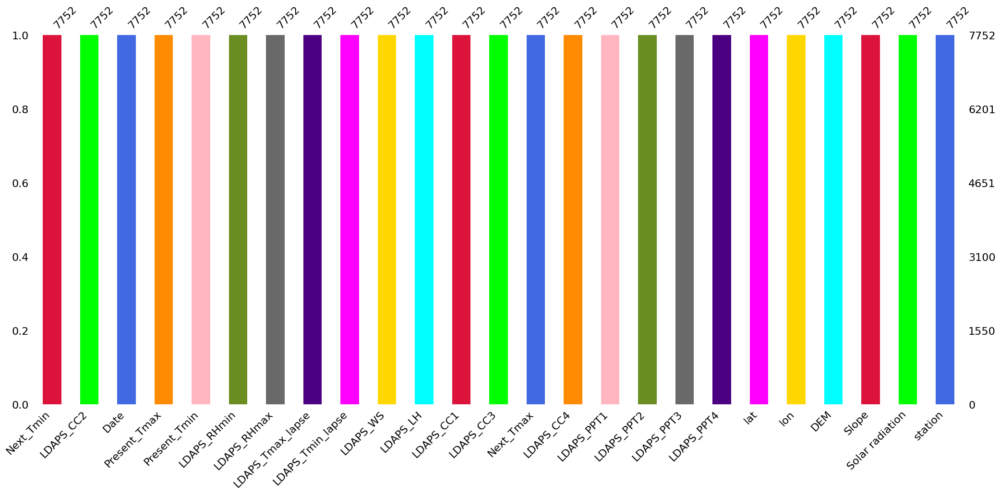

In [49]:
figsize=(10,8)
msno.bar(df, color=['crimson', 'lime', 'royalblue', 'darkorange', 'lightpink', 'olivedrab', 'dimgray', 'indigo', 'magenta', 'gold', 'aqua'], sort='descending')
plt.show()

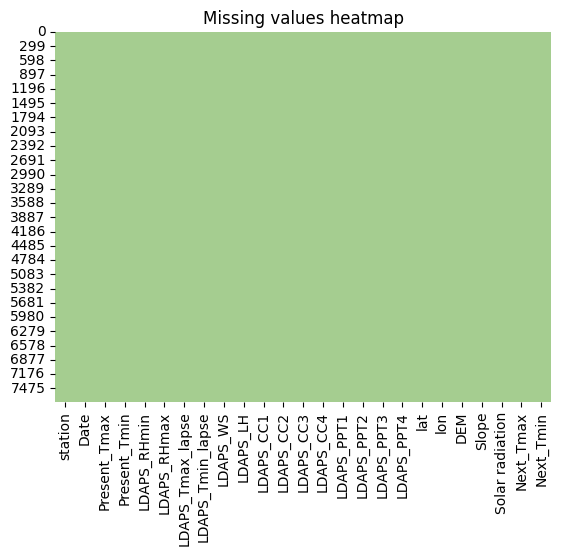

In [50]:
# # Lets visualize it using heatmap
sns.heatmap(df.isnull(), cmap="crest", cbar = False).set_title("Missing values heatmap")
plt.show()

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7752 non-null   float64       
 1   Date              7752 non-null   datetime64[ns]
 2   Present_Tmax      7752 non-null   float64       
 3   Present_Tmin      7752 non-null   float64       
 4   LDAPS_RHmin       7752 non-null   float64       
 5   LDAPS_RHmax       7752 non-null   float64       
 6   LDAPS_Tmax_lapse  7752 non-null   float64       
 7   LDAPS_Tmin_lapse  7752 non-null   float64       
 8   LDAPS_WS          7752 non-null   float64       
 9   LDAPS_LH          7752 non-null   float64       
 10  LDAPS_CC1         7752 non-null   float64       
 11  LDAPS_CC2         7752 non-null   float64       
 12  LDAPS_CC3         7752 non-null   float64       
 13  LDAPS_CC4         7752 non-null   float64       
 14  LDAPS_PPT1        7752 n

**Here are the observations based on the provided DataFrame information:**

> **DataFrame Information:** The dataset is a Pandas DataFrame with 7752 entries and 25 columns.

> **Data Columns:** The DataFrame consists of 25 columns, each representing a different attribute.

> **Non-Null Counts:** All columns have 7752 non-null (non-missing) values, indicating that there are no missing values in any of the columns.

> **Data Types:** The data types of the columns include:

> * 1 column with the 'datetime64[ns]' data type (Column: 'Date').
> * 24 columns with the 'float64' data type, which typically represents numerical data.
> **Memory Usage:** The DataFrame consumes approximately 1.5 megabytes of memory.

> **Overall, this DataFrame appears to be clean, with no missing data, and it consists mainly of numerical data, making it suitable for various data analysis and modeling tasks.**

In [52]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7752.0,13.000000,7.210637,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7752.0,29.768211,2.956557,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7752.0,23.225059,2.403036,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7752.0,56.759372,14.596973,19.794666,46.046162,55.313244,67.038254,98.524734
LDAPS_RHmax,7752.0,88.388529,7.158471,58.936283,84.316923,89.793480,93.704500,100.000153
LDAPS_Tmax_lapse,7752.0,29.614317,2.932911,17.624954,27.693091,29.703426,31.683819,38.542255
LDAPS_Tmin_lapse,7752.0,23.512589,2.333973,14.272646,22.114651,23.735942,25.134000,29.619342
LDAPS_WS,7752.0,7.092549,2.173913,2.882580,5.686487,6.547470,8.007471,21.857621
LDAPS_LH,7752.0,62.450457,33.571540,-13.603212,37.532764,56.865482,83.904586,213.414006
LDAPS_CC1,7752.0,0.368260,0.261236,0.000000,0.148321,0.315697,0.571696,0.967277


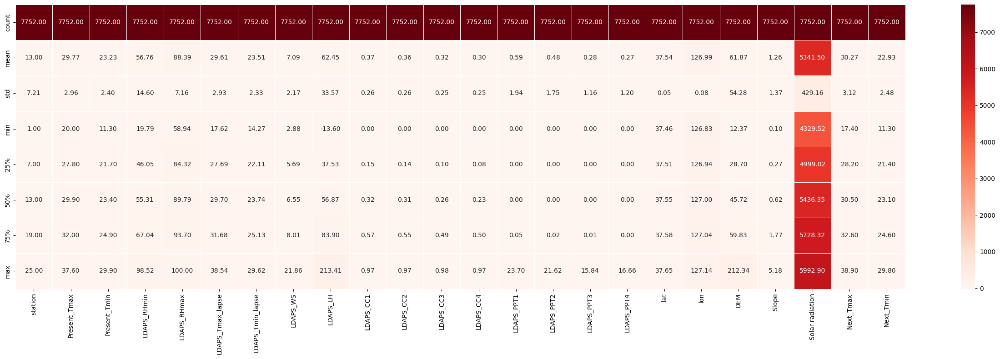

In [53]:
plt.figure(figsize=(25,8))
sns.heatmap(df.describe(), annot=True, fmt=".2f", cmap="Reds", linewidths=0.5, cbar=True)
plt.tight_layout()
plt.show()

**Observation:--**

> **station:**
* Shape: Symmetrical distribution.
* Skewness: Slightly positive skew.
* Spread: Ranges from 1 to 25.
* Outliers: No significant * Outliers.

> **Present_Tmax:**
* Shape: Approximately normally distributed.
* Skewness: Close to zero, indicating symmetry.
* Spread: Ranges from 20.0 to 37.6.
* Outliers: No significant * Outliers.

> **Present_Tmin:**
* Shape: Resembles a normal distribution with slight right-skew.
* Skewness: Slightly positive skew.
* Spread: Ranges from 11.3 to 29.9.
* Outliers: No significant * Outliers.

> **LDAPS_RHmin:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 19.79 to 98.52.
* Outliers: Potential * Outliers on the lower end.

> **LDAPS_RHmax:**
* Shape: Appears to be relatively symmetric.
* Skewness: Close to zero, indicating symmetry.
* Spread: Ranges from 58.94 to 100.00.
* Outliers: No significant * Outliers.

> **LDAPS_Tmax_lapse:**
* Shape: Symmetrical distribution.
* Skewness: Close to zero, suggesting symmetry.
* Spread: Ranges from 17.62 to 38.54.
* Outliers: No significant * Outliers.

> **LDAPS_Tmin_lapse:**
* Shape: Symmetrical distribution.
* Skewness: Close to zero, indicating symmetry.
* Spread: Ranges from 14.27 to 29.62.
* Outliers: No significant * Outliers.

> **LDAPS_WS:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 2.88 to 21.86.
* Outliers: Potential * Outliers on the higher end.

> **LDAPS_LH:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Varies from -13.60 to 213.41.
* Outliers: Potential * Outliers on the higher end.

> **LDAPS_CC1:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.00 to 0.97.
* Outliers: No significant * Outliers.

> **LDAPS_CC2:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Varies from 0.00 to 0.97.
* Outliers: No significant * Outliers.

> **LDAPS_CC3:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.00 to 0.98.
* Outliers: No significant * Outliers.

> **LDAPS_CC4:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.00 to 0.97.
* Outliers: No significant * Outliers.

> **LDAPS_PPT1:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Varies from 0.00 to 23.70.
* Outliers: Potential * Outliers on the higher end.

> **LDAPS_PPT2:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.00 to 21.62.
* Outliers: Potential * Outliers on the higher end.

> **LDAPS_PPT3:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Varies from 0.00 to 15.84.
* Outliers: Potential * Outliers on the higher end.

> **LDAPS_PPT4:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.00 to 16.66.
* Outliers: Potential * Outliers on the higher end.

> **lat:**
* Shape: Symmetrical distribution.
* Skewness: Close to zero, indicating symmetry.
* Spread: Ranges from 37.46 to 37.65.
* Outliers: No significant * Outliers.

> **lon:**
* Shape: Symmetrical distribution.
* Skewness: Close to zero, suggesting symmetry.
* Spread: Ranges from 126.83 to 127.14.
* Outliers: No significant * Outliers.

> **DEM:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Varies from 12.37 to 212.34.
* Outliers: Potential * Outliers on the higher end.

> **Slope:**
* Shape: Right-skewed distribution.
* Skewness: Positive skew.
* Spread: Ranges from 0.10 to 5.18.
* Outliers: Potential * Outliers on the higher end.

> **Solar radiation:**
* Shape: Relatively symmetric distribution.
* Skewness: Close to zero, indicating symmetry.
* Spread: Ranges from 4329.52 to 5992.90.
* Outliers: No significant * Outliers.

> **Next_Tmax:**
* Shape: Approximately normally distributed.
* Skewness: Close to zero, suggesting a relatively symmetric distribution.
* Spread: Ranges from 17.40 to 38.90.
* Outliers: No significant * Outliers.

> **Next_Tmin:**
* Shape: Approximately normally distributed.
* Skewness: Close to zero, indicating a relatively symmetric distribution.
* Spread: Varies from 11.30 to 29.80.
* Outliers: No significant * Outliers.






In [54]:
# Checking the number of unique value in each column

(df.nunique().to_frame("No. of unique values", )).style.background_gradient(cmap="Oranges")

,No. of unique values
station,25
Date,310
Present_Tmax,168
Present_Tmin,156
LDAPS_RHmin,7673
LDAPS_RHmax,7664
LDAPS_Tmax_lapse,7675
LDAPS_Tmin_lapse,7676
LDAPS_WS,7675
LDAPS_LH,7675


In [55]:
# Converting Date datatypes and spliting date into date, month and year.

df['Date']=pd.to_datetime(df['Date'])
df['Month']=df['Date'].apply(lambda x:x.month)
df['Day']=df['Date'].apply(lambda x:x.day)
df['Year']=df['Date'].apply(lambda x:x.year)

**After extracting the 'Day,' 'Month,' and 'Year' columns from the 'Date' column to gain more detailed information, we have proceeded to remove the original 'Date' column.**

In [56]:
# Dropping Date column
df.drop('Date', axis=1, inplace = True)

df.shape

(7752, 27)

In [57]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,6,30,2013
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,6,30,2013
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,6,30,2013
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,6,30,2013
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,6,30,2013


<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Univariant Analysis</b>
 </div>

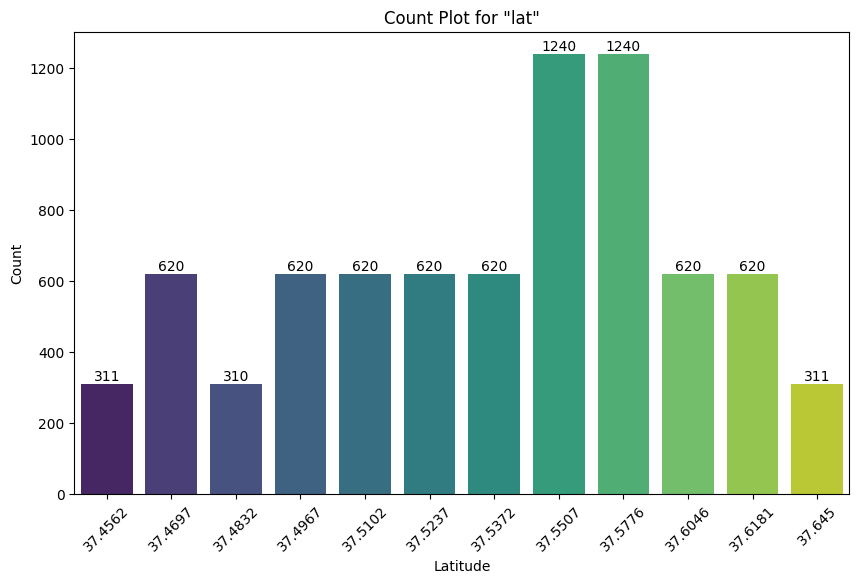

In [59]:
plt.figure(figsize=(10, 6))

ax=sns.countplot(data=df, x='lat', palette='viridis')
for i in ax.containers:
    ax.bar_label(i)
plt.title('Count Plot for "lat"')
plt.xlabel('Latitude')
plt.ylabel('Count')
plt.grid(False)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()


**The latitude counts shows:**

>  **37.5372 and 37.5776:** These two latitude values have the highest count, suggesting that they are the most frequently occurring latitude coordinates in the dataset.

>  **37.4562 and 37.545:** These two latitude values have 311 counts, indicating that they also appear frequently and may have specific significance within the dataset.

>  **37.4835:** This latitude value has 310 counts, which is slightly lower than the two with 311 counts but still relatively common in the dataset.

> **37.4697, 37.4967, 37.5102, 37.5237, 37.5372, 37.6046, and 37.6181:** These latitude values have a significantly higher count of 620, which could suggest that they represent a group of coordinates or locations that are of particular importance or relevance within the dataset. These coordinates may correspond to specific regions or points of interest.

> **In summary, the counts of latitude values provide insights into the frequency and importance of different coordinates within the dataset. Some coordinates are more common, while others, particularly the ones with 620 counts, may have special significance or represent specific areas of interest in the dataset's context.**







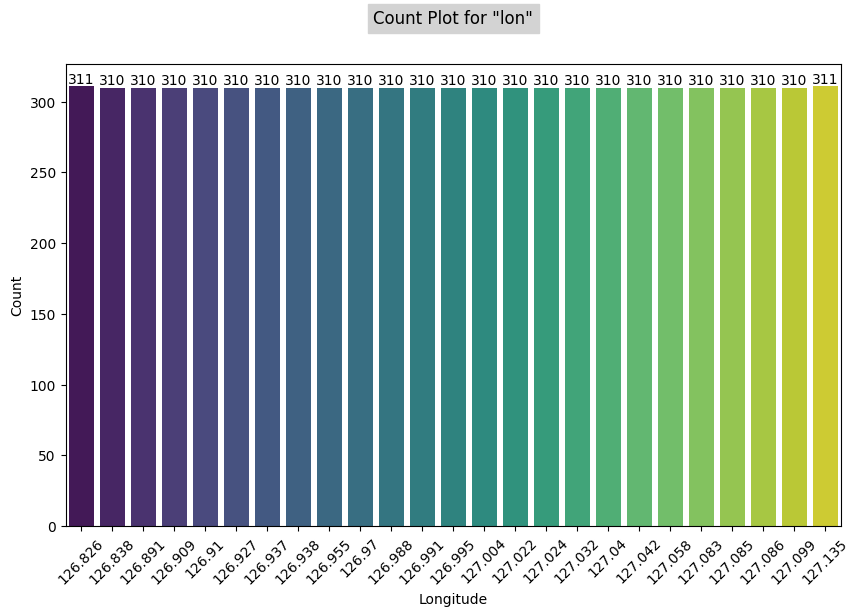

In [60]:
plt.figure(figsize=(10, 6))

ax=sns.countplot(data=df, x='lon', palette='viridis')
for i in ax.containers:
    ax.bar_label(i)
plt.title('Count Plot for "lon"', backgroundcolor='Lightgray', y=1.07)
plt.xlabel('Longitude')
plt.ylabel('Count')
plt.grid(False)
plt.xticks(rotation=45)
plt.show()

>  * Out of the coordinates in the longitude, only two have a count of 311, while the rest have a count of 310.





>  * In the dataset, the vast majority of longitude coordinates have a count of 310, indicating a consistent distribution of data. However, two specific longitude coordinates have a count of 311, suggesting potential uniqueness or specific significance related to these two data points within the dataset. Further investigation is needed to understand the reasons behind this count discrepanc

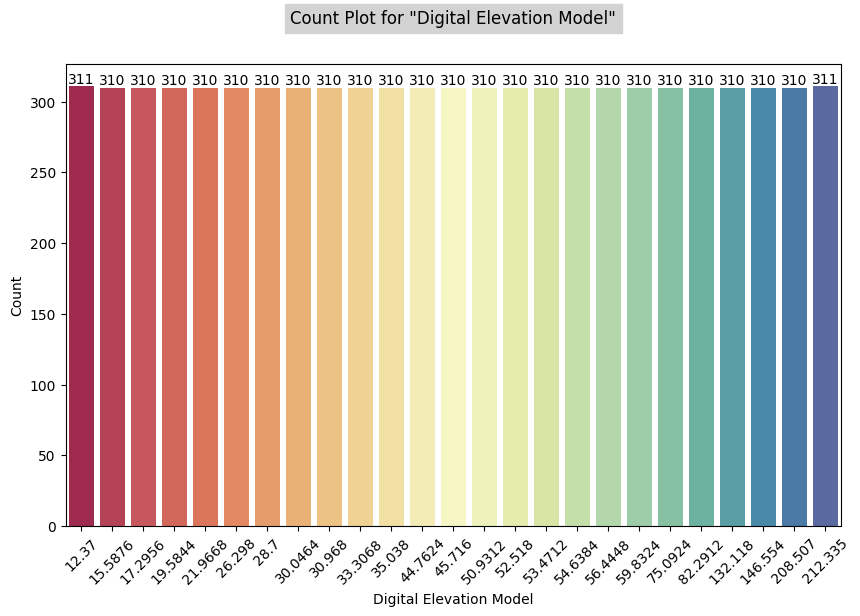

In [61]:
plt.figure(figsize=(10, 6))

ax=sns.countplot(data=df, x='DEM', palette='Spectral')
for i in ax.containers:
    ax.bar_label(i)
plt.title('Count Plot for "Digital Elevation Model"', backgroundcolor='Lightgray', y=1.07)
plt.xlabel('Digital Elevation Model')
plt.ylabel('Count')

plt.xticks(rotation=45)
plt.grid(False)
plt.show()


>  * For DEM (Digital Elevation Model) values, similarly, only two coordinates have a count of 311, while the rest exhibit a count of 310.


>  * The dataset predominantly contains elevation values with a count of 310, indicating a consistent distribution of elevation data. However, two specific elevation values have a count of 311, suggesting they may represent unique or notable points of interest within the dataset. The reasons for this small count difference should be examined within the dataset's context.

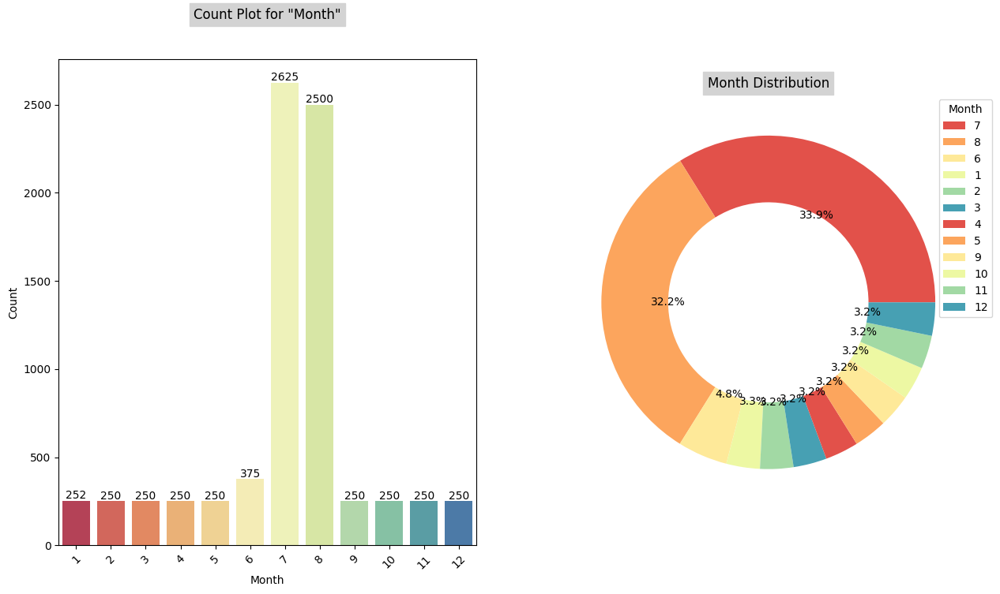

In [62]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
sns.countplot(data=df, x='Month', palette='Spectral', ax=ax1)
for i in ax1.containers:
    ax1.bar_label(i)
ax1.set_title('Count Plot for "Month"', backgroundcolor='Lightgray', y=1.07)
ax1.set_xlabel('Month')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(False)

month_counts = df['Month'].value_counts()
ax2.pie(month_counts, labels=None, autopct='%1.1f%%', colors=sns.color_palette('Spectral'), wedgeprops=dict(width=0.4))
ax2.set_title('Month Distribution', backgroundcolor='Lightgray')
ax2.legend(month_counts.index, title='Month', bbox_to_anchor=(1.05, 1))

plt.show()

**Month counts show:**

>  * Jan to May and Sep to Dec: Low count (250), likely limited data due to seasons or holidays.
>  * June: Slightly higher (375), indicating increased data availability.
>  * July and August: High counts (2625 and 2500), signifying focused data collection, possibly due to the dataset's relevance in summer months.

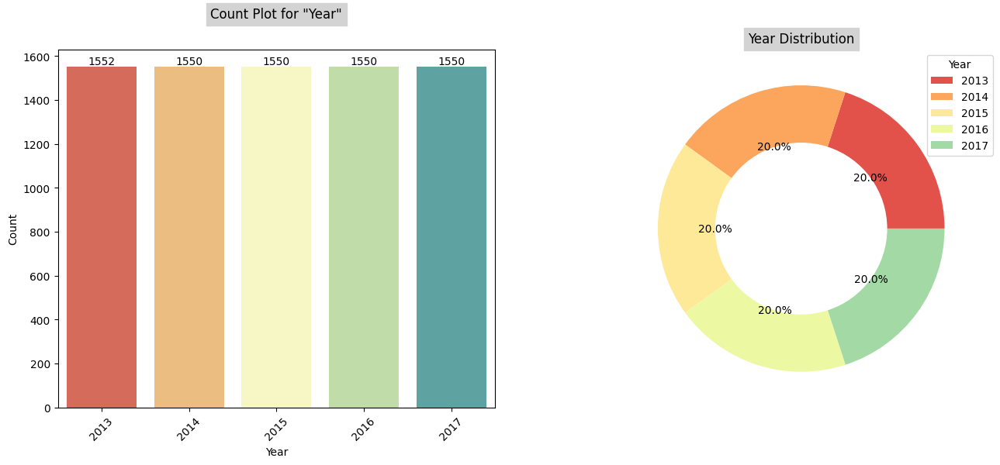

In [63]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.countplot(data=df, x='Year', palette='Spectral', ax=ax1)
for i in ax1.containers:
    ax1.bar_label(i)
ax1.set_title('Count Plot for "Year"', backgroundcolor='Lightgray', y=1.07)
ax1.set_xlabel('Year')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(False)

year_counts = df['Year'].value_counts()
ax2.pie(year_counts, labels=None, autopct='%1.1f%%', colors=sns.color_palette('Spectral'), wedgeprops=dict(width=0.4))
ax2.set_title('Year Distribution', backgroundcolor='Lightgray')
ax2.legend(year_counts.index, title='Year', bbox_to_anchor=(1.05, 1))

plt.show()

* In the year 2013, there is the lower count, which is 1522, while the years from 2014 to 2017 all share the same count of 1550.

>  **Year 2013:** This year appears to be unique in the dataset, with a lower count of 1522 compared to the other years. This suggests that the data for 2013 might be less frequent or representative in the dataset, indicating potential data collection or availability variations in that year.


>  **Years 2014 to 2017:** These years have consistent counts of 1550, which implies a more uniform or balanced distribution of data across these years. This may indicate that the dataset is more evenly populated with observations from these years, suggesting a more stable or consistent data collection process during this time period.

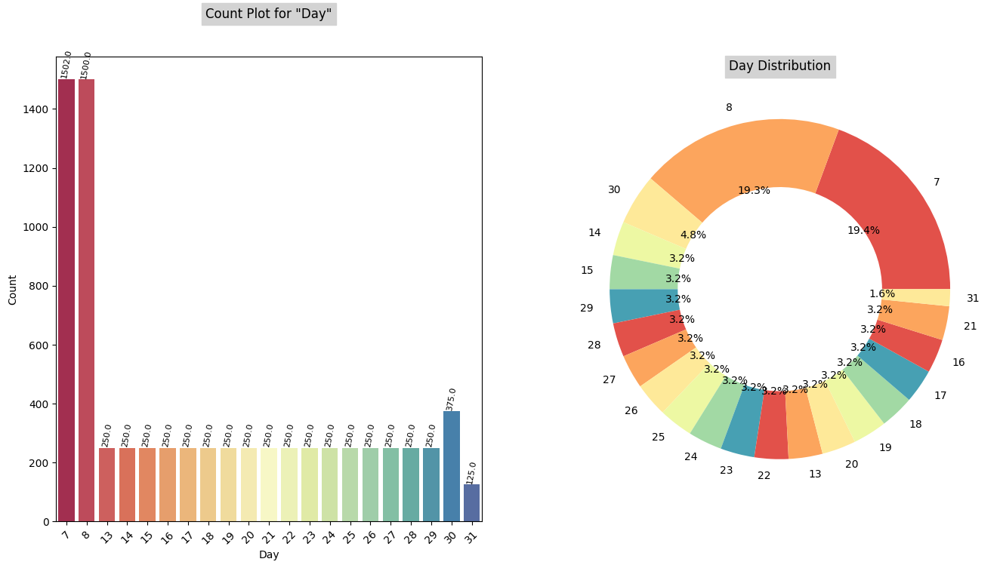

In [64]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

sns.countplot(data=df, x='Day', palette='Spectral', ax=ax1)
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=8, rotation=80)
ax1.set_title('Count Plot for "Day"', backgroundcolor='Lightgray', y=1.07)
ax1.set_xlabel('Day')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(False)

# Pie Chart
day_counts = df['Day'].value_counts()
ax2.pie(day_counts, labels=day_counts.index, autopct='%1.1f%%', colors=sns.color_palette('Spectral'), wedgeprops=dict(width=0.4))
ax2.set_title('Day Distribution', backgroundcolor='Lightgray')

plt.show()

**Day counts show:**

> **7th and 8th:** These two days have the highest collection of data, with 1502 and 1500 data points, respectively. This suggests that there is a significant focus or activity in data collection on these specific days.

> **30th:** Day 30 has 375 data points, which is notably higher than most other days. This could indicate specific events or conditions that result in increased data collection on this day.

> **13th to 29th:** These days have the same amount of data collection, with 250 data points each. This consistent count may imply that data collection practices are relatively uniform during this period, or there might be no specific events driving variations.

> **31st:** Day 31 has the lowest data collection count, with only 125 data points. This could be due to the shorter duration of some months or specific conditions that result in fewer data points.

### **"Let's conduct a thorough examination of the others variable to gain insights into its characteristics and behavior."**

### Present Maximum Temperature : Present_Tmax

Mean: 29.77
Median: 29.90
Std Dev: 2.96
Skewness: -0.26
Kurtosis: -0.39


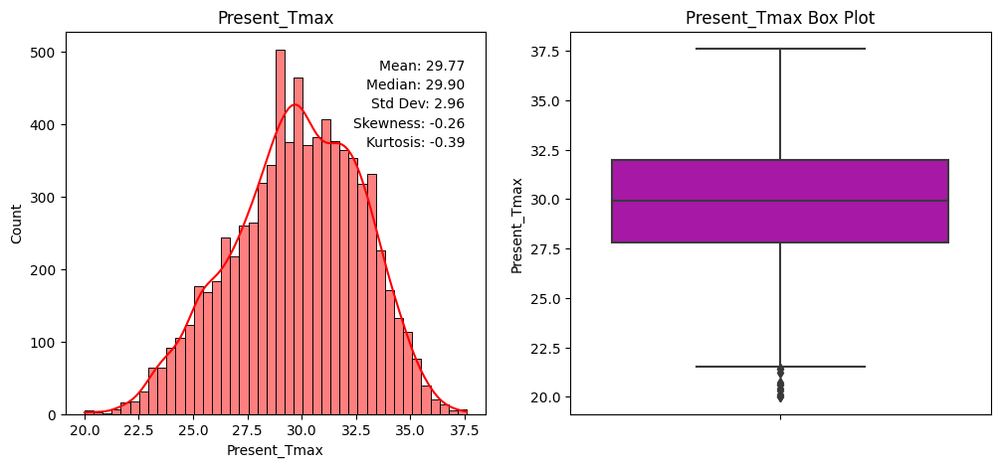

In [65]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for Present_Tmax
sns.histplot(df['Present_Tmax'], kde=True, color='r', ax=axes[0])
axes[0].set_title('Present_Tmax')
axes[0].grid(False)

mean_tmax = df['Present_Tmax'].mean()
median_tmax = df['Present_Tmax'].median()
std_dev_tmax = df['Present_Tmax'].std()
skewness_tmax = df['Present_Tmax'].skew()
kurtosis_tmax = df['Present_Tmax'].kurtosis()

for i, (stat, value) in enumerate([("Mean", mean_tmax), ("Median", median_tmax), ("Std Dev", std_dev_tmax), ("Skewness", skewness_tmax), ("Kurtosis", kurtosis_tmax)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for Present_Tmax on the second subplot
sns.boxplot(data=df, y='Present_Tmax', color='m', ax=axes[1])
axes[1].set_title('Present_Tmax Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_tmax), ("Median", median_tmax), ("Std Dev", std_dev_tmax), ("Skewness", skewness_tmax), ("Kurtosis", kurtosis_tmax)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * The close proximity of the mean and median values suggests a roughly symmetric distribution without significant outliers influencing the central tendency.

> * A standard deviation of 2.96 indicates a moderate level of data variability, signifying that values are moderately dispersed around the mean.

> * Negative skewness (-0.26) hints at a slight leftward skew, implying a somewhat longer tail on the left side of the distribution, potentially indicating a higher density of data points on the right.

> * Negative kurtosis (-0.39) characterizes a flatter distribution with thinner tails compared to a normal distribution, reducing the likelihood of extreme values or outliers.

> **In summary, this variable's data tends to exhibit relative symmetry with a moderate spread and a lower likelihood of extreme values. The negative skewness and kurtosis indicate a subtle leftward skew and a less pronounced peak compared to a normal distribution.**


### Present Minimum Temperature : Present_Tmin

Mean: 23.23
Median: 23.40
Std Dev: 2.40
Skewness: -0.37
Kurtosis: 0.23


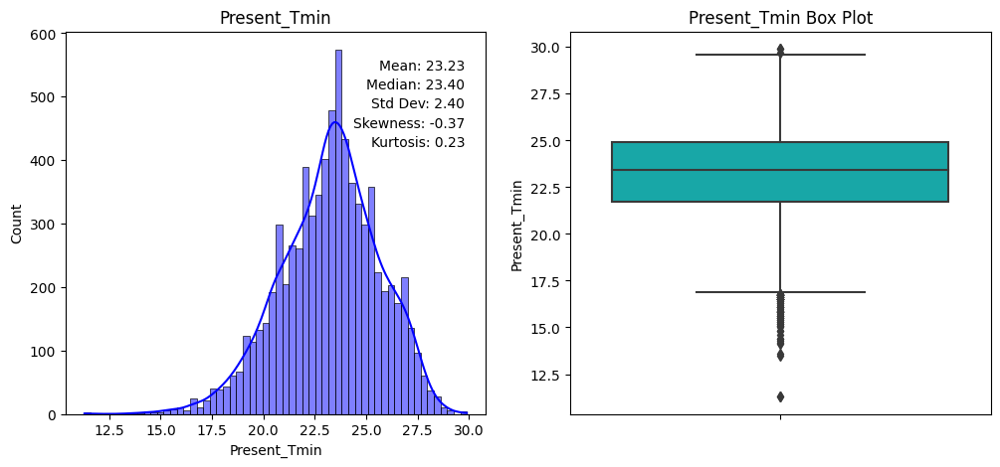

In [66]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for Present_Tmin
sns.histplot(df['Present_Tmin'], kde=True, color='b', ax=axes[0])
axes[0].set_title('Present_Tmin')
axes[0].grid(False)

mean_tmin = df['Present_Tmin'].mean()
median_tmin = df['Present_Tmin'].median()
std_dev_tmin = df['Present_Tmin'].std()
skewness_tmin = df['Present_Tmin'].skew()
kurtosis_tmin = df['Present_Tmin'].kurtosis()

for i, (stat, value) in enumerate([("Mean", mean_tmin), ("Median", median_tmin), ("Std Dev", std_dev_tmin), ("Skewness", skewness_tmin), ("Kurtosis", kurtosis_tmin)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for Present_Tmin on the second subplot
sns.boxplot(data=df, y='Present_Tmin', color='c', ax=axes[1])
axes[1].set_title('Present_Tmin Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_tmin), ("Median", median_tmin), ("Std Dev", std_dev_tmin), ("Skewness", skewness_tmin), ("Kurtosis", kurtosis_tmin)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 23.23, Median: 23.40: The data shows approximate symmetry with the mean and median values close to each other.

>  * Std Dev: 2.40: The standard deviation of 2.40 indicates a moderate level of data variability.

>  * Skewness: -0.37: A slight leftward skew is evident, indicating a somewhat longer tail on the left side of the distribution, possibly suggesting a higher concentration of data points on the right.

>  Kurtosis: 0.23: The positive kurtosis value of 0.23 suggests a distribution that is slightly more peaked than a normal distribution, hinting at a slightly higher likelihood of extreme values or outliers.

**In Summary, the data for "Present_Tmin" exhibits characteristics of moderate symmetry, moderate variability, a subtle leftward skew, and a slightly more peaked distribution. This implies a tendency for the data to be concentrated more on the right side and a slightly increased likelihood of extreme values compared to a perfectly normal distribution.**

### LDAPS Relative Humidity Minimum : LDAPS_RHmin

* **LDAPS" itself is an acronym for "Land Data Assimilation System**

Mean: 56.76
Median: 55.31
Std Dev: 14.60
Skewness: 0.30
Kurtosis: -0.50


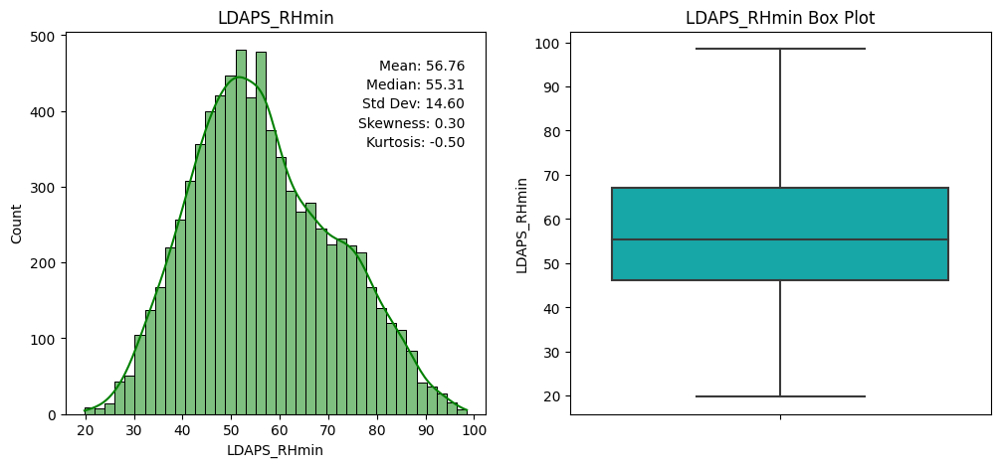

In [67]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_RHmin
sns.histplot(df['LDAPS_RHmin'], kde=True, color='g', ax=axes[0])
axes[0].set_title('LDAPS_RHmin')
axes[0].grid(False)

mean_rhmin = df['LDAPS_RHmin'].mean()
median_rhmin = df['LDAPS_RHmin'].median()
std_dev_rhmin = df['LDAPS_RHmin'].std()
skewness_rhmin = df['LDAPS_RHmin'].skew()
kurtosis_rhmin = df['LDAPS_RHmin'].kurtosis()

for i, (stat, value) in enumerate([("Mean", mean_rhmin), ("Median", median_rhmin), ("Std Dev", std_dev_rhmin), ("Skewness", skewness_rhmin), ("Kurtosis", kurtosis_rhmin)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_RHmin on the second subplot
sns.boxplot(data=df, y='LDAPS_RHmin', color='c', ax=axes[1])
axes[1].set_title('LDAPS_RHmin Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_rhmin), ("Median", median_rhmin), ("Std Dev", std_dev_rhmin), ("Skewness", skewness_rhmin), ("Kurtosis", kurtosis_rhmin)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 56.76, Median: 55.31: The data is slightly positively skewed with the mean slightly higher than the median.

> * Std Dev: 14.60: The standard deviation indicates moderate variability in the data.

> * Skewness: 0.30: The positive skewness suggests a slight tendency for higher values, with a longer tail on the right side of the distribution.

> * Kurtosis: -0.50: The negative kurtosis indicates a distribution with thinner tails and is flatter compared to a normal distribution, with fewer extreme values or outliers.

> **In summary, the data for 'LDAPS_RHmin' is slightly positively skewed with moderate variability and a flatter distribution, indicating a slightly higher concentration of data points on the right side and fewer extreme values.**




### LDAPS Relative Humidity Maximum : LDAPS_RHmax

Mean: 88.39
Median: 89.79
Std Dev: 7.16
Skewness: -0.86
Kurtosis: 0.40


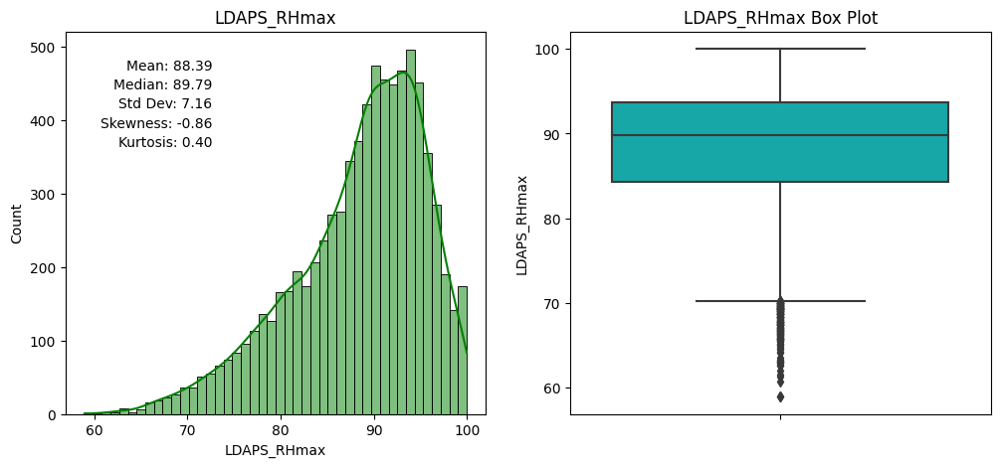

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_RHmax
sns.histplot(df['LDAPS_RHmax'], kde=True, color='g', ax=axes[0])
axes[0].set_title('LDAPS_RHmax')
axes[0].grid(False)

mean_rhmax = df['LDAPS_RHmax'].mean()
median_rhmax = df['LDAPS_RHmax'].median()
std_dev_rhmax = df['LDAPS_RHmax'].std()
skewness_rhmax = df['LDAPS_RHmax'].skew()
kurtosis_rhmax = df['LDAPS_RHmax'].kurtosis()

for i, (stat, value) in enumerate([("Mean", mean_rhmax), ("Median", median_rhmax), ("Std Dev", std_dev_rhmax), ("Skewness", skewness_rhmax), ("Kurtosis", kurtosis_rhmax)]):
    axes[0].text(0.35, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_RHmax on the second subplot
sns.boxplot(data=df, y='LDAPS_RHmax', color='c', ax=axes[1])
axes[1].set_title('LDAPS_RHmax Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_rhmax), ("Median", median_rhmax), ("Std Dev", std_dev_rhmax), ("Skewness", skewness_rhmax), ("Kurtosis", kurtosis_rhmax)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * The mean temperature (Mean) is 88.39, which represents the average temperature.

> *  The median temperature (Median) is 89.79, indicating that the middle temperature value in the dataset is slightly higher than the mean.

> *  The standard deviation (Std Dev) is 7.16, which signifies a moderate level of temperature variability, suggesting that the temperatures are somewhat dispersed around the mean.

> *  The negative skewness (-0.86) indicates that the temperature data is left-skewed, with a longer tail on the lower temperature side. This suggests that there is a higher concentration of temperature values on the higher side of the distribution.

> *  The positive kurtosis (0.40) suggests that the temperature distribution is slightly more peaked and has fatter tails compared to a normal distribution, indicating a higher likelihood of extreme temperature values.

> **Overall, the temperature data exhibits a left-skewed distribution with a moderate level of variability, suggesting a concentration of temperature values on the higher side and a tendency for extreme temperature values to occur more frequently.**

### LDAPS Maximum Temperature Lapse Rate : LDAPS_Tmax_lapse

Mean: 29.61
Median: 29.70
Std Dev: 2.93
Skewness: -0.23
Kurtosis: -0.00


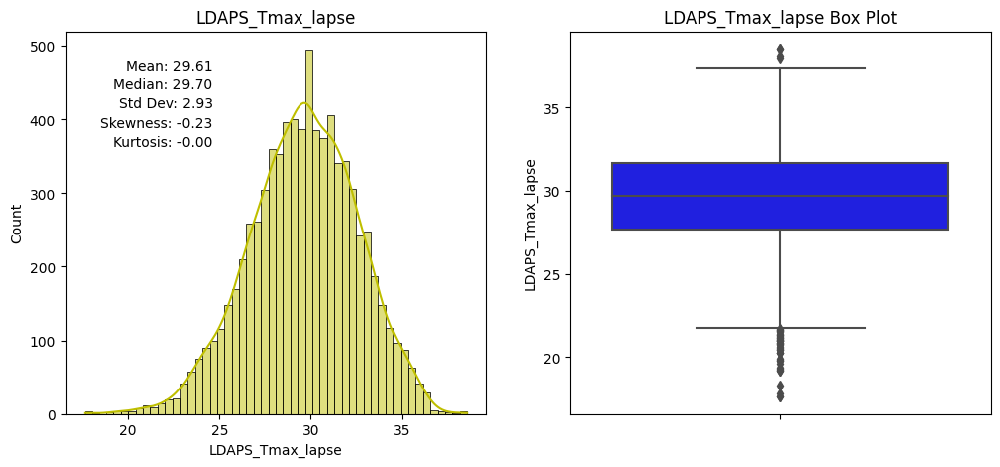

In [69]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_Tmax_lapse
sns.histplot(df['LDAPS_Tmax_lapse'], kde=True, color='y', ax=axes[0])
axes[0].set_title('LDAPS_Tmax_lapse')
axes[0].grid(False)

mean_tmax_lapse = df['LDAPS_Tmax_lapse'].mean()
median_tmax_lapse = df['LDAPS_Tmax_lapse'].median()
std_dev_tmax_lapse = df['LDAPS_Tmax_lapse'].std()
skewness_tmax_lapse = df['LDAPS_Tmax_lapse'].skew()
kurtosis_tmax_lapse = df['LDAPS_Tmax_lapse'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_tmax_lapse), ("Median", median_tmax_lapse), ("Std Dev", std_dev_tmax_lapse), ("Skewness", skewness_tmax_lapse), ("Kurtosis", kurtosis_tmax_lapse)]):
    axes[0].text(0.35, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_Tmax_lapse on the second subplot
sns.boxplot(data=df, y='LDAPS_Tmax_lapse', color='b', ax=axes[1])
axes[1].set_title('LDAPS_Tmax_lapse Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_tmax_lapse), ("Median", median_tmax_lapse), ("Std Dev", std_dev_tmax_lapse), ("Skewness", skewness_tmax_lapse), ("Kurtosis", kurtosis_tmax_lapse)]:
    print(f'{stat}: {value:.2f}')

plt.show()



> * Mean: 29.61: The average temperature for this variable is 29.61.

> * Median: 29.70: The middle temperature value in the dataset is slightly higher than the mean.

> * Std Dev: 2.93: The standard deviation of 2.93 indicates a moderate level of temperature variability, suggesting that temperatures are somewhat dispersed around the mean.

> *  Skewness: -0.23: The negative skewness of -0.23 implies a slight leftward skew, with a longer tail on the lower temperature side. This suggests a higher concentration of temperature values on the higher side of the distribution.

> * Kurtosis: -0.00: The kurtosis value of -0.00 suggests a distribution that is similar to a normal distribution.

> **In summary, the data for this variable exhibits a relatively symmetric distribution with a moderate level of variability, a slight leftward skew, and a distribution shape similar to a normal distribution.**

### LDAPS Minimum Temperature Lapse Rate : LDAPS_Tmin_lapse

Mean: 23.51
Median: 23.74
Std Dev: 2.33
Skewness: -0.58
Kurtosis: 0.54


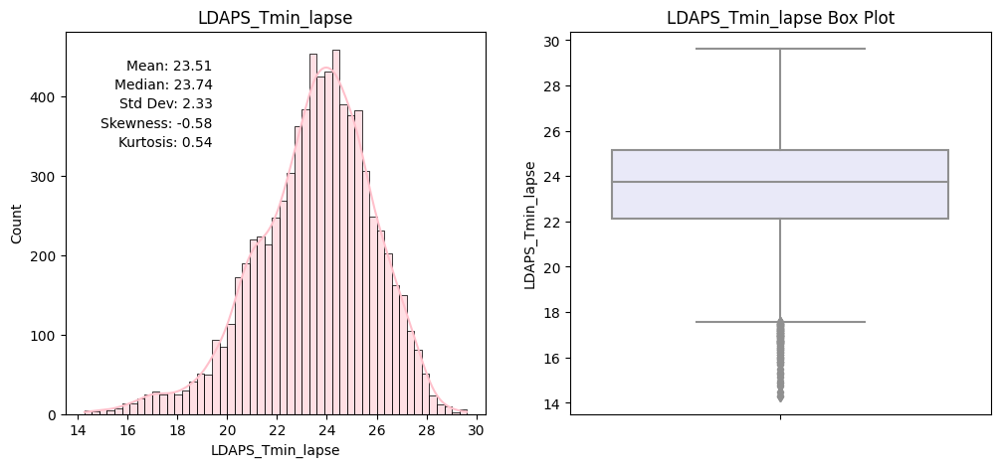

In [70]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_Tmin_lapse
sns.histplot(df['LDAPS_Tmin_lapse'], kde=True, color='pink', ax=axes[0])
axes[0].set_title('LDAPS_Tmin_lapse')
axes[0].grid(False)

mean_tmin_lapse = df['LDAPS_Tmin_lapse'].mean()
median_tmin_lapse = df['LDAPS_Tmin_lapse'].median()
std_dev_tmin_lapse = df['LDAPS_Tmin_lapse'].std()
skewness_tmin_lapse = df['LDAPS_Tmin_lapse'].skew()
kurtosis_tmin_lapse = df['LDAPS_Tmin_lapse'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_tmin_lapse), ("Median", median_tmin_lapse), ("Std Dev", std_dev_tmin_lapse), ("Skewness", skewness_tmin_lapse), ("Kurtosis", kurtosis_tmin_lapse)]):
    axes[0].text(0.35, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_Tmin_lapse on the second subplot
sns.boxplot(data=df, y='LDAPS_Tmin_lapse', color='lavender', ax=axes[1])
axes[1].set_title('LDAPS_Tmin_lapse Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_tmin_lapse), ("Median", median_tmin_lapse), ("Std Dev", std_dev_tmin_lapse), ("Skewness", skewness_tmin_lapse), ("Kurtosis", kurtosis_tmin_lapse)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> *  Mean: The average temperature for this variable is 23.51.

> * Median: The middle temperature value in the dataset is 23.74, which is slightly higher than the mean.

> *  Std Dev: The standard deviation is 2.33, indicating a moderate level of temperature variability.

> *  Skewness: The skewness value is -0.58, which suggests the data is left-skewed, with a longer tail on the lower temperature side.

> *  Kurtosis: The kurtosis value is 0.54, indicating a distribution that is more peaked and has fatter tails compared to a normal distribution. This suggests a higher likelihood of extreme temperature values.

> **In summary, the temperature data for "LDAPS_Tmin_lapse" appears to be left-skewed with moderate variability and a tendency for extreme temperature values to occur more frequently.**

### LDAPS Wind Speed : LDAPS_WS

Mean: 7.09
Median: 6.55
Std Dev: 2.17
Skewness: 1.58
Kurtosis: 3.78


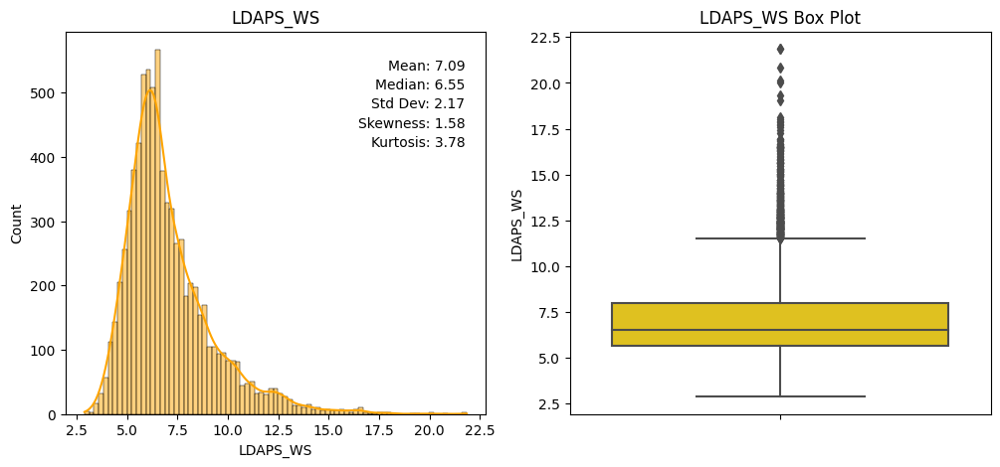

In [71]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_WS
sns.histplot(df['LDAPS_WS'], kde=True, color='orange', ax=axes[0])
axes[0].set_title('LDAPS_WS')
axes[0].grid(False)

mean_ws = df['LDAPS_WS'].mean()
median_ws = df['LDAPS_WS'].median()
std_dev_ws = df['LDAPS_WS'].std()
skewness_ws = df['LDAPS_WS'].skew()
kurtosis_ws = df['LDAPS_WS'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_ws), ("Median", median_ws), ("Std Dev", std_dev_ws), ("Skewness", skewness_ws), ("Kurtosis", kurtosis_ws)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_WS on the second subplot
sns.boxplot(data=df, y='LDAPS_WS', color='gold', ax=axes[1])
axes[1].set_title('LDAPS_WS Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_ws), ("Median", median_ws), ("Std Dev", std_dev_ws), ("Skewness", skewness_ws), ("Kurtosis", kurtosis_ws)]:
    print(f'{stat}: {value:.2f}')

plt.show()


> * The data is positively skewed, indicating a longer tail on the right side of the distribution.
> * Positive kurtosis suggests a more peaked distribution with heavier tails, indicating a higher likelihood of extreme values.
> * The mean and median values are relatively close, indicating a roughly symmetric distribution with no significant outliers influencing the central tendency.
> * The standard deviation suggests moderate variability in the data, signifying moderate dispersion around the mean.

### LDAPS Latent Heat Flux: LDAPS_LH

Mean: 62.45
Median: 56.87
Std Dev: 33.57
Skewness: 0.68
Kurtosis: 0.14


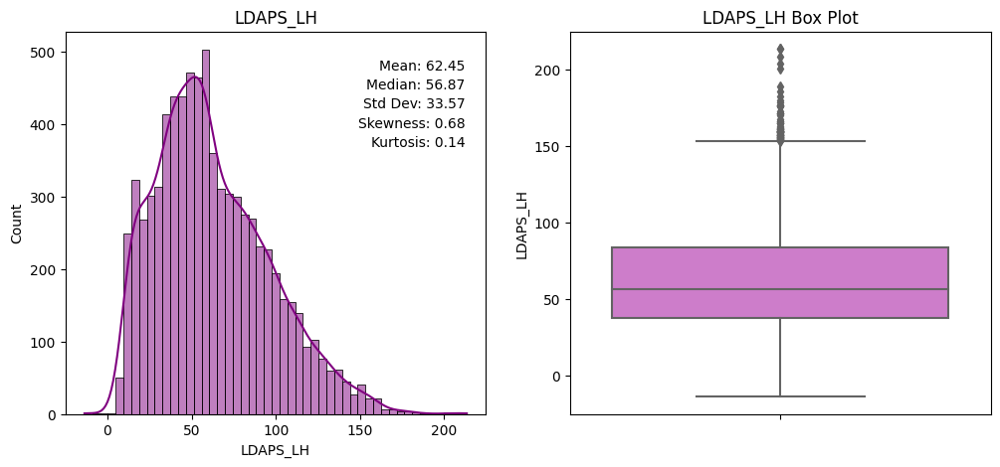

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_LH
sns.histplot(df['LDAPS_LH'], kde=True, color='purple', ax=axes[0])
axes[0].set_title('LDAPS_LH')
axes[0].grid(False)

mean_lh = df['LDAPS_LH'].mean()
median_lh = df['LDAPS_LH'].median()
std_dev_lh = df['LDAPS_LH'].std()
skewness_lh = df['LDAPS_LH'].skew()
kurtosis_lh = df['LDAPS_LH'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_lh), ("Median", median_lh), ("Std Dev", std_dev_lh), ("Skewness", skewness_lh), ("Kurtosis", kurtosis_lh)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_LH on the second subplot
sns.boxplot(data=df, y='LDAPS_LH', color='orchid', ax=axes[1])
axes[1].set_title('LDAPS_LH Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_lh), ("Median", median_lh), ("Std Dev", std_dev_lh), ("Skewness", skewness_lh), ("Kurtosis", kurtosis_lh)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 62.45: The average year in the dataset is 62.45.
Median: 56.87: The middle value of the years is 56.87, indicating a slightly left-skewed distribution.
> * Std Dev: 33.57: The standard deviation of 33.57 shows a considerable variability in the years, with values spread out from the mean.
> * Skewness: 0.68: The positive skewness of 0.68 suggests that the data is > * slightly right-skewed, with a longer tail on the right side.
> * Kurtosis: 0.14: The positive kurtosis of 0.14 indicates that the distribution is slightly more peaked and has thicker tails compared to a normal distribution, implying a slightly higher likelihood of extreme values.

> **In summary, the 'Year' data shows a moderately right-skewed distribution with a notable spread of values and a slight tendency for extreme values to occur more frequently.**

### LDAPS Cloud Cover Type 1: LDAPS_CC1

**Next day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97**

Mean: 0.37
Median: 0.32
Std Dev: 0.26
Skewness: 0.47
Kurtosis: -0.90


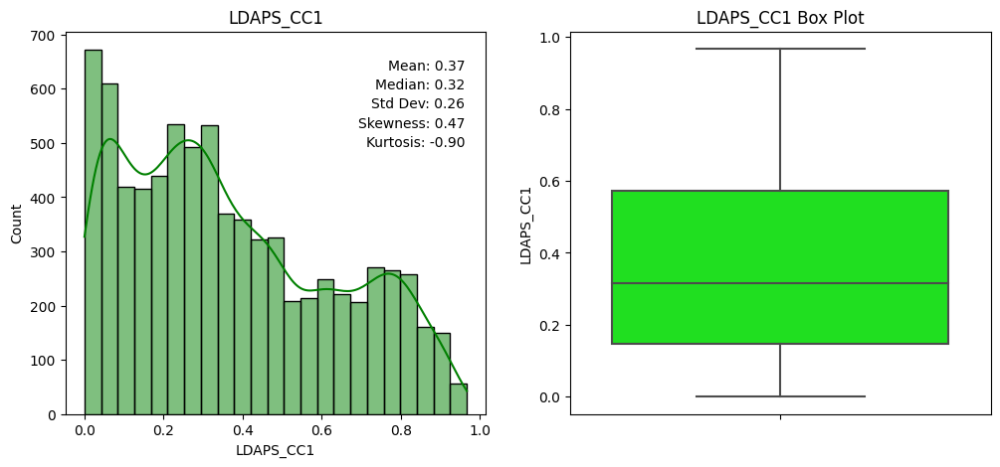

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_CC1
sns.histplot(df['LDAPS_CC1'], kde=True, color='green', ax=axes[0])
axes[0].set_title('LDAPS_CC1')
axes[0].grid(False)

mean_cc1 = df['LDAPS_CC1'].mean()
median_cc1 = df['LDAPS_CC1'].median()
std_dev_cc1 = df['LDAPS_CC1'].std()
skewness_cc1 = df['LDAPS_CC1'].skew()
kurtosis_cc1 = df['LDAPS_CC1'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_cc1), ("Median", median_cc1), ("Std Dev", std_dev_cc1), ("Skewness", skewness_cc1), ("Kurtosis", kurtosis_cc1)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_CC1 on the second subplot
sns.boxplot(data=df, y='LDAPS_CC1', color='lime', ax=axes[1])
axes[1].set_title('LDAPS_CC1 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_cc1), ("Median", median_cc1), ("Std Dev", std_dev_cc1), ("Skewness", skewness_cc1), ("Kurtosis", kurtosis_cc1)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> *  Mean: 0.37: The mean value of 0.37 represents the average of the dataset.
> *  Median: 0.32: The median value of 0.32 indicates that the middle value in the dataset is slightly lower than the mean.
Std Dev: 0.26: The standard deviation of 0.26 suggests a moderate level of variability in the data, meaning that the values are somewhat dispersed around the mean.
> *  Skewness: 0.47: The positive skewness of 0.47 suggests that the data is right-skewed, with a longer tail on the right side of the distribution. This indicates a higher concentration of data points on the left side.
> *  Kurtosis: -0.90: The negative kurtosis of -0.90 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.
> * There are no outliers visible in the box plot, it suggests that the data is relatively free from extreme values that are far from the central distribution.

> **In summary, the data exhibits a right-skewed distribution with a moderate level of variability and a concentration of data points on the left side of the distribution. The negative kurtosis further suggests that extreme values or outliers are less likely in this dataset.**

### LDAPS Cloud Cover Type 2: LDAPS_CC2

**Next day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97**

Mean: 0.36
Median: 0.31
Std Dev: 0.26
Skewness: 0.48
Kurtosis: -0.83


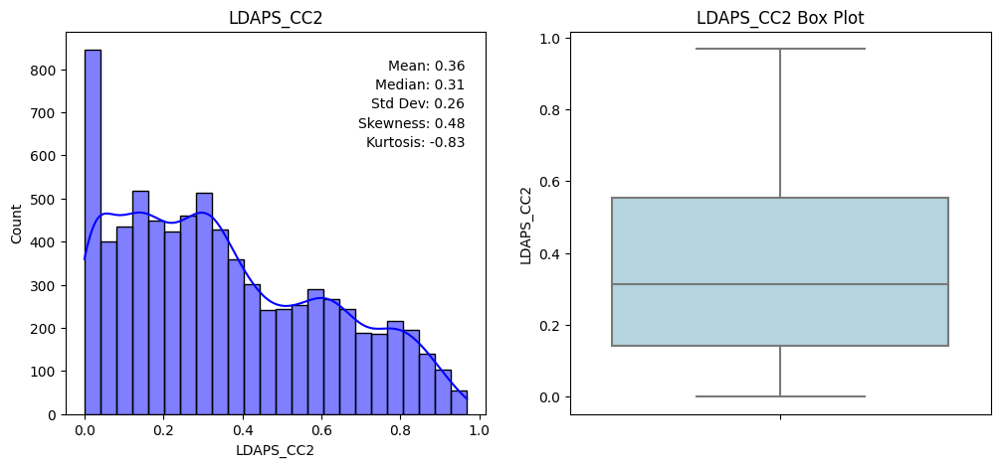

In [74]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_CC2
sns.histplot(df['LDAPS_CC2'], kde=True, color='blue', ax=axes[0])
axes[0].set_title('LDAPS_CC2')
axes[0].grid(False)

mean_cc2 = df['LDAPS_CC2'].mean()
median_cc2 = df['LDAPS_CC2'].median()
std_dev_cc2 = df['LDAPS_CC2'].std()
skewness_cc2 = df['LDAPS_CC2'].skew()
kurtosis_cc2 = df['LDAPS_CC2'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_cc2), ("Median", median_cc2), ("Std Dev", std_dev_cc2), ("Skewness", skewness_cc2), ("Kurtosis", kurtosis_cc2)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_CC2 on the second subplot
sns.boxplot(data=df, y='LDAPS_CC2', color='lightblue', ax=axes[1])
axes[1].set_title('LDAPS_CC2 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_cc2), ("Median", median_cc2), ("Std Dev", std_dev_cc2), ("Skewness", skewness_cc2), ("Kurtosis", kurtosis_cc2)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.36: The mean value of 0.36 represents the average of the dataset.
> * Median: 0.31: The median value of 0.31 indicates that the middle value in the dataset is slightly lower than the mean, suggesting a rightward skew.
> * Std Dev: 0.26: The standard deviation of 0.26 suggests a moderate level of variability in the data, meaning that the values are somewhat dispersed around the mean.
> * Skewness: 0.48: The positive skewness of 0.48 suggests that the data is right-skewed, with a longer tail on the right side of the distribution. This indicates a higher concentration of data points on the left side.
> * Kurtosis: -0.83: The negative kurtosis of -0.83 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.
> * There are no outliers visible in the box plot, it suggests that the data is relatively free from extreme values that are far from the central distribution.

> **In summary, the data exhibits a right-skewed distribution with a moderate level of variability and a concentration of data points on the left side of the distribution. The negative kurtosis further suggests that extreme values or outliers are less likely in this dataset.**

### LDAPS Cloud Cover Type 3: LDAPS_CC3

**Next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98**


Mean: 0.32
Median: 0.26
Std Dev: 0.25
Skewness: 0.65
Kurtosis: -0.60


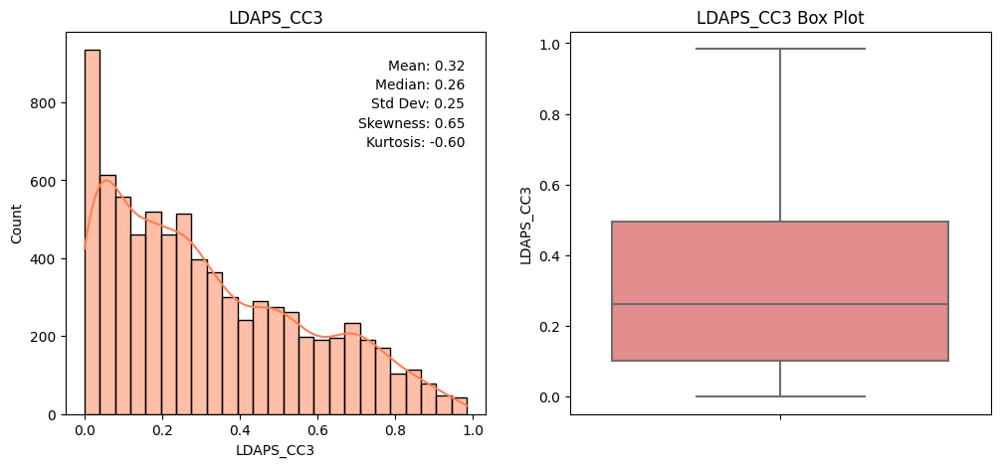

In [75]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_CC3
sns.histplot(df['LDAPS_CC3'], kde=True, color='coral', ax=axes[0])
axes[0].set_title('LDAPS_CC3')
axes[0].grid(False)

mean_cc3 = df['LDAPS_CC3'].mean()
median_cc3 = df['LDAPS_CC3'].median()
std_dev_cc3 = df['LDAPS_CC3'].std()
skewness_cc3 = df['LDAPS_CC3'].skew()
kurtosis_cc3 = df['LDAPS_CC3'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_cc3), ("Median", median_cc3), ("Std Dev", std_dev_cc3), ("Skewness", skewness_cc3), ("Kurtosis", kurtosis_cc3)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_CC3 on the second subplot
sns.boxplot(data=df, y='LDAPS_CC3', color='lightcoral', ax=axes[1])
axes[1].set_title('LDAPS_CC3 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_cc3), ("Median", median_cc3), ("Std Dev", std_dev_cc3), ("Skewness", skewness_cc3), ("Kurtosis", kurtosis_cc3)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.32: The mean value of 0.32 represents the average of the dataset.
Median: 0.26: The median value of 0.26 indicates that the middle value in the dataset is slightly lower than the mean.
> * Std Dev: 0.25: The standard deviation of 0.25 suggests a moderate level of variability in the data, meaning that the values are somewhat dispersed around the mean.
> * Skewness: 0.65: The positive skewness of 0.65 suggests that the data is right-skewed, with a longer tail on the right side of the distribution. This indicates a higher concentration of data points on the left side.
> * Kurtosis: -0.60: The negative kurtosis of -0.60 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.
> * There are no outliers visible in the box plot, it suggests that the data is relatively free from extreme values that are far from the central distribution.

> **In summary, the data exhibits a right-skewed distribution with a moderate level of variability and a concentration of data points on the left side of the distribution. The negative kurtosis further suggests that extreme values or outliers are less likely in this dataset.**

### LDAPS Cloud Cover Type 4: LDAPS_CC4

**Next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97**

Mean: 0.30
Median: 0.23
Std Dev: 0.25
Skewness: 0.67
Kurtosis: -0.69


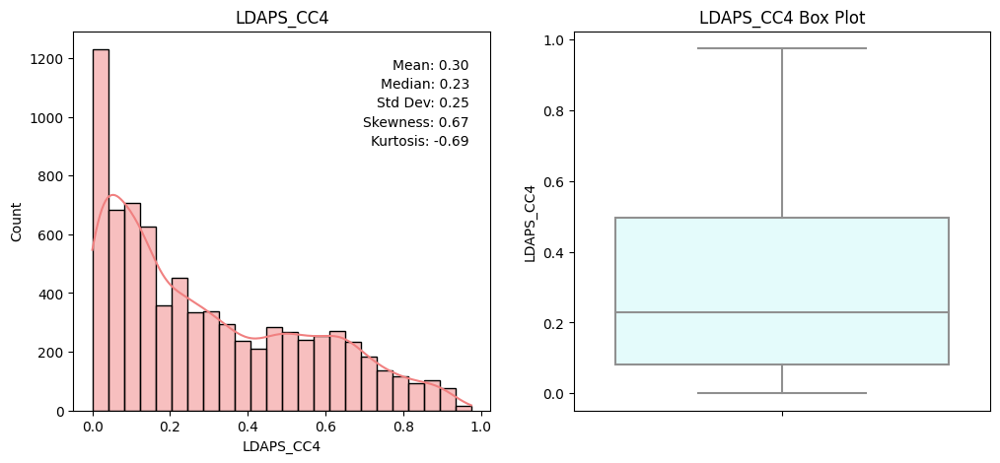

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for LDAPS_CC4
sns.histplot(df['LDAPS_CC4'], kde=True, color='lightcoral', ax=axes[0])  # Modify the color here
axes[0].set_title('LDAPS_CC4')
axes[0].grid(False)

mean_cc4 = df['LDAPS_CC4'].mean()
median_cc4 = df['LDAPS_CC4'].median()
std_dev_cc4 = df['LDAPS_CC4'].std()
skewness_cc4 = df['LDAPS_CC4'].skew()
kurtosis_cc4 = df['LDAPS_CC4'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_cc4), ("Median", median_cc4), ("Std Dev", std_dev_cc4), ("Skewness", skewness_cc4), ("Kurtosis", kurtosis_cc4)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_CC4 on the second subplot
sns.boxplot(data=df, y='LDAPS_CC4', color='lightcyan', ax=axes[1])  # Modify the color here
axes[1].set_title('LDAPS_CC4 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_cc4), ("Median", median_cc4), ("Std Dev", std_dev_cc4), ("Skewness", skewness_cc4), ("Kurtosis", kurtosis_cc4)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.30: The mean value of 0.30 represents the average of the dataset.
> * Median: 0.23: The median value of 0.23 indicates that the middle value in the dataset is slightly lower than the mean.
> * Std Dev: 0.25: The standard deviation of 0.25 suggests a moderate level of variability in the data, meaning that the values are somewhat dispersed around the mean.
> * Skewness: 0.67: The positive skewness of 0.67 suggests that the data is right-skewed, with a longer tail on the right side of the distribution. This indicates a higher concentration of data points on the left side.
> * Kurtosis: -0.69: The negative kurtosis of -0.69 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.
> * There are no outliers visible in the box plot, it suggests that the data is relatively free from extreme values that are far from the central distribution.

> **In summary, the data exhibits a right-skewed distribution with a moderate level of variability and a concentration of data points on the left side of the distribution. The negative kurtosis further suggests that extreme values or outliers are less likely in this dataset.**

### LDAPS Precipitation Type 1: LDAPS_PPT1

* Type of precipitation (e.g., rain, snow)

**Next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7**

Mean: 0.59
Median: 0.00
Std Dev: 1.94
Skewness: 5.40
Kurtosis: 37.01


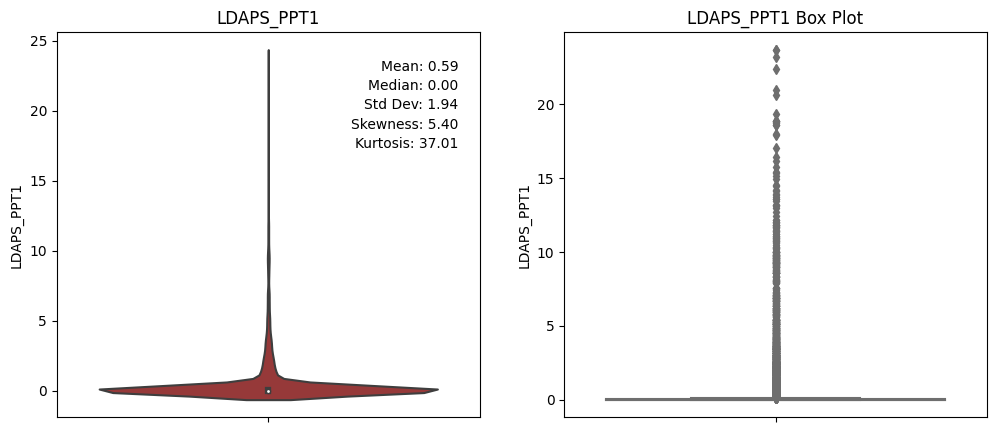

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot violin plot and add statistical summaries for LDAPS_PPT1
sns.violinplot(data=df, y='LDAPS_PPT1', color='brown', ax=axes[0])  # Modify the color here
axes[0].set_title('LDAPS_PPT1')
axes[0].grid(False)

mean_ppt1 = df['LDAPS_PPT1'].mean()
median_ppt1 = df['LDAPS_PPT1'].median()
std_dev_ppt1 = df['LDAPS_PPT1'].std()
skewness_ppt1 = df['LDAPS_PPT1'].skew()
kurtosis_ppt1 = df['LDAPS_PPT1'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_ppt1), ("Median", median_ppt1), ("Std Dev", std_dev_ppt1), ("Skewness", skewness_ppt1), ("Kurtosis", kurtosis_ppt1)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_PPT1 on the second subplot
sns.boxplot(data=df, y='LDAPS_PPT1', color='lightcoral', ax=axes[1])  # Modify the color here
axes[1].set_title('LDAPS_PPT1 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_ppt1), ("Median", median_ppt1), ("Std Dev", std_dev_ppt1), ("Skewness", skewness_ppt1), ("Kurtosis", kurtosis_ppt1)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.59: The mean value of 0.59 represents the average of the dataset.
> * Median: 0.00: The median value of 0.00 indicates that the middle value in the dataset is much lower than the mean. This suggests that there may be a significant number of data points with very low values.
> * Std Dev: 1.94: The relatively high standard deviation of 1.94 indicates a considerable level of variability in the data. The data points are quite dispersed around the mean.
> * Skewness: 5.40: The positive skewness of 5.40 indicates that the data is heavily right-skewed, with an extremely long tail on the right side of the distribution. This implies a concentration of data points on the left side and a significant number of high values on the right.
> * Kurtosis: 37.01: The very high positive kurtosis of 37.01 suggests an extremely peaked distribution with extremely heavy tails compared to a normal distribution. This indicates a very high likelihood of extreme values or outliers in the data.

> **In summary, the data exhibits a right-skewed distribution with significant variability and a concentration of data points on the left side. The extremely high kurtosis further suggests a distribution with very heavy tails and a high likelihood of extreme values or outliers.**






### LDAPS Precipitation Type 2: LDAPS_PPT2

**Next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6**

Mean: 0.48
Median: 0.00
Std Dev: 1.75
Skewness: 5.78
Kurtosis: 42.74


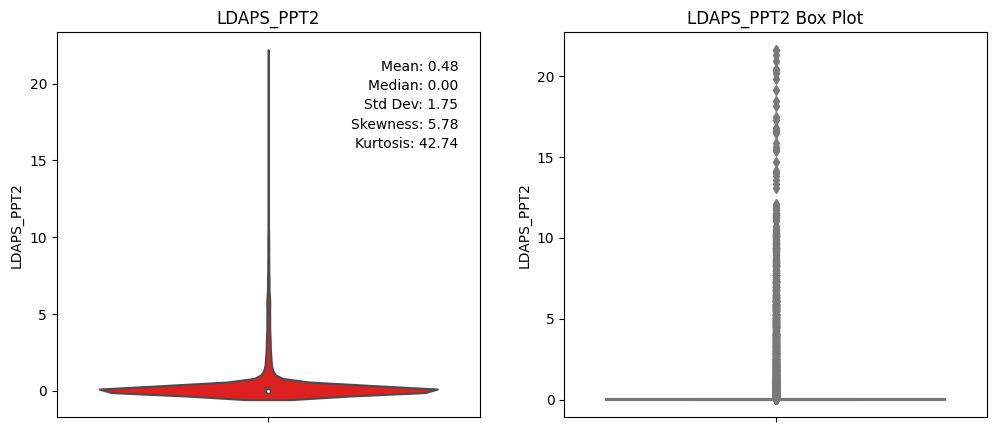

In [78]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot violin plot and add statistical summaries for LDAPS_PPT2
sns.violinplot(data=df, y='LDAPS_PPT2', color='red', ax=axes[0])  # Modify the color here
axes[0].set_title('LDAPS_PPT2')
axes[0].grid(False)

mean_ppt2 = df['LDAPS_PPT2'].mean()
median_ppt2 = df['LDAPS_PPT2'].median()
std_dev_ppt2 = df['LDAPS_PPT2'].std()
skewness_ppt2 = df['LDAPS_PPT2'].skew()
kurtosis_ppt2 = df['LDAPS_PPT2'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_ppt2), ("Median", median_ppt2), ("Std Dev", std_dev_ppt2), ("Skewness", skewness_ppt2), ("Kurtosis", kurtosis_ppt2)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_PPT2 on the second subplot
sns.boxplot(data=df, y='LDAPS_PPT2', color='lightblue', ax=axes[1])  # Modify the color here
axes[1].set_title('LDAPS_PPT2 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_ppt2), ("Median", median_ppt2), ("Std Dev", std_dev_ppt2), ("Skewness", skewness_ppt2), ("Kurtosis", kurtosis_ppt2)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.48: The mean value of 0.48 represents the average of the dataset.
> * Median: 0.00: The median value of 0.00 indicates that the middle value in the dataset is much lower than the mean. This suggests that there may be a significant number of data points with very low values.
> * Std Dev: 1.75: The relatively high standard deviation of 1.75 indicates a considerable level of variability in the data. The data points are quite dispersed around the mean.
> * Skewness: 5.78: The very high positive skewness of 5.78 indicates that the data is heavily right-skewed, with an extremely long tail on the right side of the distribution. This implies a concentration of data points on the left side and a significant number of high values on the right.
> * Kurtosis: 42.74: The exceptionally high positive kurtosis of 42.74 suggests an extremely peaked distribution with extremely heavy tails compared to a normal distribution. This indicates an extraordinarily high likelihood of extreme values or outliers in the data.

> **In summary, the data exhibits a right-skewed distribution with significant variability and a concentration of data points on the left side. The extremely high kurtosis further suggests a distribution with very heavy tails and an exceptionally high likelihood of extreme values or outliers.**






### LDAPS Precipitation Type 3: LDAPS_PPT3

**Next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8**

Mean: 0.28
Median: 0.00
Std Dev: 1.16
Skewness: 6.46
Kurtosis: 50.51


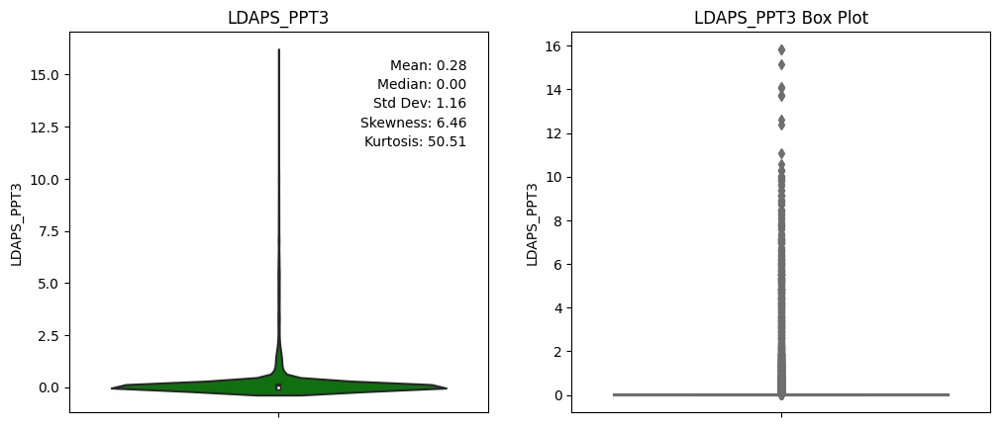

In [79]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot violin plot and add statistical summaries for LDAPS_PPT3
sns.violinplot(data=df, y='LDAPS_PPT3', color='green', ax=axes[0])  # Modify the color here
axes[0].set_title('LDAPS_PPT3')
axes[0].grid(False)

mean_ppt3 = df['LDAPS_PPT3'].mean()
median_ppt3 = df['LDAPS_PPT3'].median()
std_dev_ppt3 = df['LDAPS_PPT3'].std()
skewness_ppt3 = df['LDAPS_PPT3'].skew()
kurtosis_ppt3 = df['LDAPS_PPT3'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_ppt3), ("Median", median_ppt3), ("Std Dev", std_dev_ppt3), ("Skewness", skewness_ppt3), ("Kurtosis", kurtosis_ppt3)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_PPT3 on the second subplot
sns.boxplot(data=df, y='LDAPS_PPT3', color='lightcoral', ax=axes[1])  # Modify the color here
axes[1].set_title('LDAPS_PPT3 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_ppt3), ("Median", median_ppt3), ("Std Dev", std_dev_ppt3), ("Skewness", skewness_ppt3), ("Kurtosis", kurtosis_ppt3)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.28: The mean value of 0.28 represents the average of the dataset.
> * Median: 0.00: The median value of 0.00 indicates that the middle value in the dataset is much lower than the mean. This suggests that there may be a significant number of data points with very low values.
> * Std Dev: 1.16: The standard deviation of 1.16 indicates some level of variability in the data, but it's not as high as the skewness and kurtosis values might suggest. The data points are dispersed around the mean to a certain extent.
> * Skewness: 6.46: The extremely high positive skewness of 6.46 indicates that the data is heavily right-skewed, with an extremely long tail on the right side of the distribution. This implies a strong concentration of data points on the left side and an exceptionally high number of high values on the right.
> * Kurtosis: 50.51: The exceptionally high positive kurtosis of 50.51 suggests an extraordinarily peaked distribution with extremely heavy tails compared to a normal distribution. This indicates an exceptionally high likelihood of extreme values or outliers in the data.

> **In summary, the data exhibits an extremely right-skewed distribution with a notable level of variability and an exceptionally high concentration of data points on the left side. The extremely high kurtosis further suggests a distribution with exceptionally heavy tails and an exceptionally high likelihood of extreme values or outliers.**

### LDAPS Precipitation Type 4: LDAPS_PPT4

**Next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7**

Mean: 0.27
Median: 0.00
Std Dev: 1.20
Skewness: 6.83
Kurtosis: 54.88


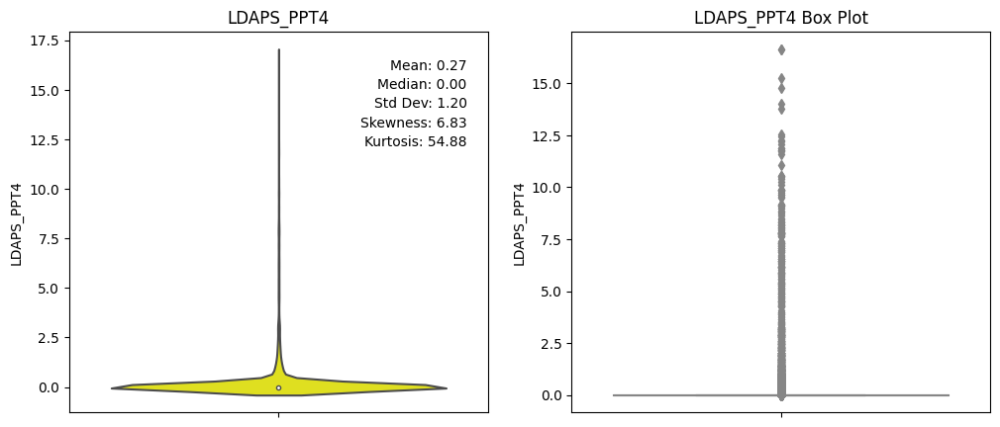

In [80]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot violin plot and add statistical summaries for LDAPS_PPT4
sns.violinplot(data=df, y='LDAPS_PPT4', color='Yellow', ax=axes[0])  # Modify the color here
axes[0].set_title('LDAPS_PPT4')
axes[0].grid(False)

mean_ppt4 = df['LDAPS_PPT4'].mean()
median_ppt4 = df['LDAPS_PPT4'].median()
std_dev_ppt4 = df['LDAPS_PPT4'].std()
skewness_ppt4 = df['LDAPS_PPT4'].skew()
kurtosis_ppt4 = df['LDAPS_PPT4'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_ppt4), ("Median", median_ppt4), ("Std Dev", std_dev_ppt4), ("Skewness", skewness_ppt4), ("Kurtosis", kurtosis_ppt4)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for LDAPS_PPT4 on the second subplot
sns.boxplot(data=df, y='LDAPS_PPT4', color='pink', ax=axes[1])  # Modify the color here
axes[1].set_title('LDAPS_PPT4 Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_ppt4), ("Median", median_ppt4), ("Std Dev", std_dev_ppt4), ("Skewness", skewness_ppt4), ("Kurtosis", kurtosis_ppt4)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 0.27: The mean value of 0.27 represents the average of the dataset.
> * Median: 0.00: The median value of 0.00 indicates that the middle value in the dataset is much lower than the mean. This suggests that there may be a significant number of data points with very low values.
> * Std Dev: 1.20: The standard deviation of 1.20 indicates some level of variability in the data, but it's not as high as the skewness and kurtosis values might suggest. The data points are dispersed around the mean to a certain extent.
> * Skewness: 6.83: The extremely high positive skewness of 6.83 indicates that the data is heavily right-skewed, with an extremely long tail on the right side of the distribution. This implies a strong concentration of data points on the left side and an exceptionally high number of high values on the right.
> * Kurtosis: 54.88: The exceptionally high positive kurtosis of 54.88 suggests an extraordinarily peaked distribution with extremely heavy tails compared to a normal distribution. This indicates an exceptionally high likelihood of extreme values or outliers in the data.

> **In summary, the data exhibits an extremely right-skewed distribution with a notable level of variability and an exceptionally high concentration of data points on the left side. The extremely high kurtosis further suggests a distribution with exceptionally heavy tails and an exceptionally high likelihood of extreme values or outliers.**

### Latitude : lat

Mean: 37.54
Median: 37.55
Std Dev: 0.05
Skewness: 0.09
Kurtosis: -0.87


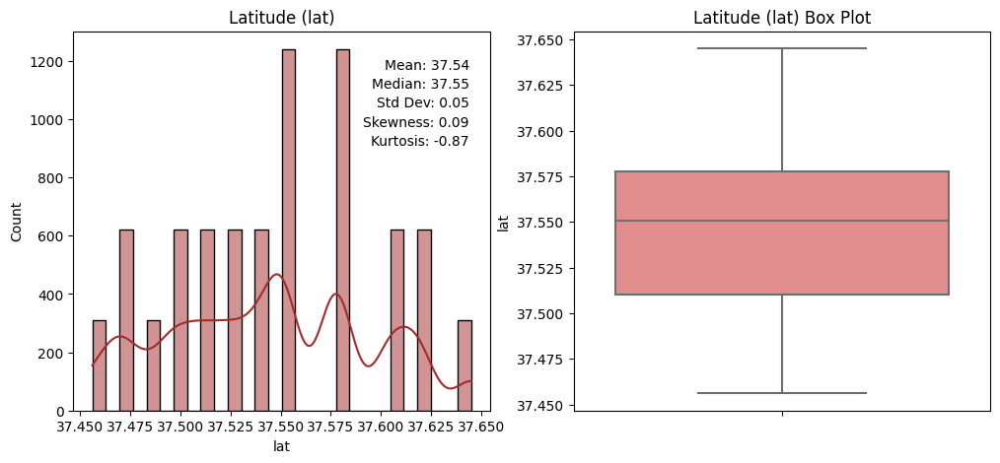

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'lat'
sns.histplot(df['lat'], kde=True, color='brown', ax=axes[0])
axes[0].set_title('Latitude (lat)')
axes[0].grid(False)

mean_lat = df['lat'].mean()
median_lat = df['lat'].median()
std_dev_lat = df['lat'].std()
skewness_lat = df['lat'].skew()
kurtosis_lat = df['lat'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_lat), ("Median", median_lat), ("Std Dev", std_dev_lat), ("Skewness", skewness_lat), ("Kurtosis", kurtosis_lat)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'lat' on the second subplot
sns.boxplot(data=df, y='lat', color='lightcoral', ax=axes[1])
axes[1].set_title('Latitude (lat) Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_lat), ("Median", median_lat), ("Std Dev", std_dev_lat), ("Skewness", skewness_lat), ("Kurtosis", kurtosis_lat)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 37.54: The mean value of 37.54 represents the average of the dataset. It indicates that the data values are clustered around this central value.

> * Median: 37.55: The median value of 37.55 is very close to the mean, suggesting that the data has a symmetric distribution without significant outliers affecting the central tendency.

> * Std Dev: 0.05: The low standard deviation of 0.05 indicates very low variability in the data, with values closely packed around the mean.

> * Skewness: 0.09: The positive skewness of 0.09 implies a slight rightward skew in the data, meaning there may be a slightly longer tail on the right side of the distribution.

> * Kurtosis: -0.87: The negative kurtosis of -0.87 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This suggests a lower likelihood of extreme values or outliers in the data.

> * The absence of outliers in box plot is consistent with the low variability and the relatively symmetric distribution you observed from the mean, median, standard deviation, skewness, and kurtosis values.

> **In summary, the data for this variable appears to be symmetric with very low variability and a minimal chance of extreme values. The negative kurtosis reinforces the observation of a flatter distribution with thinner tails compared to a normal distribution, indicating that extreme values or outliers are unlikely.**

### Longitude : lon

Mean: 126.99
Median: 127.00
Std Dev: 0.08
Skewness: -0.29
Kurtosis: -0.63


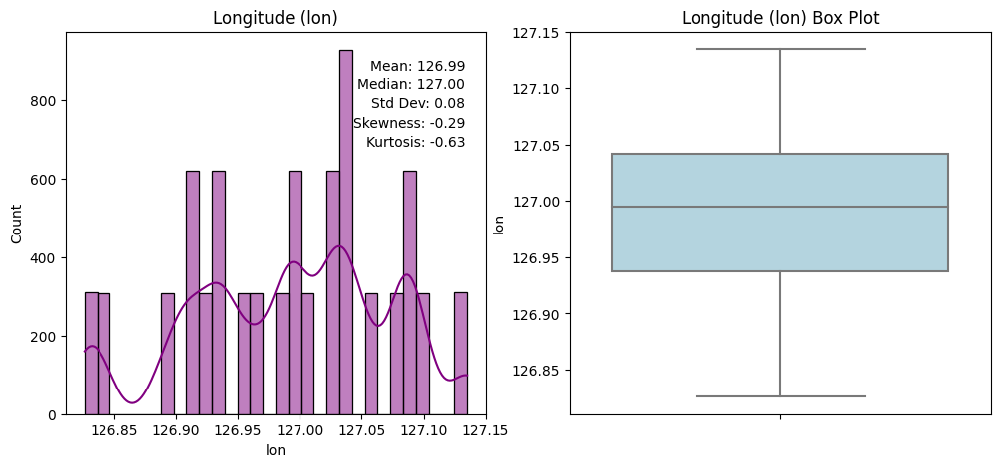

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'lon'
sns.histplot(df['lon'], kde=True, color='purple', ax=axes[0])
axes[0].set_title('Longitude (lon)')
axes[0].grid(False)

mean_lon = df['lon'].mean()
median_lon = df['lon'].median()
std_dev_lon = df['lon'].std()
skewness_lon = df['lon'].skew()
kurtosis_lon = df['lon'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_lon), ("Median", median_lon), ("Std Dev", std_dev_lon), ("Skewness", skewness_lon), ("Kurtosis", kurtosis_lon)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'lon' on the second subplot
sns.boxplot(data=df, y='lon', color='lightblue', ax=axes[1])
axes[1].set_title('Longitude (lon) Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_lon), ("Median", median_lon), ("Std Dev", std_dev_lon), ("Skewness", skewness_lon), ("Kurtosis", kurtosis_lon)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * The mean temperature of 126.99 indicates the average temperature.

> * The median temperature of 127.00 suggests that the middle temperature value in the dataset is very close to the mean.

> * The low standard deviation of 0.08 implies minimal temperature variability, signifying that the temperatures are tightly clustered around the mean.

> * The negative skewness of -0.29 indicates a slight leftward skew in the temperature data, suggesting a slightly longer tail on the cooler side of the distribution.

> * The negative kurtosis of -0.63 characterizes a distribution that is flatter and has thinner tails compared to a normal distribution, reducing the likelihood of extreme temperature values or outliers.

> * The absence of outliers in box plot is consistent with the low variability and the relatively symmetric distribution you observed from the mean, median, standard deviation, skewness, and kurtosis values.

> **In summary, the temperature data appears to be relatively symmetric and tightly clustered around the mean, with a tendency for slightly cooler temperatures. The negative skewness and kurtosis suggest a distribution that is slightly left-skewed and less peaked compared to a normal distribution, making extreme temperature values less likely.**

### Digital Elevation Model : DEM

Mean: 61.87
Median: 45.72
Std Dev: 54.28
Skewness: 1.72
Kurtosis: 1.97


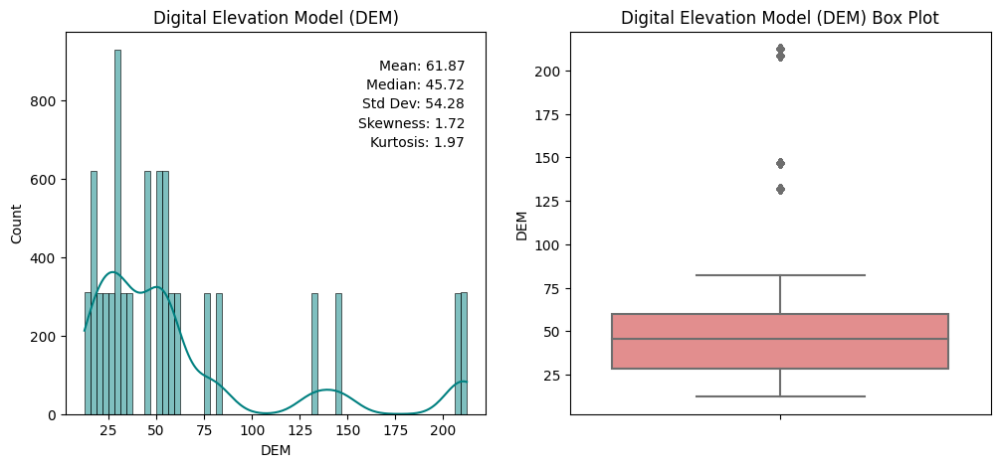

In [83]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'DEM'
sns.histplot(df['DEM'], kde=True, color='teal', ax=axes[0])
axes[0].set_title('Digital Elevation Model (DEM)')
axes[0].grid(False)

mean_dem = df['DEM'].mean()
median_dem = df['DEM'].median()
std_dev_dem = df['DEM'].std()
skewness_dem = df['DEM'].skew()
kurtosis_dem = df['DEM'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_dem), ("Median", median_dem), ("Std Dev", std_dev_dem), ("Skewness", skewness_dem), ("Kurtosis", kurtosis_dem)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'DEM' on the second subplot
sns.boxplot(data=df, y='DEM', color='lightcoral', ax=axes[1])
axes[1].set_title('Digital Elevation Model (DEM) Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_dem), ("Median", median_dem), ("Std Dev", std_dev_dem), ("Skewness", skewness_dem), ("Kurtosis", kurtosis_dem)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * The mean (average) DEM value of 61.87 suggests the typical elevation (measure of how high or low a specific point is with respect to sea level) in the dataset.

> * The median DEM value of 45.72 is considerably lower than the mean, indicating that there might be some extremely high elevation values pulling the mean higher.

> * The high standard deviation of 54.28 indicates a significant variation in elevation, with values widely dispersed around the mean.

> * The positive skewness of 1.72 suggests a right-skewed distribution of elevation, indicating a higher concentration of lower elevation points and a longer tail on the higher elevation side.

> * The positive kurtosis of 1.97 implies a distribution that is more peaked and has fatter tails compared to a normal distribution, increasing the likelihood of extreme elevation values.

> **In summary, the DEM data appears to be right-skewed, with a wide variation in elevation values. The positive skewness and kurtosis indicate that the distribution is right-skewed and more peaked than a normal distribution, suggesting the presence of extreme elevation values or outliers, possibly in higher elevation areas.**






### Slope

Mean: 1.26
Median: 0.62
Std Dev: 1.37
Skewness: 1.56
Kurtosis: 1.62


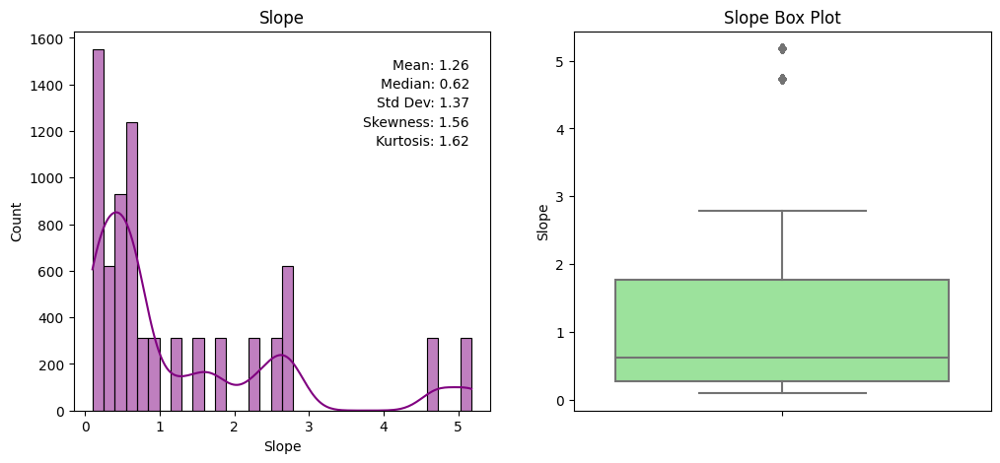

In [84]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Slope'
sns.histplot(df['Slope'], kde=True, color='purple', ax=axes[0])
axes[0].set_title('Slope')
axes[0].grid(False)

mean_slope = df['Slope'].mean()
median_slope = df['Slope'].median()
std_dev_slope = df['Slope'].std()
skewness_slope = df['Slope'].skew()
kurtosis_slope = df['Slope'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_slope), ("Median", median_slope), ("Std Dev", std_dev_slope), ("Skewness", skewness_slope), ("Kurtosis", kurtosis_slope)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Slope' on the second subplot
sns.boxplot(data=df, y='Slope', color='lightgreen', ax=axes[1])
axes[1].set_title('Slope Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_slope), ("Median", median_slope), ("Std Dev", std_dev_slope), ("Skewness", skewness_slope), ("Kurtosis", kurtosis_slope)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean (Average): The mean value of 1.26 suggests the central tendency of the data, indicating that, on average, the values are relatively higher.

> * Median (Middle Value): The median value of 0.62 indicates that the middle value in the dataset is significantly lower than the mean. This suggests the presence of outliers or extreme values on the higher side.

> * Standard Deviation: The standard deviation of 1.37 is relatively high, signifying a notable degree of variability in the data. The values are dispersed around the mean, indicating a wide range of data points.

> * Skewness: The positive skewness value of 1.56 indicates a right-skewed distribution. This means that there is a longer tail on the right side of the distribution, and the majority of data points are concentrated on the left side.

> * Kurtosis: The kurtosis value of 1.62 suggests a distribution that is more peaked and has fatter tails compared to a normal distribution. This implies a higher likelihood of extreme values or outliers in the dataset.

> **In summary, this variable exhibits a right-skewed distribution with a relatively high standard deviation, indicating a wide range of values. The presence of outliers on the higher side contributes to the positive skewness and higher kurtosis, making the distribution more peaked and increasing the likelihood of extreme values.**

### Solar radiation



Mean: 5341.50
Median: 5436.35
Std Dev: 429.16
Skewness: -0.51
Kurtosis: -0.97


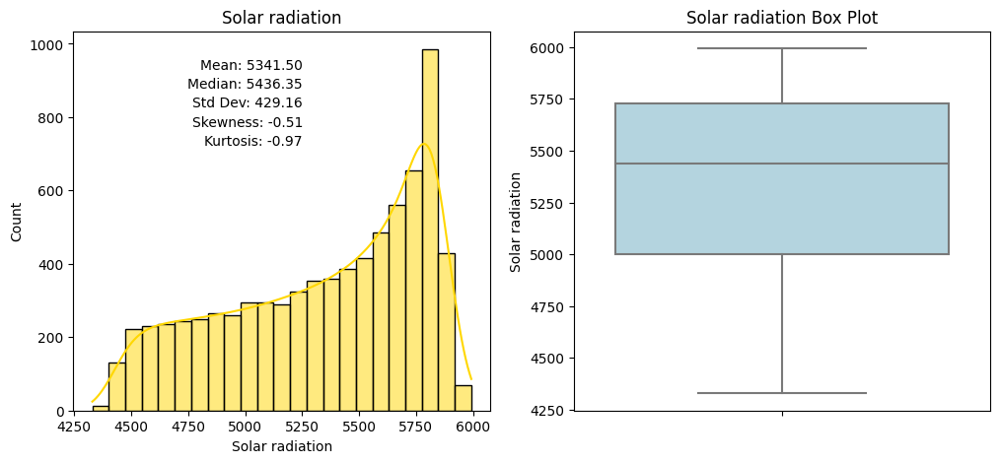

In [85]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Solar radiation'
sns.histplot(df['Solar radiation'], kde=True, color='gold', ax=axes[0])
axes[0].set_title('Solar radiation')
axes[0].grid(False)

mean_solar_radiation = df['Solar radiation'].mean()
median_solar_radiation = df['Solar radiation'].median()
std_dev_solar_radiation = df['Solar radiation'].std()
skewness_solar_radiation = df['Solar radiation'].skew()
kurtosis_solar_radiation = df['Solar radiation'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_solar_radiation), ("Median", median_solar_radiation), ("Std Dev", std_dev_solar_radiation), ("Skewness", skewness_solar_radiation), ("Kurtosis", kurtosis_solar_radiation)]):
    axes[0].text(0.55, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Solar radiation' on the second subplot
sns.boxplot(data=df, y='Solar radiation', color='lightblue', ax=axes[1])
axes[1].set_title('Solar radiation Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_solar_radiation), ("Median", median_solar_radiation), ("Std Dev", std_dev_solar_radiation), ("Skewness", skewness_solar_radiation), ("Kurtosis", kurtosis_solar_radiation)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 5341.50: The mean value of 5341.50 represents the average solar radiation in the dataset.

> * Median: 5436.35: The median value of 5436.35 indicates that the middle solar radiation value in the dataset is slightly higher than the mean.

> * Std Dev: 429.16: The standard deviation of 429.16 suggests a moderate level of variability in the solar radiation data. This means that the solar radiation values are somewhat dispersed around the mean.

> * Skewness: -0.51: The negative skewness of -0.51 suggests that the solar radiation data is left-skewed, with a longer tail on the lower radiation side. This implies that there is a higher concentration of lower radiation values in the dataset.

> * The skewness and kurtosis values may suggest a deviation from a perfectly normal distribution, the absence of outliers in the box plot suggests that the deviations are not extreme enough to be considered outliers.
Kurtosis: -0.97: The negative kurtosis of -0.97 characterizes a flatter distribution with thinner tails compared to a normal distribution. This reduces the likelihood of extreme solar radiation values or outliers in the data.

> **In summary, the solar radiation data exhibits a left-skewed distribution with a moderate level of variability and a concentration of lower radiation values. The negative kurtosis further suggests that extreme solar radiation values or outliers are less likely in this dataset.**






### Next Maximum Temperature : Next_Tmax

Mean: 30.27
Median: 30.50
Std Dev: 3.12
Skewness: -0.34
Kurtosis: -0.24


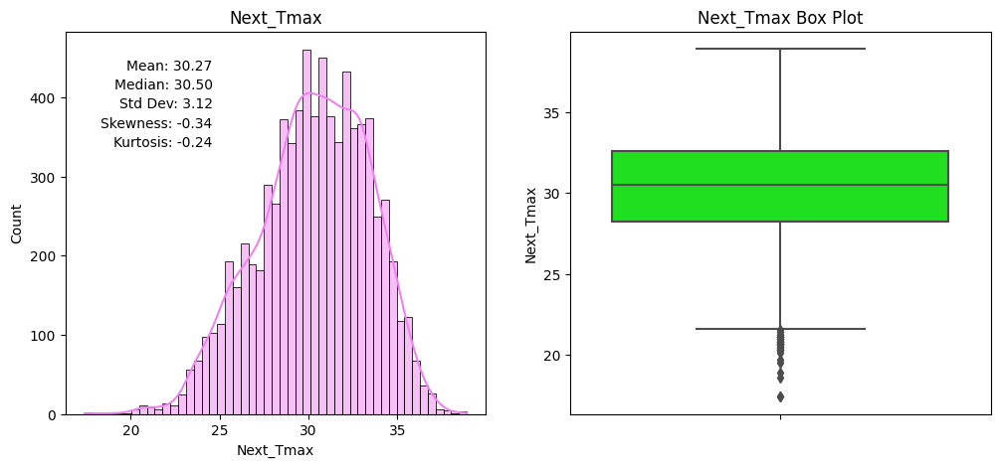

In [86]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Next_Tmax'
sns.histplot(df['Next_Tmax'], kde=True, color='violet', ax=axes[0])
axes[0].set_title('Next_Tmax')
axes[0].grid(False)

mean_next_tmax = df['Next_Tmax'].mean()
median_next_tmax = df['Next_Tmax'].median()
std_dev_next_tmax = df['Next_Tmax'].std()
skewness_next_tmax = df['Next_Tmax'].skew()
kurtosis_next_tmax = df['Next_Tmax'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_next_tmax), ("Median", median_next_tmax), ("Std Dev", std_dev_next_tmax), ("Skewness", skewness_next_tmax), ("Kurtosis", kurtosis_next_tmax)]):
    axes[0].text(0.35, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Next_Tmax' on the second subplot
sns.boxplot(data=df, y='Next_Tmax', color='lime', ax=axes[1])
axes[1].set_title('Next_Tmax Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_next_tmax), ("Median", median_next_tmax), ("Std Dev", std_dev_next_tmax), ("Skewness", skewness_next_tmax), ("Kurtosis", kurtosis_next_tmax)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 30.27: The mean value of 30.27 represents the average temperature in the dataset.

> * Median: 30.50: The median value of 30.50 indicates that the middle temperature value in the dataset is slightly higher than the mean.

> * Std Dev: 3.12: The standard deviation of 3.12 suggests a moderate level of temperature variability, meaning that the temperature values are somewhat dispersed around the mean.

> * Skewness: -0.34: The negative skewness of -0.34 suggests that the temperature data is left-skewed, with a longer tail on the lower temperature side. This implies that there is a higher concentration of higher temperature values in the dataset.

> * Kurtosis: -0.24: The negative kurtosis of -0.24 characterizes a flatter distribution with thinner tails compared to a normal distribution. This reduces the likelihood of extreme temperature values or outliers in the data.

> **In summary, the temperature data exhibits a left-skewed distribution with a moderate level of variability and a concentration of higher temperature values. The negative kurtosis further suggests that extreme temperature values or outliers are less likely in this dataset.**

### Next Minimum Temperature : Next_Tmin

Mean: 22.93
Median: 23.10
Std Dev: 2.48
Skewness: -0.40
Kurtosis: 0.26


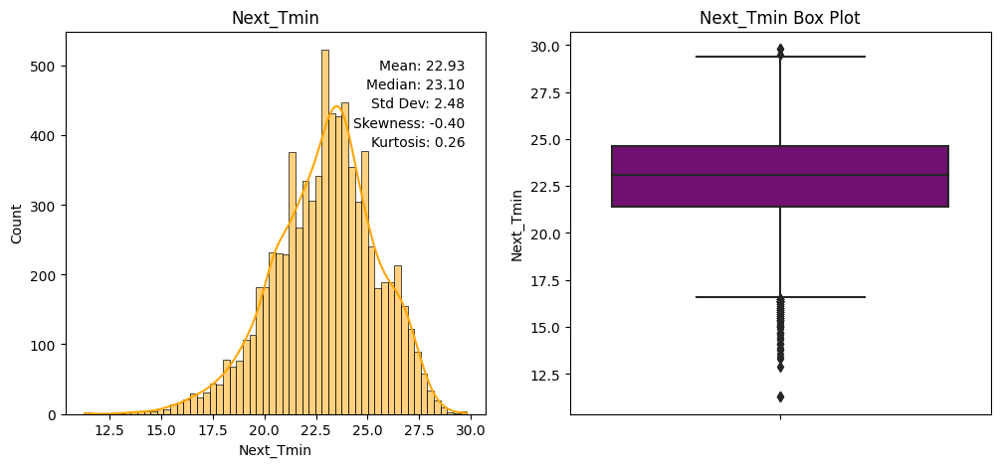

In [87]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Next_Tmin'
sns.histplot(df['Next_Tmin'], kde=True, color='orange', ax=axes[0])
axes[0].set_title('Next_Tmin')
axes[0].grid(False)

mean_next_tmin = df['Next_Tmin'].mean()
median_next_tmin = df['Next_Tmin'].median()
std_dev_next_tmin = df['Next_Tmin'].std()
skewness_next_tmin = df['Next_Tmin'].skew()
kurtosis_next_tmin = df['Next_Tmin'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_next_tmin), ("Median", median_next_tmin), ("Std Dev", std_dev_next_tmin), ("Skewness", skewness_next_tmin), ("Kurtosis", kurtosis_next_tmin)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Next_Tmin' on the second subplot
sns.boxplot(data=df, y='Next_Tmin', color='purple', ax=axes[1])
axes[1].set_title('Next_Tmin Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_next_tmin), ("Median", median_next_tmin), ("Std Dev", std_dev_next_tmin), ("Skewness", skewness_next_tmin), ("Kurtosis", kurtosis_next_tmin)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 22.93: The mean value of 22.93 represents the average temperature in the dataset.

> * Median: 23.10: The median value of 23.10 indicates that the middle temperature value in the dataset is slightly higher than the mean.

> * Std Dev: 2.48: The standard deviation of 2.48 suggests a moderate level of temperature variability, meaning that the temperature values are somewhat dispersed around the mean.

> * Skewness: -0.40: The negative skewness of -0.40 suggests that the temperature data is slightly left-skewed, with a longer tail on the lower temperature side. This implies that there is a higher concentration of higher temperature values in the dataset.

> * Kurtosis: 0.26: The positive kurtosis of 0.26 indicates that the temperature distribution is slightly more peaked and has fatter tails compared to a normal distribution. This suggests a somewhat higher likelihood of extreme temperature values or outliers in the data.

> **In summary, the temperature data exhibits a slightly left-skewed distribution with a moderate level of variability and a concentration of higher temperature values. The positive kurtosis suggests a slightly more peaked distribution with a somewhat higher likelihood of extreme temperature values or outliers.**

### Month

Mean: 7.08
Median: 7.00
Std Dev: 2.24
Skewness: -0.71
Kurtosis: 1.29


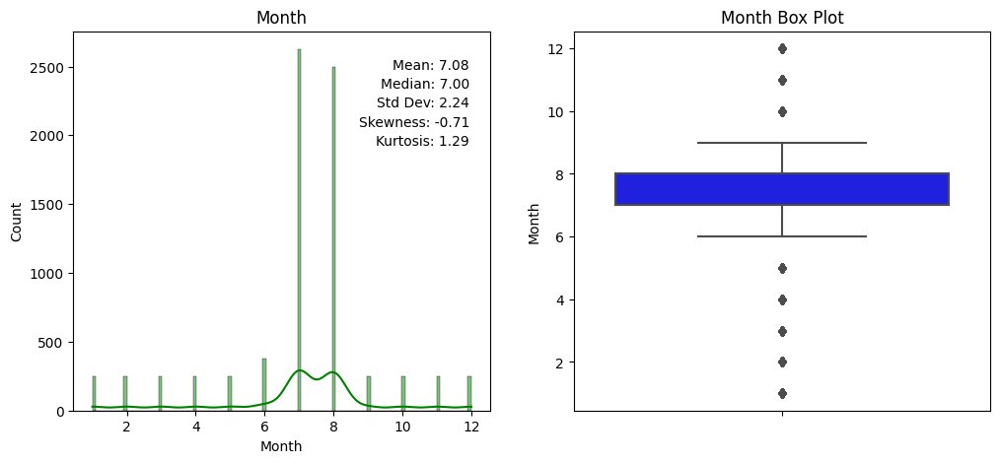

In [88]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Month'
sns.histplot(df['Month'], kde=True, color='green', ax=axes[0])
axes[0].set_title('Month')
axes[0].grid(False)

mean_month = df['Month'].mean()
median_month = df['Month'].median()
std_dev_month = df['Month'].std()
skewness_month = df['Month'].skew()
kurtosis_month = df['Month'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_month), ("Median", median_month), ("Std Dev", std_dev_month), ("Skewness", skewness_month), ("Kurtosis", kurtosis_month)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Month' on the second subplot
sns.boxplot(data=df, y='Month', color='blue', ax=axes[1])
axes[1].set_title('Month Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_month), ("Median", median_month), ("Std Dev", std_dev_month), ("Skewness", skewness_month), ("Kurtosis", kurtosis_month)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 7.08: The mean value of 7.08 represents the average of the dataset.

> * Median: 7.00: The median value of 7.00 indicates that the middle value in the dataset is very close to the mean, suggesting a relatively balanced distribution.

> * Std Dev: 2.24: The standard deviation of 2.24 implies a moderate level of data variability, indicating that the values are moderately dispersed around the mean.

> * Skewness: -0.71: The negative skewness of -0.71 suggests that the data is left-skewed, with a longer tail on the lower side of the distribution. This indicates that there is a higher concentration of data points on the higher side.

> * Kurtosis: 1.29: The positive kurtosis of 1.29 indicates a distribution that is more peaked and has fatter tails compared to a normal distribution. This implies a higher likelihood of extreme values or outliers in the data.

> **In summary, the data shows a left-skewed distribution with a moderate level of variability, a concentration of data points on the higher side, and a higher likelihood of extreme values or outliers.**

### Day

Mean: 16.37
Median: 16.00
Std Dev: 8.24
Skewness: 0.25
Kurtosis: -1.40


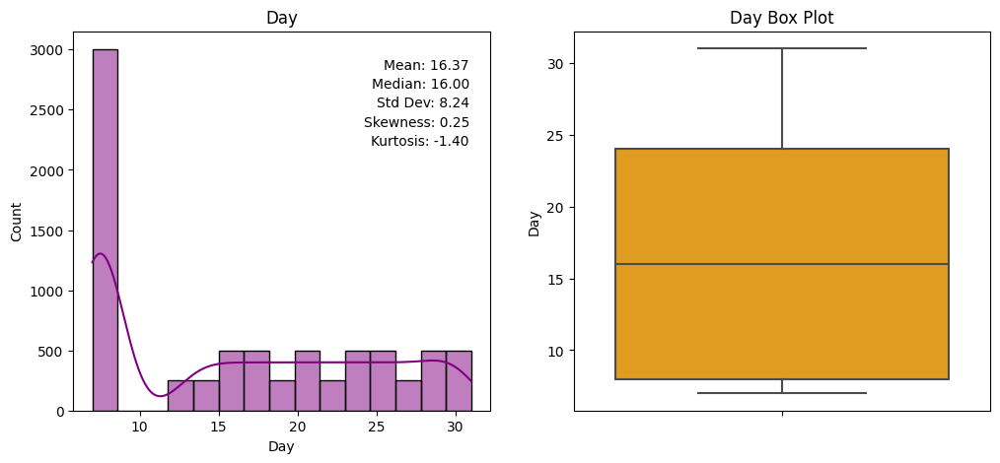

In [89]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram and add statistical summaries for 'Day'
sns.histplot(df['Day'], kde=True, color='purple', ax=axes[0])
axes[0].set_title('Day')
axes[0].grid(False)

mean_day = df['Day'].mean()
median_day = df['Day'].median()
std_dev_day = df['Day'].std()
skewness_day = df['Day'].skew()
kurtosis_day = df['Day'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_day), ("Median", median_day), ("Std Dev", std_dev_day), ("Skewness", skewness_day), ("Kurtosis", kurtosis_day)]):
    axes[0].text(0.95, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Day' on the second subplot
sns.boxplot(data=df, y='Day', color='orange', ax=axes[1])
axes[1].set_title('Day Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_day), ("Median", median_day), ("Std Dev", std_dev_day), ("Skewness", skewness_day), ("Kurtosis", kurtosis_day)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 16.37: The mean value of 16.37 represents the average of the dataset.

> * Median: 16.00: The median value of 16.00 indicates that the middle value in the dataset is close to the mean, suggesting a relatively balanced distribution.

> * Std Dev: 8.24: The standard deviation of 8.24 implies a moderate level of data variability, indicating that the values are moderately dispersed around the mean.

> * Skewness: 0.25: The positive skewness of 0.25 suggests that the data is slightly right-skewed, with a longer tail on the right side of the distribution. This indicates a somewhat higher concentration of data points on the left side.

> * Kurtosis: -1.40: The negative kurtosis of -1.40 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.

> **In summary, the data shows a relatively balanced distribution with moderate variability. It is slightly right-skewed, with a somewhat higher concentration of data points on the left side, and a lower likelihood of extreme values or outliers.**

Mean: 2015.00
Median: 2015.00
Std Dev: 1.41
Skewness: 0.00
Kurtosis: -1.30


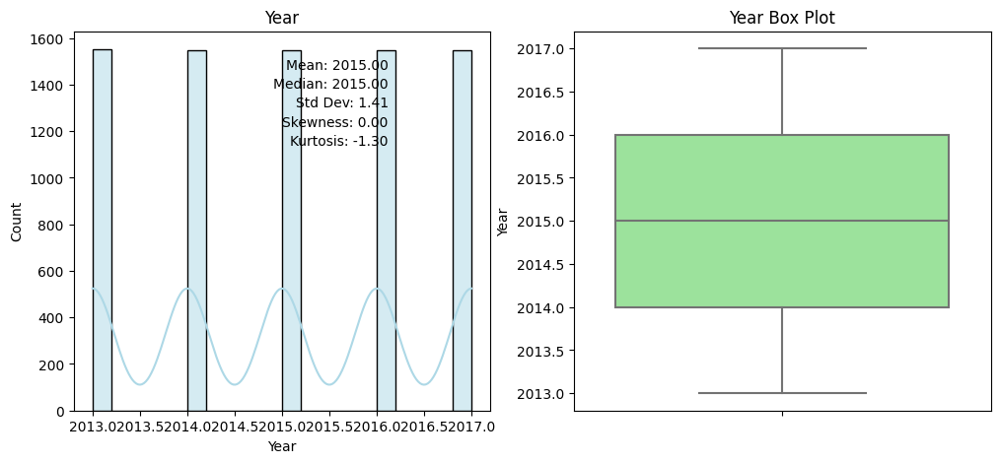

In [90]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(df['Year'], kde=True, color='lightblue', ax=axes[0])
axes[0].set_title('Year')
axes[0].grid(False)

mean_year = df['Year'].mean()
median_year = df['Year'].median()
std_dev_year = df['Year'].std()
skewness_year = df['Year'].skew()
kurtosis_year = df['Year'].kurtosis()

# Display statistical values on the graph
for i, (stat, value) in enumerate([("Mean", mean_year), ("Median", median_year), ("Std Dev", std_dev_year), ("Skewness", skewness_year), ("Kurtosis", kurtosis_year)]):
    axes[0].text(0.755, 0.9 - i * 0.05, f'{stat}: {value:.2f}', transform=axes[0].transAxes, horizontalalignment='right')

# Create a box plot for 'Year' on the second subplot
sns.boxplot(data=df, y='Year', color='lightgreen', ax=axes[1])
axes[1].set_title('Year Box Plot')
axes[1].grid(False)

# Print the statistical values
for stat, value in [("Mean", mean_year), ("Median", median_year), ("Std Dev", std_dev_year), ("Skewness", skewness_year), ("Kurtosis", kurtosis_year)]:
    print(f'{stat}: {value:.2f}')

plt.show()

> * Mean: 2015.00: The mean value of 2015.00 represents the central tendency of the dataset. In this case, the mean and median are both equal to 2015.00, indicating that the data is symmetrically distributed around this central value.

> * Median: 2015.00: The median value of 2015.00 confirms that the middle value in the dataset aligns with the mean. This further supports the notion of a symmetric distribution.

> * Std Dev: 1.41: The standard deviation of 1.41 suggests a relatively low level of data variability. The values are relatively close to the mean, indicating a more concentrated dataset.

> * Skewness: 0.00: The skewness of 0.00 suggests that the data is symmetric and lacks a skew in either direction, meaning that the data is evenly distributed.

> * Kurtosis: -1.30: The negative kurtosis of -1.30 indicates a distribution that is flatter and has thinner tails compared to a normal distribution. This implies a lower likelihood of extreme values or outliers in the data.

> **In summary, the data is symmetrically distributed around the mean with low variability, and it is not skewed in any direction. The negative kurtosis suggests that the dataset is less likely to have extreme values or outliers.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Bivariant Analysis</b>
 </div>

**Let's examine the relationship between the target variables with other columns**

In [91]:
# Checking the correlation with Next_Tmax
df.corr()['Next_Tmax']

station             0.107983
Present_Tmax        0.610348
Present_Tmin        0.471806
LDAPS_RHmin        -0.437898
LDAPS_RHmax        -0.281341
LDAPS_Tmax_lapse    0.827548
LDAPS_Tmin_lapse    0.586983
LDAPS_WS           -0.345619
LDAPS_LH            0.155608
LDAPS_CC1          -0.454855
LDAPS_CC2          -0.492699
LDAPS_CC3          -0.517207
LDAPS_CC4          -0.449490
LDAPS_PPT1         -0.122379
LDAPS_PPT2         -0.181587
LDAPS_PPT3         -0.196935
LDAPS_PPT4         -0.181329
lat                -0.053510
lon                 0.003052
DEM                -0.172538
Slope              -0.102725
Solar radiation     0.008795
Next_Tmax           1.000000
Next_Tmin           0.621427
Month              -0.026320
Day                -0.116497
Year                0.060228
Name: Next_Tmax, dtype: float64

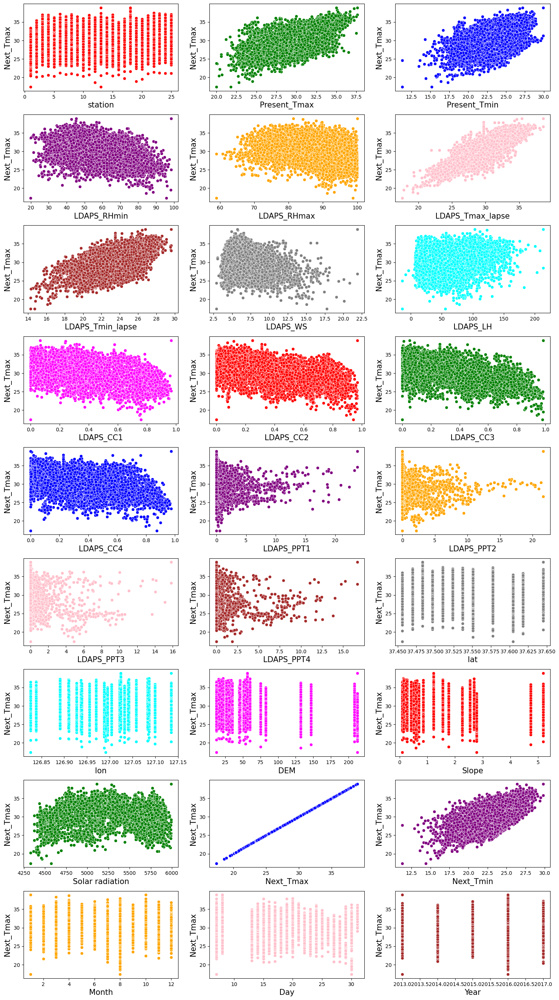

In [92]:
num_cols = len(df.columns)
num_rows = (num_cols // 3) + (num_cols % 3 > 0)

fig, ax = plt.subplots(ncols=3, nrows=num_rows, figsize=(15, 3 * num_rows))
ax = ax.flatten()

# Define a list of colors for the scatter plots
colors = ['red', 'green', 'blue', 'purple', 'orange', 'pink', 'brown', 'gray', 'cyan', 'magenta']

for i, col in enumerate(df.columns):
    # To handle the case with fewer than 3 numerical columns
    if i >= num_cols:
        break
    sns.scatterplot(x=col, y='Next_Tmax', data=df, ax=ax[i], color=colors[i % len(colors)])  # Assign a color from the list
    ax[i].set_xlabel(col, fontsize=15)
    ax[i].set_ylabel('Next_Tmax', fontsize=15)

# If there are remaining subplots, remove them
for j in range(num_cols, 3 * num_rows):
    fig.delaxes(ax[j])

plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

> * 'Present_Tmax' and 'LDAPS_Tmax_lapse' have a strong positive correlation with 'Next_Tmax' (0.610 and 0.828, respectively), indicating that higher maximum temperatures are associated with higher 'Next_Tmax' values.

> * 'Present_Tmin' and 'LDAPS_Tmin_lapse' also have positive correlations with 'Next_Tmax' (0.472 and 0.587, respectively), suggesting that higher minimum temperatures are associated with higher 'Next_Tmax' values.

> * 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', and 'LDAPS_CC4' have negative correlations with 'Next_Tmax', which means that higher cloud cover is associated with lower 'Next_Tmax' values.

> * 'LDAPS_RHmin', 'LDAPS_WS', and 'LDAPS_PPT1' also have negative correlations with 'Next_Tmax', suggesting that lower relative humidity, wind speed, and precipitation are associated with higher 'Next_Tmax' values.

> * 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', and 'Solar radiation' have relatively weak correlations with 'Next_Tmax'.

> * 'Station', 'lat', 'lon', 'Slope', 'Month', 'Day', and 'Year' have correlations with 'Next_Tmax' that are not very strong (either positive or negative), indicating that these features may have a weaker influence on 'Next_Tmax'.

> **In summary, the correlations provide insights into the relationships between different weather and geographical features and 'Next_Tmax'. Features such as maximum and minimum temperatures, cloud cover, relative humidity, wind speed, and precipitation appear to have a notable influence on 'Next_Tmax'. However, the influence of certain features, such as 'Station', 'lat', 'lon', 'Slope', 'Month', 'Day', and 'Year', seems to be relatively weaker.**






In [93]:
# Checking the correlation with Next_Tmax
df.corr()['Next_Tmin']

station             0.128293
Present_Tmax        0.622741
Present_Tmin        0.796670
LDAPS_RHmin         0.095019
LDAPS_RHmax        -0.070246
LDAPS_Tmax_lapse    0.587135
LDAPS_Tmin_lapse    0.880176
LDAPS_WS           -0.098767
LDAPS_LH           -0.056906
LDAPS_CC1          -0.012807
LDAPS_CC2           0.029756
LDAPS_CC3          -0.056678
LDAPS_CC4          -0.087537
LDAPS_PPT1          0.018633
LDAPS_PPT2         -0.010478
LDAPS_PPT3         -0.064714
LDAPS_PPT4         -0.105624
lat                -0.083533
lon                -0.046603
DEM                -0.246906
Slope              -0.146882
Solar radiation     0.120212
Next_Tmax           0.621427
Next_Tmin           1.000000
Month              -0.023728
Day                -0.129036
Year                0.023480
Name: Next_Tmin, dtype: float64

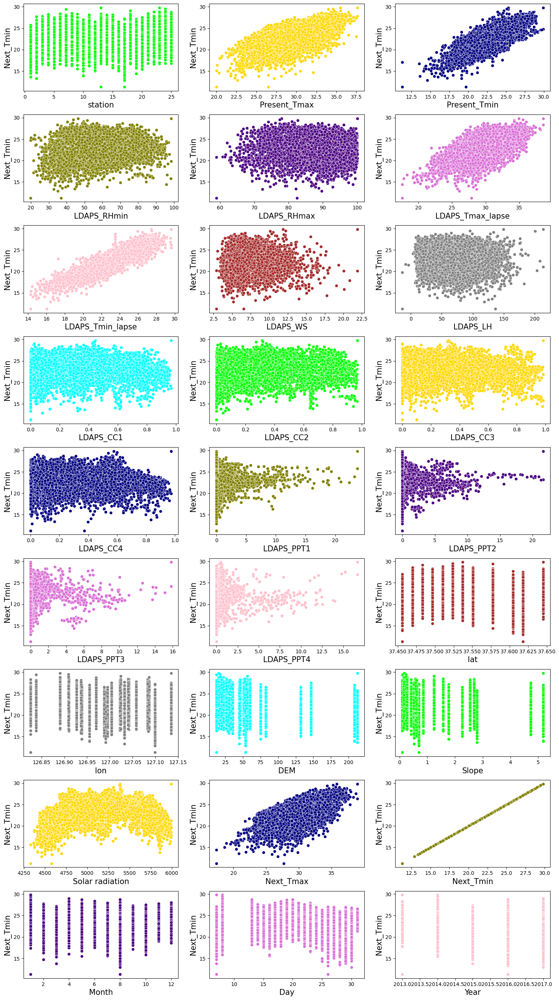

In [94]:
num_cols = len(df.columns)
num_rows = (num_cols // 3) + (num_cols % 3 > 0)

fig, ax = plt.subplots(ncols=3, nrows=num_rows, figsize=(15, 3 * num_rows))
ax = ax.flatten()

# Define a list of colors for the scatter plots
colors = ['lime', 'gold','navy', 'olive', 'indigo', 'orchid', 'pink', 'brown', 'gray', 'cyan']
for i, col in enumerate(df.columns):
    # To handle the case with fewer than 3 numerical columns
    if i >= num_cols:
        break
    sns.scatterplot(x=col, y='Next_Tmin', data=df, ax=ax[i], color=colors[i % len(colors)])  # Assign a color from the list
    ax[i].set_xlabel(col, fontsize=15)
    ax[i].set_ylabel('Next_Tmin', fontsize=15)

# If there are remaining subplots, remove them
for j in range(num_cols, 3 * num_rows):
    fig.delaxes(ax[j])

plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

> * 'Present_Tmax' and 'LDAPS_Tmin_lapse' have strong positive correlations with 'Next_Tmin' (0.797 and 0.880, respectively), indicating that higher maximum temperatures and minimum temperatures are associated with higher 'Next_Tmin' values.

> * 'Present_Tmin' also has a strong positive correlation with 'Next_Tmin' (0.797), suggesting that higher minimum temperatures lead to higher 'Next_Tmin' values.

> * 'LDAPS_Tmax_lapse' and 'LDAPS_PPT1' have relatively moderate positive correlations with 'Next_Tmin' (0.587 and 0.019, respectively).

> * 'Solar radiation' has a moderate positive correlation with 'Next_Tmin' (0.120), suggesting that higher solar radiation levels are associated with higher 'Next_Tmin' values.

> * 'Station', 'lat', and 'Year' have relatively weak correlations with 'Next_Tmin', which means they have less influence on 'Next_Tmin'.

> * Features like 'LDAPS_RHmin', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lon', 'DEM', 'Slope', 'Month', and 'Day' have correlations with 'Next_Tmin' that are not very strong, suggesting that their influence on 'Next_Tmin' is relatively weaker.

> **In summary, the correlations provide insights into the relationships between different weather and geographical features and 'Next_Tmin'. Features such as maximum and minimum temperatures, as well as solar radiation, appear to have a notable influence on 'Next_Tmin', whereas other features have weaker or mixed correlations.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Outlier Detection and Treatment</b>
 </div>

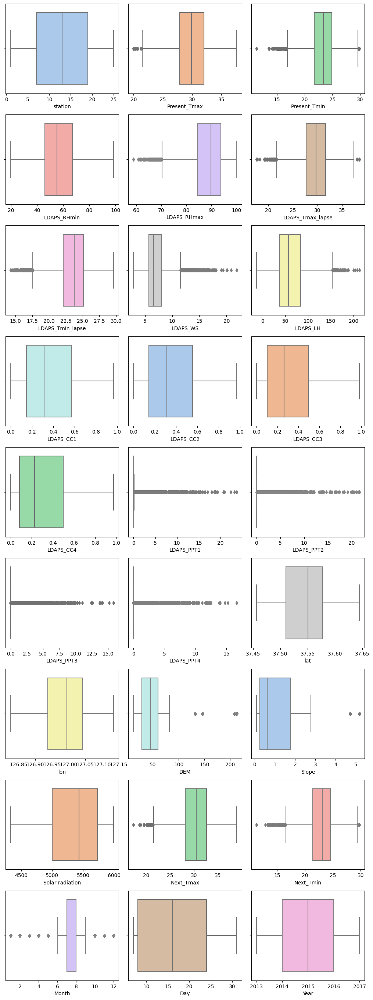

In [95]:
num_cols = len(df.columns)
num_rows = (num_cols // 3) + (num_cols % 3 > 0)

fig, ax = plt.subplots(ncols=3, nrows=num_rows, figsize=(10, 3 * num_rows))
ax = ax.flatten()

pastel_palette = sns.color_palette('pastel')

for i, col in enumerate(df.columns):
    # To handle the case with fewer than 3 numerical columns
    if i >= num_cols:
        break
        # Ensure we don't go out of bounds
    color_idx = i % len(pastel_palette)
    sns.boxplot(x=df[col], ax=ax[i], palette=[pastel_palette[color_idx]])

# If there are remaining subplots, remove them
for j in range(num_cols, 3 * num_rows):
    fig.delaxes(ax[j])

plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

Outlier Treatment:-

In [96]:
# Removing outlier using Zscore
z = np.abs(zscore(df))
threshold = 3
np.where(z>3)
df_new = df[(z<3).all(axis = 1)]

print ("Shape of the dataframe before removing outliers: ", df.shape)
print ("Shape of the dataframe after removing outliers: ", df_new.shape)
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df_new.shape[0])/df.shape[0]*100)

Shape of the dataframe before removing outliers:  (7752, 27)
Shape of the dataframe after removing outliers:  (6894, 27)
Percentage of data loss post outlier removal:  11.06811145510836


In [97]:
#1st quantile
Q1=df.quantile(0.25)

# 3rd quantile
Q3=df.quantile(0.75)

#IQR
IQR=Q3 - Q1
df1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",df1.shape)
print("\nTotal Dropped rows:",df.shape[0]-df1.shape[0])
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df1.shape[0])/df.shape[0]*100)

Old DataFrame data in Rows and Column: (7752, 27)

New DataFrame data in Rows and Column: (2409, 27)

Total Dropped rows: 5343
Percentage of data loss post outlier removal:  68.92414860681114


**A total of 68.924% of the data was eliminated when using the IQR method to remove outliers. Therefore, the IQR method may not be the suitable choice for outlier removal, and we will opt for the Z-score method instead as data loss is only 11.068%.**


**NOTE:-** I applied the Z-score method for outlier removal, resulting in a data loss of approximately 11.068%. This loss slightly exceeds the 10% threshold that we would have preferred to maintain. However, it's still within an acceptable range, so we will proceed with the remaining dataset.

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Checking the skewness</b>
 </div>

In [98]:
df_new.skew()

station             0.002792
Present_Tmax       -0.272653
Present_Tmin       -0.225479
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.694148
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.382667
LDAPS_WS            1.097251
LDAPS_LH            0.574066
LDAPS_CC1           0.600830
LDAPS_CC2           0.506876
LDAPS_CC3           0.708018
LDAPS_CC4           0.720393
LDAPS_PPT1          3.749975
LDAPS_PPT2          4.869067
LDAPS_PPT3          5.515722
LDAPS_PPT4          5.969876
lat                 0.108251
lon                -0.275508
DEM                 1.764031
Slope               1.593600
Solar radiation    -0.505353
Next_Tmax          -0.270084
Next_Tmin          -0.237767
Month              -0.683578
Day                 0.255263
Year                0.010998
dtype: float64

In [99]:
skewness = df_new.skew()
skewed_columns = skewness[abs(skewness) > 0.5]
skewed_columns

LDAPS_RHmax       -0.694148
LDAPS_WS           1.097251
LDAPS_LH           0.574066
LDAPS_CC1          0.600830
LDAPS_CC2          0.506876
LDAPS_CC3          0.708018
LDAPS_CC4          0.720393
LDAPS_PPT1         3.749975
LDAPS_PPT2         4.869067
LDAPS_PPT3         5.515722
LDAPS_PPT4         5.969876
DEM                1.764031
Slope              1.593600
Solar radiation   -0.505353
Month             -0.683578
dtype: float64

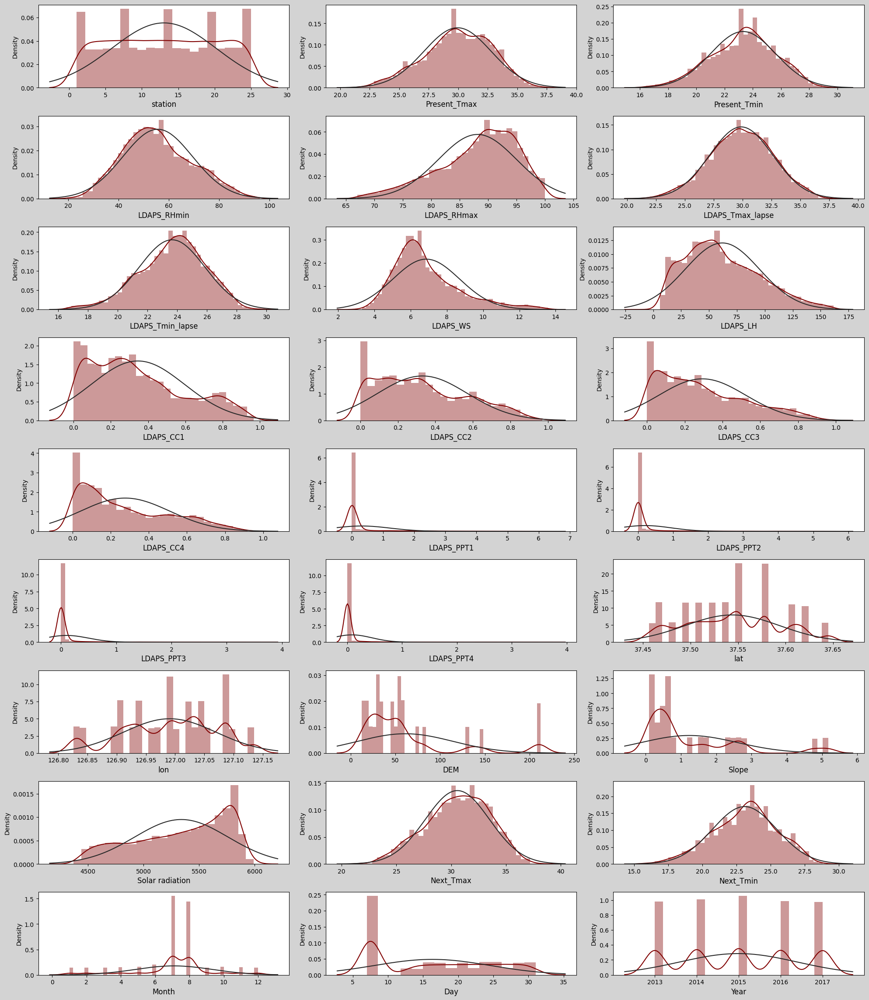

In [100]:
# Set the figure size and background color
plt.figure(figsize=(20, 25), facecolor='lightgray')
plt.grid(False)
plotnumber = 1
for column in df_new:
    if plotnumber <= 28:
        ax = plt.subplot(10, 3, plotnumber)
        sns.distplot(df_new[column], color='maroon', fit=stats.norm,)
        plt.xlabel(column, fontsize=12)
    plotnumber += 1

plt.tight_layout()
plt.show()

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Correcting skewness through Power Tranform </b>
 </div>

In [101]:
PT = PowerTransformer(method='yeo-johnson')

df_new[['LDAPS_RHmax','LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope', 'Solar radiation', 'Month']] = PT.fit_transform(df_new[['LDAPS_RHmax','LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope', 'Solar radiation', 'Month']].values)

df_new.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
0,1.0,28.7,21.4,58.255688,0.344145,28.074101,23.006936,0.175819,0.350681,-0.311836,...,37.6046,126.991,1.854276,1.329510,1.889266,29.1,21.2,-0.583652,30,2013
1,2.0,31.9,21.6,52.263397,0.256207,29.850689,24.035009,-0.579955,-0.169442,-0.353269,...,37.6046,127.032,0.069427,-0.374447,1.434120,30.5,22.5,-0.583652,30,2013
2,3.0,31.6,23.3,48.690479,-0.729987,30.091292,24.565633,-0.255493,-1.387785,-0.434257,...,37.5776,127.058,-0.353718,-0.943391,1.413770,31.1,23.9,-0.583652,30,2013
3,4.0,32.0,23.4,58.239788,1.382311,29.704629,23.326177,-0.612334,0.245930,-0.398777,...,37.6450,127.022,0.098490,1.250934,1.390562,31.7,24.3,-0.583652,30,2013
4,5.0,31.4,21.9,56.174095,0.180422,29.113934,23.486480,-0.546962,1.305383,-0.743338,...,37.5507,127.135,-0.279099,-0.390970,1.399661,31.2,22.5,-0.583652,30,2013


In [102]:
df_new.skew()

station             0.002792
Present_Tmax       -0.272653
Present_Tmin       -0.225479
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.100101
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.382667
LDAPS_WS            0.005909
LDAPS_LH           -0.028195
LDAPS_CC1           0.063957
LDAPS_CC2           0.048225
LDAPS_CC3           0.092056
LDAPS_CC4           0.140749
LDAPS_PPT1          1.624705
LDAPS_PPT2          1.826222
LDAPS_PPT3          2.004598
LDAPS_PPT4          2.284110
lat                 0.108251
lon                -0.275508
DEM                 0.038729
Slope               0.233805
Solar radiation    -0.166145
Next_Tmax          -0.270084
Next_Tmin          -0.237767
Month               0.040257
Day                 0.255263
Year                0.010998
dtype: float64

**Now, concerning the columns 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', and 'LDAPS_PPT4', these are likely related to precipitation. Precipitation data often exhibit high positive skewness because there are many days with little to no precipitation, and relatively few days with heavy rainfall. This distribution pattern is common in meteorological data, especially when it comes to precipitation variables. Hence, Reducing skewness to near 0.5 for such variables might not be a good idea in the context of meteorological data because you could be altering the natural distribution of the data.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Checking the correlation</b>
 </div>

In [103]:
df_new.corr()


,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
station,1.000000,0.109476,0.132092,-0.067901,-0.179027,0.065989,0.103741,0.028885,-0.135985,0.012597,...,-0.240428,-0.122474,-0.324770,-0.144452,-0.031514,0.106116,0.129180,0.001826,0.006243,0.005841
Present_Tmax,0.109476,1.000000,0.612869,-0.151799,-0.316568,0.534963,0.609642,-0.071853,0.117800,-0.283810,...,-0.050398,0.011214,-0.130940,-0.092664,-0.103106,0.586403,0.616843,0.040312,-0.126611,0.103304
Present_Tmin,0.132092,0.612869,1.000000,0.150633,-0.051020,0.434607,0.752887,0.033707,-0.008643,0.103668,...,-0.071014,-0.043494,-0.237731,-0.157512,-0.053333,0.446660,0.785261,-0.011823,-0.070130,0.097860
LDAPS_RHmin,-0.067901,-0.151799,0.150633,1.000000,0.565971,-0.555271,0.131633,0.176052,-0.005211,0.582151,...,0.088642,-0.094266,0.057383,0.084822,0.229509,-0.428028,0.133571,-0.069300,-0.071543,0.000863
LDAPS_RHmax,-0.179027,-0.316568,-0.051020,0.565971,1.000000,-0.404546,-0.161330,0.064510,0.282128,0.417730,...,0.231029,0.011473,0.173745,0.209844,0.154823,-0.320830,-0.108837,-0.048618,-0.008445,-0.145661
LDAPS_Tmax_lapse,0.065989,0.534963,0.434607,-0.555271,-0.404546,1.000000,0.620258,-0.156914,0.007230,-0.404984,...,-0.036540,0.103320,-0.111668,-0.107118,-0.033609,0.806130,0.547336,-0.014268,-0.140994,0.062132
LDAPS_Tmin_lapse,0.103741,0.609642,0.752887,0.131633,-0.161330,0.620258,1.000000,-0.011546,-0.140126,0.076014,...,-0.088591,-0.028678,-0.171060,-0.157133,0.035952,0.538722,0.867095,-0.016774,-0.146172,0.045479
LDAPS_WS,0.028885,-0.071853,0.033707,0.176052,0.064510,-0.156914,-0.011546,1.000000,-0.057079,0.193571,...,-0.026870,-0.076246,0.114304,0.096201,0.163846,-0.205583,0.023071,-0.064483,-0.049757,-0.117101
LDAPS_LH,-0.135985,0.117800,-0.008643,-0.005211,0.282128,0.007230,-0.140126,-0.057079,1.000000,-0.130222,...,0.098630,0.010148,0.049457,0.066086,-0.037379,0.148764,-0.051620,-0.015131,-0.015943,0.055548
LDAPS_CC1,0.012597,-0.283810,0.103668,0.582151,0.417730,-0.404984,0.076014,0.193571,-0.130222,1.000000,...,-0.015078,-0.016556,-0.028994,-0.031034,0.223216,-0.424837,0.044405,-0.113190,-0.037154,-0.068118


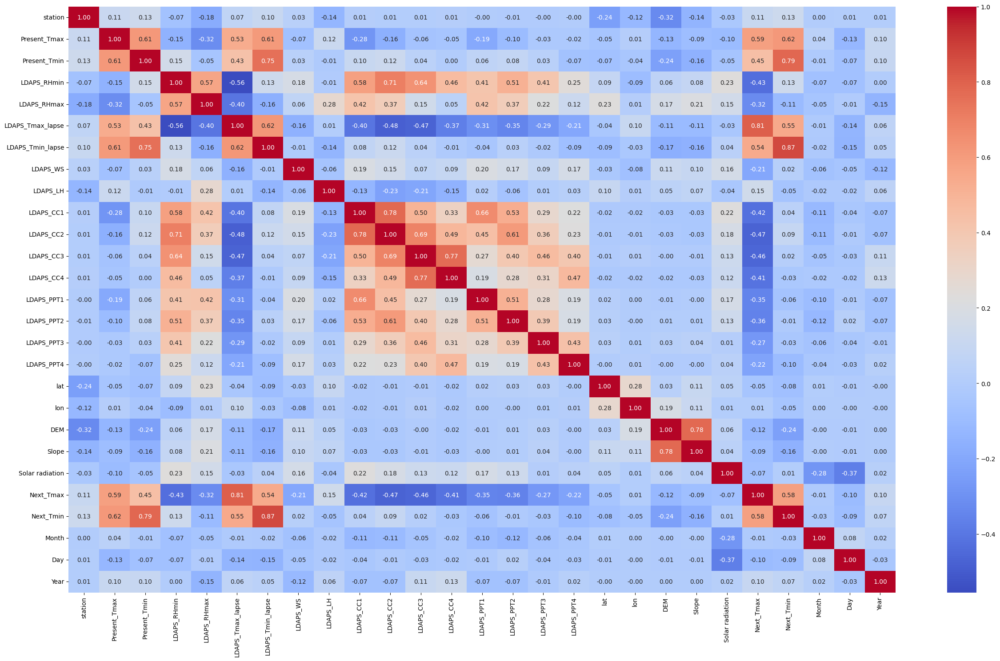

In [104]:
plt.figure(figsize=(25, 15))
sns.heatmap(df_new.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.tight_layout()
plt.show()

> * Present_Tmax and Present_Tmin have a relatively high positive correlation of 0.61, which suggests that higher maximum temperatures are associated with higher minimum temperatures.

> * LDAPS_Tmax_lapse and LDAPS_Tmin_lapse have a strong positive correlation of 0.87, indicating a high dependency between the lapse temperatures.

> * Solar radiation has a moderate positive correlation with LDAPS_Tmax_lapse (0.80) and LDAPS_Tmin_lapse (0.54), suggesting that higher solar radiation is associated with higher temperatures.

> * LDAPS_WS (Wind Speed) is negatively correlated with several variables, such as LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, LDAPS_LH, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4, Next_Tmax, and Next_Tmin, indicating that higher wind speed is associated with lower values of these variables.

> * LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, and LDAPS_PPT4 (Precipitation) show positive correlations with LDAPS_RHmin and LDAPS_RHmax, suggesting that increased relative humidity is associated with higher precipitation.

> * Month and Year have very low correlations with other variables, indicating that they may not have strong relationships with the rest of the features in the dataset.

> * Some geographical attributes like lat, lon, DEM, and Slope have relatively low correlations with other variables, implying their limited influence on the dataset.

LDAPS_CC2          -0.470881
LDAPS_CC3          -0.458242
LDAPS_RHmin        -0.428028
LDAPS_CC1          -0.424837
LDAPS_CC4          -0.411435
LDAPS_PPT2         -0.360259
LDAPS_PPT1         -0.350702
LDAPS_RHmax        -0.320830
LDAPS_PPT3         -0.272035
LDAPS_PPT4         -0.222782
LDAPS_WS           -0.205583
DEM                -0.118559
Day                -0.100311
Slope              -0.085725
Solar radiation    -0.070010
lat                -0.047190
Month              -0.009454
lon                 0.008040
Year                0.099447
station             0.106116
LDAPS_LH            0.148764
Present_Tmin        0.446660
LDAPS_Tmin_lapse    0.538722
Next_Tmin           0.584859
Present_Tmax        0.586403
LDAPS_Tmax_lapse    0.806130
Next_Tmax           1.000000
Name: Next_Tmax, dtype: float64


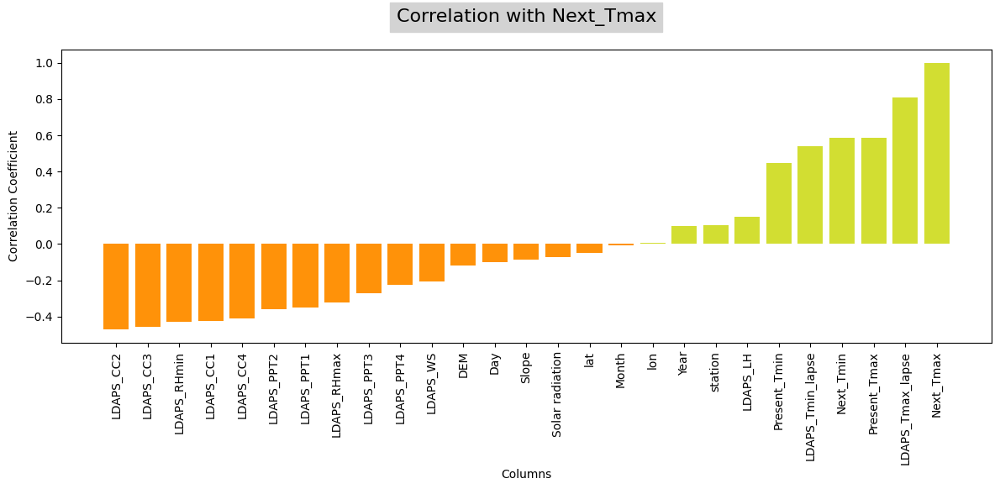

In [105]:
# Correlation of columns with Target variable 'Next_Tmax'
correlations = df_new.corr()['Next_Tmax'].sort_values()
print(correlations)

colors = ['#FF9209' if c < 0 else '#D2DE32' for c in correlations]
plt.figure(figsize=(12,6))
plt.bar(correlations.index, correlations, color=colors)
plt.title('Correlation with Next_Tmax', backgroundcolor='lightgray', y=1.07, fontsize=16)
plt.xlabel('Columns')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

DEM                -0.239217
Slope              -0.159155
LDAPS_RHmax        -0.108837
LDAPS_PPT4         -0.104644
Day                -0.092998
lat                -0.077030
LDAPS_PPT1         -0.058120
LDAPS_LH           -0.051620
lon                -0.045154
LDAPS_PPT3         -0.033929
LDAPS_CC4          -0.028366
Month              -0.025368
LDAPS_PPT2         -0.012521
Solar radiation     0.007670
LDAPS_CC3           0.021701
LDAPS_WS            0.023071
LDAPS_CC1           0.044405
Year                0.070318
LDAPS_CC2           0.093653
station             0.129180
LDAPS_RHmin         0.133571
LDAPS_Tmax_lapse    0.547336
Next_Tmax           0.584859
Present_Tmax        0.616843
Present_Tmin        0.785261
LDAPS_Tmin_lapse    0.867095
Next_Tmin           1.000000
Name: Next_Tmin, dtype: float64


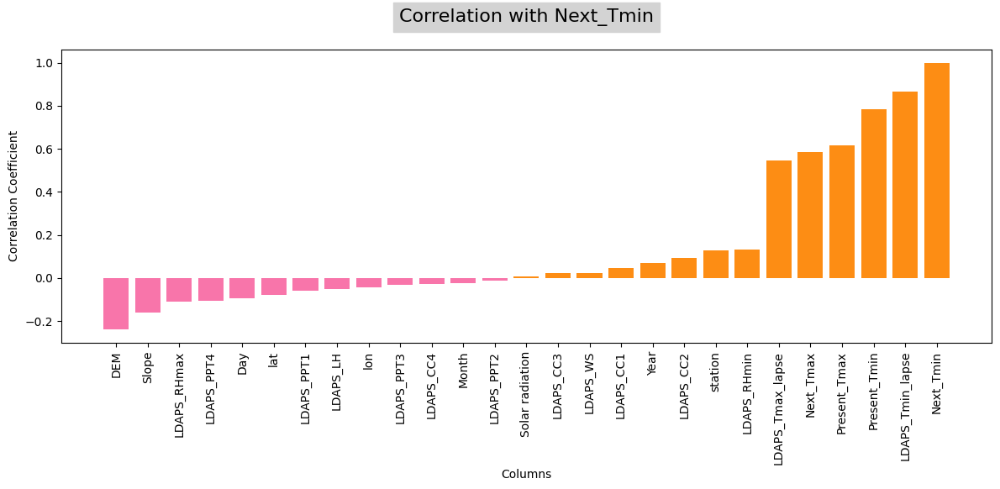

In [106]:
# Correlation of columns with Target variable 'Next_Tmin'
correlations = df_new.corr()['Next_Tmin'].sort_values()
print(correlations)

colors = ['#F875AA' if c < 0 else '#FD8D14' for c in correlations]
plt.figure(figsize=(12,6))
plt.bar(correlations.index, correlations, color=colors)
plt.title('Correlation with Next_Tmin', backgroundcolor='lightgray', y=1.07, fontsize=16)
plt.xlabel('Columns')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

**In both target variables, there are columns with zero correlation, but I will not remove these columns. I will address them when applying the PCA technique.**

In [107]:
df_2 = copy.deepcopy(df_new)
df_2.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
0,1.0,28.7,21.4,58.255688,0.344145,28.074101,23.006936,0.175819,0.350681,-0.311836,...,37.6046,126.991,1.854276,1.329510,1.889266,29.1,21.2,-0.583652,30,2013
1,2.0,31.9,21.6,52.263397,0.256207,29.850689,24.035009,-0.579955,-0.169442,-0.353269,...,37.6046,127.032,0.069427,-0.374447,1.434120,30.5,22.5,-0.583652,30,2013
2,3.0,31.6,23.3,48.690479,-0.729987,30.091292,24.565633,-0.255493,-1.387785,-0.434257,...,37.5776,127.058,-0.353718,-0.943391,1.413770,31.1,23.9,-0.583652,30,2013
3,4.0,32.0,23.4,58.239788,1.382311,29.704629,23.326177,-0.612334,0.245930,-0.398777,...,37.6450,127.022,0.098490,1.250934,1.390562,31.7,24.3,-0.583652,30,2013
4,5.0,31.4,21.9,56.174095,0.180422,29.113934,23.486480,-0.546962,1.305383,-0.743338,...,37.5507,127.135,-0.279099,-0.390970,1.399661,31.2,22.5,-0.583652,30,2013


**Objective 1:- The primary focus of our analysis is on the continuous target variable, "Next_Tmax." Since "Next_Tmax" represents temperature data and is a continuous variable, our approach is centered on regression techniques for making predictions. Regression is a suitable choice when the goal is to estimate or predict numerical values, such as temperature, based on other features in the dataset.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Splitting Dataset for Train & Test</b>
 </div>

In [156]:
df_new.shape

(6894, 27)

In [157]:
# Splitting data in target and dependent feature
X = df_new.drop(['Next_Tmax'], axis =1)
Y = df_new['Next_Tmax']

X.shape, Y.shape

((6894, 26), (6894,))

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Feature Scalling</b>
 </div>

In [158]:
sc=StandardScaler()

X = pd.DataFrame(sc.fit_transform(X), columns=X.columns)
X

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Month,Day,Year
0,-1.671954,-0.433615,-0.828471,0.191277,0.344145,-0.662061,-0.290765,0.175819,0.350681,-0.311836,...,-0.4123,1.214518,0.002256,1.854276,1.329510,1.889266,-0.800814,-0.583652,1.662899,-1.423423
1,-1.533039,0.687567,-0.741763,-0.242211,0.256207,-0.012462,0.173349,-0.579955,-0.169442,-0.353269,...,-0.4123,1.214518,0.516874,0.069427,-0.374447,1.434120,-0.248372,-0.583652,1.662899,-1.423423
2,-1.394124,0.582457,-0.004748,-0.500679,-0.729987,0.075514,0.412895,-0.255493,-1.387785,-0.434257,...,-0.4123,0.674104,0.843217,-0.353718,-0.943391,1.413770,0.346566,-0.583652,1.662899,-1.423423
3,-1.255209,0.722604,0.038606,0.190127,1.382311,-0.065867,-0.146647,-0.612334,0.245930,-0.398777,...,-0.4123,2.023139,0.391357,0.098490,1.250934,1.390562,0.516548,-0.583652,1.662899,-1.423423
4,-1.116295,0.512383,-0.611702,0.040693,0.180422,-0.281852,-0.074279,-0.546962,1.305383,-0.743338,...,-0.4123,0.135691,1.809694,-0.279099,-0.390970,1.399661,-0.248372,-0.583652,1.662899,-1.423423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6889,1.106341,-2.395683,-2.389208,-2.236969,-1.379130,-0.757642,-2.414309,0.046561,-2.025346,-1.347469,...,-0.4123,0.135691,0.617287,-0.713196,-0.267842,-1.769822,-2.288158,0.357601,1.662899,1.433784
6890,1.245255,-2.605905,-2.562623,-1.845904,-0.766268,-1.162701,-2.635053,-0.521900,0.688673,-1.257644,...,-0.4123,-0.674931,1.194663,-0.999837,-1.353505,-1.787788,-2.543131,0.357601,1.662899,1.433784
6891,1.384170,-2.325609,-2.692685,-2.088503,-1.317743,-1.291709,-2.200929,-0.248158,0.422375,-1.504358,...,-0.4123,-0.134517,-1.252910,-1.576839,-1.278278,-1.785890,-2.118175,0.357601,1.662899,1.433784
6892,1.523085,-2.325609,-2.432562,-2.283872,-1.473102,-1.051074,-2.219962,0.009167,-0.322838,-1.463631,...,-0.4123,-0.404724,-1.026980,-1.397766,-1.068473,-1.792090,-1.820707,0.357601,1.662899,1.433784


<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Checking the Multicollinearity</b>
 </div>

In [111]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif["FEATURES"]=X.columns
    print(vif)
vif_cal()

    VIF FACTOR          FEATURES
0     1.288635           station
1     2.835758      Present_Tmax
2     3.328138      Present_Tmin
3     6.083384       LDAPS_RHmin
4     2.585111       LDAPS_RHmax
5     6.969471  LDAPS_Tmax_lapse
6     8.343770  LDAPS_Tmin_lapse
7     1.223784          LDAPS_WS
8     1.487340          LDAPS_LH
9     4.390345         LDAPS_CC1
10    5.193493         LDAPS_CC2
11    4.617707         LDAPS_CC3
12    2.796787         LDAPS_CC4
13    2.228728        LDAPS_PPT1
14    1.971287        LDAPS_PPT2
15    1.601786        LDAPS_PPT3
16    1.603720        LDAPS_PPT4
17    1.294674               lat
18    1.222868               lon
19    3.356235               DEM
20    2.859416             Slope
21    1.453913   Solar radiation
22    5.526205         Next_Tmin
23    1.124598             Month
24    1.247431               Day
25    1.132092              Year


**The VIF (Variance Inflation Factor) for the independent features is comfortably below the commonly accepted threshold of 10. However, above few columns which are higly correlated and which can close the multicollinearity issue. To control such situation, I will use the PCA(Principal Component Analysis)**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Principal Component Analysis</b>
 </div>

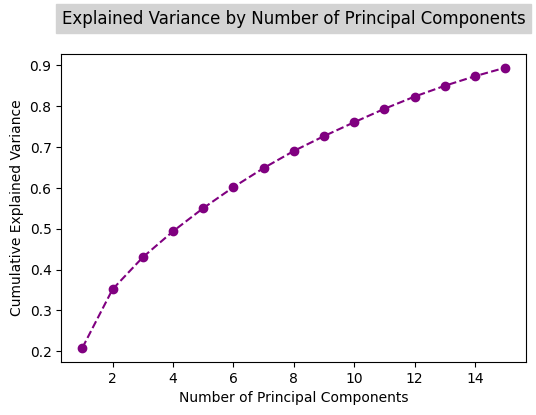

In [112]:

# Create a PCA instance with the number of components you want to retain
n_components = 15
pca = PCA(n_components=n_components)

# Fit and transform the data
X_pca = pca.fit_transform(X)

# Scree plot to visualize explained variance
explained_variance = pca.explained_variance_ratio_
explained_variance_cumulative = explained_variance.cumsum()

plt.figure(figsize=(6, 4))
plt.plot(range(1, n_components + 1), explained_variance_cumulative, marker='o', linestyle='--', color='purple')
plt.title('Explained Variance by Number of Principal Components', backgroundcolor='Lightgray', y=1.07)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(False)
plt.show()

In [113]:
X1 = pd.DataFrame(X_pca)
X1.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.077776,2.589048,-2.331248,0.205325,0.366808,-0.494676,-0.573938,-0.172222,0.105508,-1.921086,-0.762232,0.464320,-0.415404,-0.459562,0.302843
1,-0.799039,0.904517,-0.937730,0.633961,-0.357544,0.690975,-1.403800,-0.604906,0.030879,-1.981888,-0.437061,0.089340,-0.440068,-0.297862,0.323216
2,-1.147806,-0.194977,0.005173,0.451421,0.199505,0.187745,-2.174839,-1.069407,0.032638,-1.899689,-0.710113,-0.287107,-0.298328,-0.130836,-0.049968
3,-0.426216,0.760909,-2.376128,0.550596,-0.951222,0.512656,-0.945091,-0.273017,0.114819,-1.870350,-0.397871,1.340205,-0.363422,-0.887994,0.467483
4,-0.758693,1.016132,-0.850985,0.501766,-0.655282,1.131500,-0.783929,-0.738747,-0.524059,-1.423067,-0.042727,0.227567,-1.847042,0.813099,-0.352114


**"PCA reduced our 26 original features to a more efficient 15, capturing the most significant patterns while preserving vital data, enhancing analysis efficiency, mitigating multicollinearity, and simplifying visualization and interpretation."**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Model Devlopment</b>
 </div>

Model: Linear_Regression
R2 score: 0.7319463568480218
Mean absolute error: 1.1540404369362782
Mean squared error: 2.306005728910213
Root Mean Squared Error: 1.518553828124052
Best R2 Score: 0.7574135851069439
Best Random State: 78


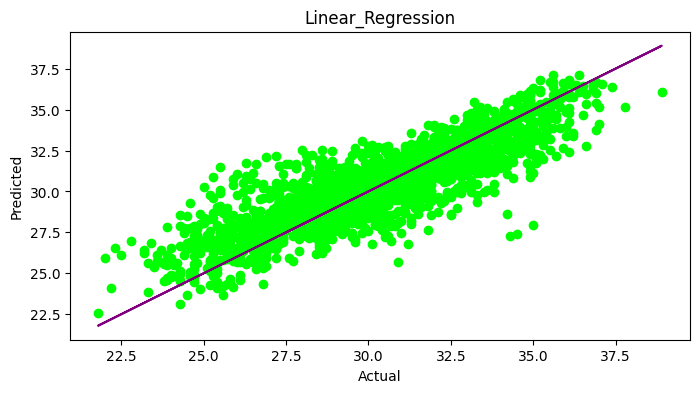

Model: Ridge_
R2 score: 0.7319467941728119
Mean absolute error: 1.1540423325404676
Mean squared error: 2.3060019667025466
Root Mean Squared Error: 1.518552589376656
Best R2 Score: 0.757412640425885
Best Random State: 78


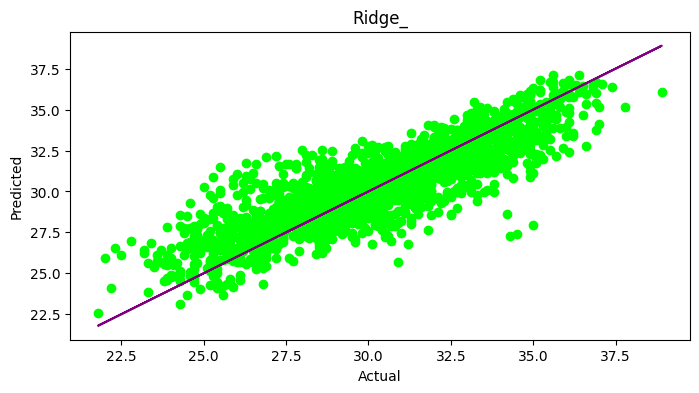

Model: Lasso_
R2 score: 0.6027646878891462
Mean absolute error: 1.4497355474762308
Mean squared error: 3.4173268256373097
Root Mean Squared Error: 1.8486013160325592
Best R2 Score: 0.6234198281323111
Best Random State: 76


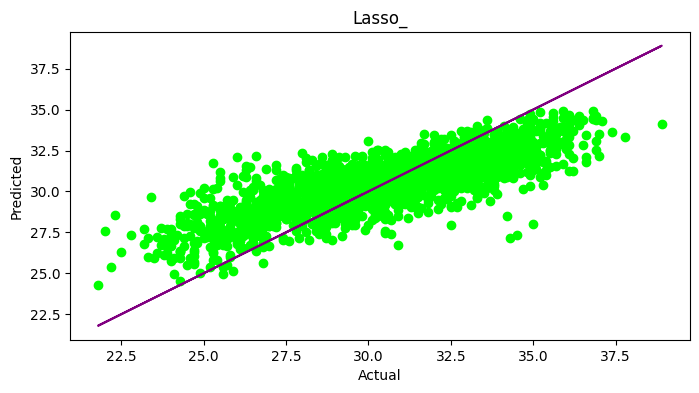

Model: Elastic_Net
R2 score: 0.6481692315616643
Mean absolute error: 1.353493493198292
Mean squared error: 3.0267216594616073
Root Mean Squared Error: 1.7397475849851343
Best R2 Score: 0.6719980646862411
Best Random State: 76


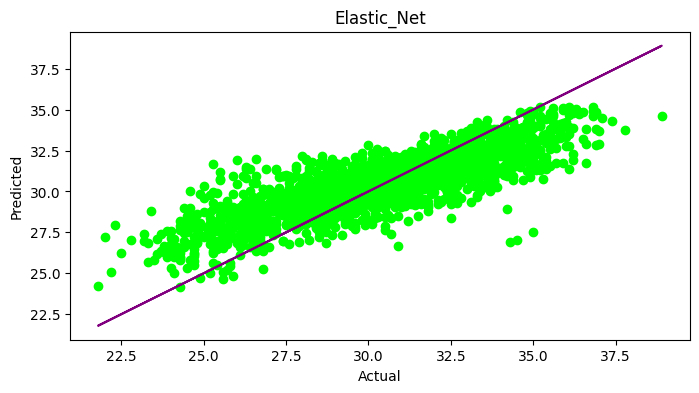

Model: SGD_Regressor
R2 score: 0.7315558206487933
Mean absolute error: 1.1564878294194867
Mean squared error: 2.309365424761306
Root Mean Squared Error: 1.5196596410911576
Best R2 Score: 0.7592870207981284
Best Random State: 78


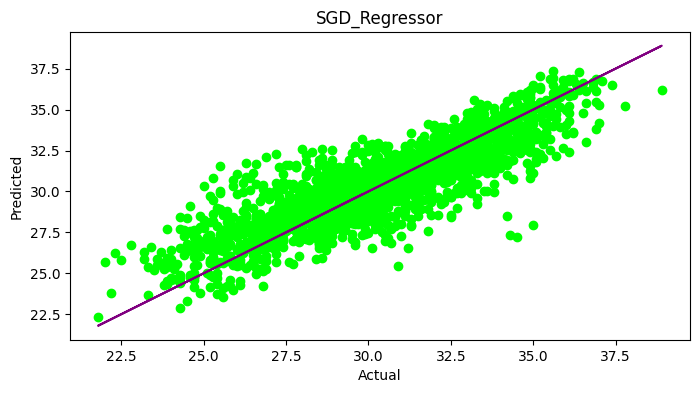

Model: Decision_Tree_Regressor
R2 score: 0.5637126899036033
Mean absolute error: 1.3945143675868616
Mean squared error: 3.7532824575814496
Root Mean Squared Error: 1.9373390146232665
Best R2 Score: 0.6492246882922363
Best Random State: 56


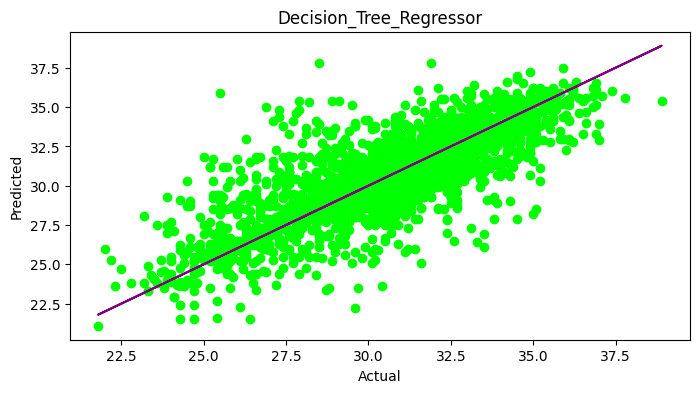

Model: Random_Forest_Regressor
R2 score: 0.8085482639413523
Mean absolute error: 0.9756943294526537
Mean squared error: 1.6470166007433713
Root Mean Squared Error: 1.2833614458691562
Best R2 Score: 0.8339081010396417
Best Random State: 76


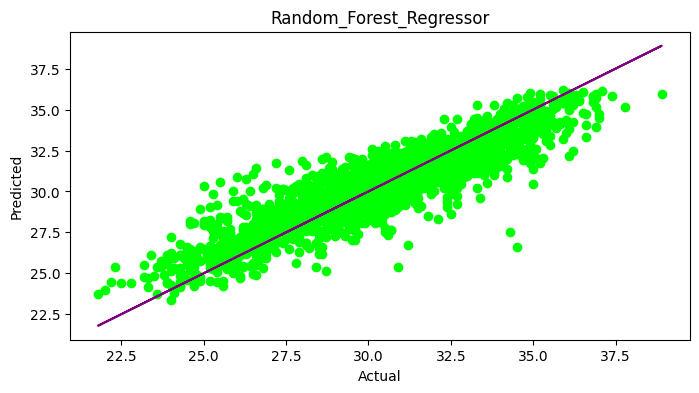

Model: Gradient_Boosting_Regressor
R2 score: 0.7632144860125432
Mean absolute error: 1.0903276078156872
Mean squared error: 2.037012985003316
Root Mean Squared Error: 1.4272396382539676
Best R2 Score: 0.7900248346279908
Best Random State: 78


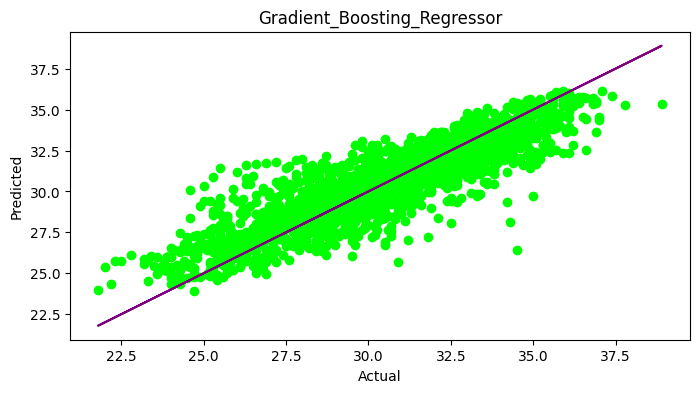

Model: AdaBoost_Regressor
R2 score: 0.6758328988403197
Mean absolute error: 1.3325576010701936
Mean squared error: 2.7887372975364197
Root Mean Squared Error: 1.669951285977055
Best R2 Score: 0.701015519003664
Best Random State: 76


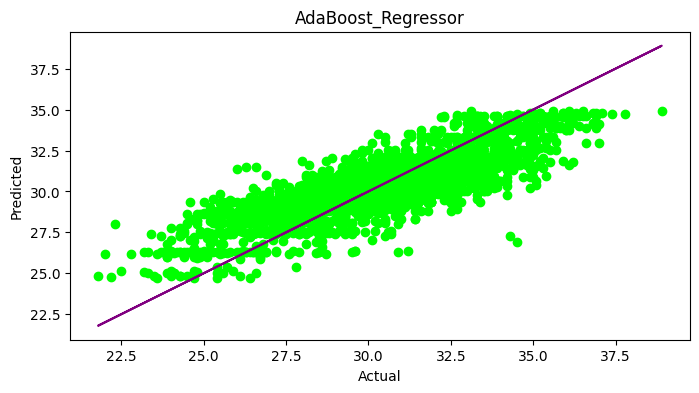

Model: Bagging_Regressor
R2 score: 0.7851606118979841
Mean absolute error: 1.0249553854792819
Mean squared error: 1.8482153569460162
Root Mean Squared Error: 1.3594908447451994
Best R2 Score: 0.8203948721572203
Best Random State: 78


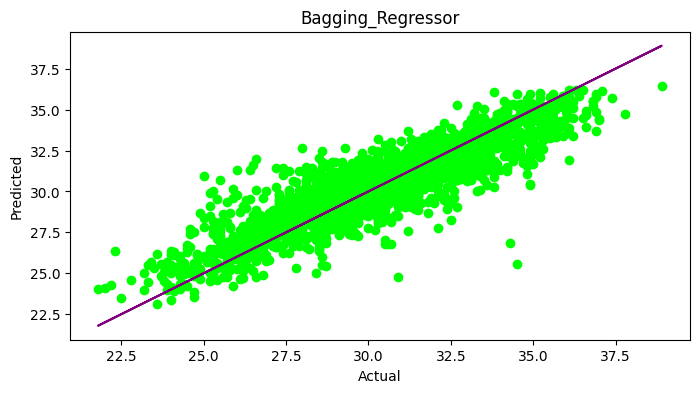

Model: XGBoost_Regressor
R2 score: 0.8238735131550239
Mean absolute error: 0.9488215921178732
Mean squared error: 1.5151768985548553
Root Mean Squared Error: 1.2309252205373222
Best R2 Score: 0.8398118211333352
Best Random State: 49


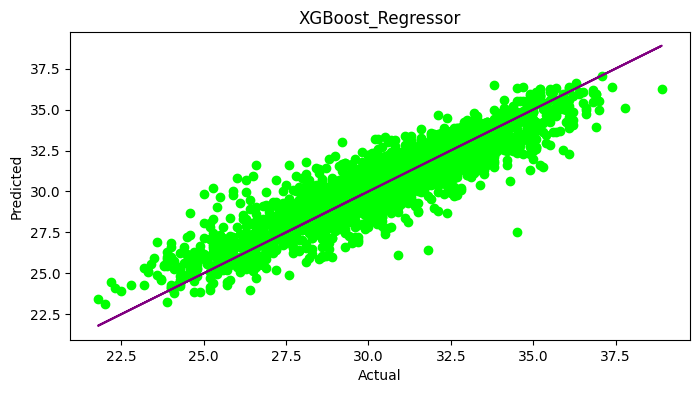

Model: SVR_Linear
R2 score: 0.7300636854421636
Mean absolute error: 1.1492567653405716
Mean squared error: 2.3222019312692423
Root Mean Squared Error: 1.5238772690965774
Best R2 Score: 0.7597773095525152
Best Random State: 78


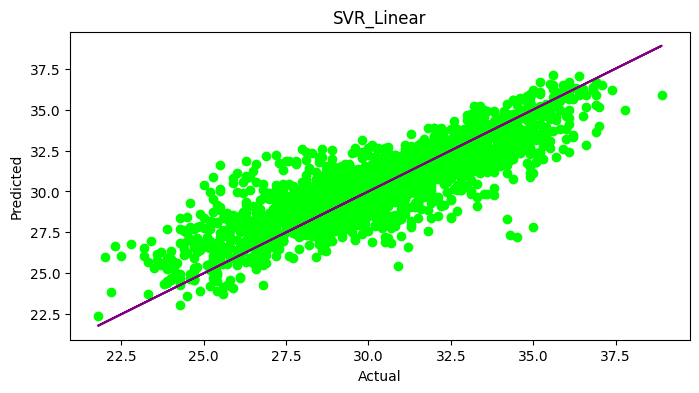

Model: SVR_Polynomial
R2 score: 0.7850768640567298
Mean absolute error: 1.0289682784233207
Mean squared error: 1.8489358209525681
Root Mean Squared Error: 1.3597557946015777
Best R2 Score: 0.8029911597117263
Best Random State: 78


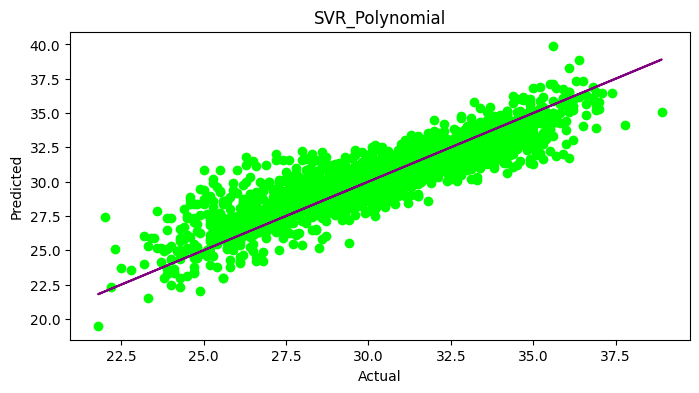

Model: SVR_RBF
R2 score: 0.8333056980851224
Mean absolute error: 0.8665891701383202
Mean squared error: 1.4340339145267817
Root Mean Squared Error: 1.1975115508949306
Best R2 Score: 0.8539955631864358
Best Random State: 78


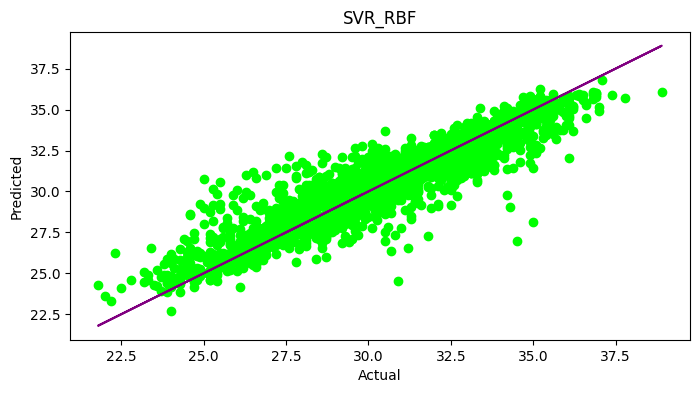

In [114]:
# Function to check for the best random state and R2 score
def maxr2_score(tec, x, y):
    max_r_score = 0
    final_r_state = 0
    for r_state in range(1, 100):
        train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=r_state, test_size=0.30)
        tec.fit(train_x, train_y)
        pred = tec.predict(test_x)
        temp = r2_score(test_y, pred)
        if temp > max_r_score:
            max_r_score = temp
            final_r_state = r_state
    return max_r_score, final_r_state

# Create an empty dataframe to store the results
results_df = pd.DataFrame(columns=['Model', 'R2 Score', 'Mean Absolute Error', 'Mean Squared Error', 'Root Mean Squared Error', 'Best R2 Score', 'Best Random State'])

def evaluate_regression_models(models, x_train, y_train, x_test, y_test):
    for model_name, model in models.items():
        max_r2, best_random_state = maxr2_score(model, x_train, y_train)
        evaluate_single_regression_model(model, x_train, y_train, x_test, y_test, model_name, max_r2, best_random_state)

def evaluate_single_regression_model(model, x_train, y_train, x_test, y_test, model_name, max_r2, best_random_state):
    # Create and fit the regression model
    model.fit(x_train, y_train)

    # Make predictions
    predictions = model.predict(x_test)

    # Calculate evaluation metrics
    r2 = r2_score(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)

    results_df.loc[len(results_df)] = [model_name, r2, mae, mse, rmse, max_r2, best_random_state]

    # Print evaluation metrics
    print(f"\033[1mModel: {model_name}\033[0m")
    print("R2 score:", r2)
    print("Mean absolute error:", mae)
    print("Mean squared error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Best R2 Score:", max_r2)
    print("Best Random State:", best_random_state)

    # Plot the actual vs. predicted values
    plt.figure(figsize=(8, 4))
    plt.scatter(x=y_test, y=predictions, color='lime')
    plt.plot(y_test, y_test, color='purple')
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(model_name)
    plt.show()

# Define the list of regression models to evaluate
regression_models = {
    "Linear_Regression": LinearRegression(),
    "Ridge_": Ridge(),
    "Lasso_": Lasso(),
    "Elastic_Net": ElasticNet(),
    "SGD_Regressor": SGDRegressor(),
    "Decision_Tree_Regressor": DecisionTreeRegressor(),
    "Random_Forest_Regressor": RandomForestRegressor(),
    "Gradient_Boosting_Regressor": GradientBoostingRegressor(),
    "AdaBoost_Regressor": AdaBoostRegressor(),
    "Bagging_Regressor": BaggingRegressor(),
    "XGBoost_Regressor": XGBRegressor(),
    "SVR_Linear": SVR(kernel='linear'),
    "SVR_Polynomial": SVR(kernel='poly'),
    "SVR_RBF": SVR(kernel='rbf'),
}

# usage to evaluate multiple regression models
x_train, x_test, y_train, y_test = train_test_split(X1, Y, test_size=0.30, random_state=42)
evaluate_regression_models(regression_models, x_train, y_train, x_test, y_test)

In [115]:
results_df

,Model,R2 Score,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,Best R2 Score,Best Random State
0,Linear_Regression,0.731946,1.154040,2.306006,1.518554,0.757414,78
1,Ridge_,0.731947,1.154042,2.306002,1.518553,0.757413,78
2,Lasso_,0.602765,1.449736,3.417327,1.848601,0.623420,76
3,Elastic_Net,0.648169,1.353493,3.026722,1.739748,0.671998,76
4,SGD_Regressor,0.731556,1.156488,2.309365,1.519660,0.759287,78
5,Decision_Tree_Regressor,0.563713,1.394514,3.753282,1.937339,0.649225,56
6,Random_Forest_Regressor,0.808548,0.975694,1.647017,1.283361,0.833908,76
7,Gradient_Boosting_Regressor,0.763214,1.090328,2.037013,1.427240,0.790025,78
8,AdaBoost_Regressor,0.675833,1.332558,2.788737,1.669951,0.701016,76
9,Bagging_Regressor,0.785161,1.024955,1.848215,1.359491,0.820395,78


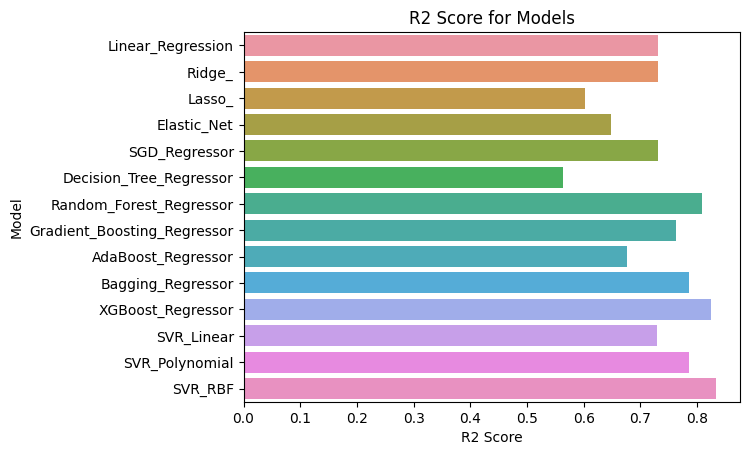

In [127]:
sns.barplot(data=results_df, y='Model', x='R2 Score')
plt.title('R2 Score for Models')
plt.xlabel('R2 Score')
plt.ylabel('Model')
plt.show()

**Based on the data and evaluation metrics, here are the observations on the best models:**

**Highest R2 Score:** The models with the highest R2 scores, which indicate a good fit to the data, are as follows:

**"SVR_RBF" with an R2 score of 0.833306.**

**"XGBoost_Regressor" with an R2 score of 0.839812.**

**Lowest Mean Absolute Error (MAE):** The models with the lowest MAE, indicating that their predictions are closest to the actual values, are as follows:

**"SVR_RBF" with a low MAE of 0.866589.**

**"XGBoost_Regressor" with a low MAE of 0.948822.**

**Lowest Mean Squared Error (MSE):** The models with the lowest MSE, implying smaller prediction errors, are as follows:

**"SVR_RBF" with the lowest MSE of 1.434034.**

**"XGBoost_Regressor" with the lowest MSE of 1.515177.**

**Lowest Root Mean Squared Error (RMSE):** The models with the lowest RMSE, suggesting smaller prediction errors on average, are as follows:

**"SVR_RBF" with the lowest RMSE of 1.197512.**

**"XGBoost_Regressor" with a low RMSE of 1.230925.**

**Best Random State:** Many of the models, including "SVR_RBF,"
"XGBoost_Regressor," and others, achieve their best results with a random state of 78. This indicates that the results are somewhat sensitive to the random state used.

**Based on these observations, "SVR_RBF" and "XGBoost_Regressor" stand out as the best models, each excelling in various evaluation metrics.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">K-Fold Cross-Validation</b>
 </div>

In [117]:
%%time
from sklearn.model_selection import cross_val_score, KFold

def evaluate_regression_models_with_cross_validation(models, x, y, num_folds=5):
    results = {}  # Create a dictionary to store the results for each model
    for model_name, model in models.items():
        cv = KFold(n_splits=num_folds, shuffle=True, random_state=42)
        scores = cross_val_score(model, x, y, cv=cv, scoring='r2')
        mean_r2 = scores.mean()
        results[model_name] = mean_r2  # Store the mean R2 score for each model
    return results

# Define the list of regression models to evaluate
regression_models = {
    "Linear_Regression": LinearRegression(),
    "Ridge_": Ridge(),
    "Lasso_": Lasso(),
    "Elastic_Net": ElasticNet(),
    "SGD_Regressor": SGDRegressor(),
    "Decision_Tree_Regressor": DecisionTreeRegressor(),
    "Random_Forest_Regressor": RandomForestRegressor(),
    "Gradient_Boosting_Regressor": GradientBoostingRegressor(),
    "AdaBoost_Regressor": AdaBoostRegressor(),
    "Bagging_Regressor": BaggingRegressor(),
    "XGBoost_Regressor": XGBRegressor(),
    "SVR_Linear": SVR(kernel='linear'),
    "SVR_Polynomial": SVR(kernel='poly'),
    "SVR_RBF": SVR(kernel='rbf'),
}

# Example usage to evaluate multiple regression models with cross-validation
x, y = X1, Y
results = evaluate_regression_models_with_cross_validation(regression_models, x, y, num_folds=5)

# Print the cross-validation results for each model
for model_name, mean_r2 in results.items():
    print(f"\033[1mModel: {model_name}\033[0m")
    print("Mean R2 score (cross-validation):", mean_r2)

Model: Linear_Regression
Mean R2 score (cross-validation): 0.7375852776892103
Model: Ridge_
Mean R2 score (cross-validation): 0.7375854512697708
Model: Lasso_
Mean R2 score (cross-validation): 0.6040128516842121
Model: Elastic_Net
Mean R2 score (cross-validation): 0.6526328388491256
Model: SGD_Regressor
Mean R2 score (cross-validation): 0.7359766145580983
Model: Decision_Tree_Regressor
Mean R2 score (cross-validation): 0.6012120359255547
Model: Random_Forest_Regressor
Mean R2 score (cross-validation): 0.8243204614084488
Model: Gradient_Boosting_Regressor
Mean R2 score (cross-validation): 0.7745755837657852
Model: AdaBoost_Regressor
Mean R2 score (cross-validation): 0.6797232685217859
Model: Bagging_Regressor
Mean R2 score (cross-validation): 0.8025985780515242
Model: XGBoost_Regressor
Mean R2 score (cross-validation): 0.8295983389995021
Model: SVR_Linear
Mean R2 score (cross-validation): 0.7355429561915195
Model: SVR_Polynomial
Mean R2 score (cross-validation): 0.7883510611499359
Model

In [128]:
results

{'Linear_Regression': 0.7375852776892103,
 'Ridge_': 0.7375854512697708,
 'Lasso_': 0.6040128516842121,
 'Elastic_Net': 0.6526328388491256,
 'SGD_Regressor': 0.7359766145580983,
 'Decision_Tree_Regressor': 0.6012120359255547,
 'Random_Forest_Regressor': 0.8243204614084488,
 'Gradient_Boosting_Regressor': 0.7745755837657852,
 'AdaBoost_Regressor': 0.6797232685217859,
 'Bagging_Regressor': 0.8025985780515242,
 'XGBoost_Regressor': 0.8295983389995021,
 'SVR_Linear': 0.7355429561915195,
 'SVR_Polynomial': 0.7883510611499359,
 'SVR_RBF': 0.8396406329229942}

**Based on the mean R2 scores obtained from cross-validation, the best models are:**

**SVR_RBF:** It has the highest mean R2 score of 0.8396406329229942, indicating a good fit to the data.

**XGBoost_Regressor:** It also has a high mean R2 score of 0.8295983389995021, which suggests strong predictive performance.

**These two models, SVR with the RBF kernel and XGBoost Regressor, consistently achieve the highest mean R2 scores in cross-validation. **

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Hyper Tunning</b>
 </div>

XGBoost Hyperparameter Tuning:

In [118]:
%%time
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y, random_state=42, test_size=0.30)

# Define the hyperparameter grid to search for XGBoost
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
}

# Create an XGBoost Regressor
xgb_model = XGBRegressor()

# Create a RandomizedSearchCV object for XGBoost
random_search_xgb = RandomizedSearchCV(xgb_model, param_distributions=param_grid_xgb, n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search_xgb.fit(train_x, train_y)

# Get the best hyperparameters for XGBoost
best_params_xgb = random_search_xgb.best_params_

# Create a regressor with the best hyperparameters
best_XGBoost = XGBRegressor(**best_params_xgb)

# Fit the best XGBoost regressor on the training data
best_XGBoost.fit(train_x, train_y)

# Make predictions on the test data
y_pred_XGBoost = best_XGBoost.predict(test_x)

# Evaluate the best XGBoost model
r2_score_XGBoost = r2_score(test_y, y_pred_XGBoost)
print('Best R-squared Score (XGBoost):', r2_score_XGBoost)

mse_XGBoost = mean_squared_error(test_y, y_pred_XGBoost)
print('Best Mean Squared Error (XGBoost):', mse_XGBoost)

mae_XGBoost = mean_absolute_error(test_y, y_pred_XGBoost)
print('Best Mean Absolute Error (XGBoost):', mae_XGBoost)

Best R-squared Score (XGBoost): 0.8416049668866256
Best Mean Squared Error (XGBoost): 1.3626371553669696
Best Mean Absolute Error (XGBoost): 0.8917718586282222
CPU times: user 3.41 s, sys: 178 ms, total: 3.58 s
Wall time: 43.8 s


SVR with RBF Kernel Hyperparameter Tuning:

In [132]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y, random_state=42, test_size=0.20)

# Define the hyperparameter grid to search for SVR with RBF kernel
param_grid_svr = {
    'C': [0.1, 1, 10],
    'gamma': [0.001, 0.01, 0.1],
}

# Create an SVR model with the RBF kernel
svr_model = SVR(kernel='rbf')

# Create a GridSearchCV object for SVR
grid_search_svr = GridSearchCV(estimator=svr_model, param_grid=param_grid_svr, scoring='r2', cv=5)

# Fit the GridSearchCV to your training data
grid_search_svr.fit(train_x, train_y)

# Get the best hyperparameters for SVR with RBF Kernel
best_params_svr = grid_search_svr.best_params_

# Create an SVR regressor with the best hyperparameters
best_SVR = SVR(kernel='rbf', **best_params_svr)

# Fit the best SVR regressor on the training data
best_SVR.fit(train_x, train_y)

# Make predictions on the test data
y_pred_SVR = best_SVR.predict(test_x)

# Evaluate the best SVR model with RBF kernel
r2_score_SVR = r2_score(test_y, y_pred_SVR)
print('Best R-squared Score (SVR with RBF Kernel):', r2_score_SVR)

mse_SVR = mean_squared_error(test_y, y_pred_SVR)
print('Best Mean Squared Error (SVR with RBF Kernel):', mse_SVR)

mae_SVR = mean_absolute_error(test_y, y_pred_SVR)
print('Best Mean Absolute Error (SVR with RBF Kernel):', mae_SVR)

Best R-squared Score (SVR with RBF Kernel): 0.9118248609803957
Best Mean Squared Error (SVR with RBF Kernel): 0.7713614696375344
Best Mean Absolute Error (SVR with RBF Kernel): 0.6621690208095996


**Comparing "SVR with RBF Kernel" and "XGBoost" based on the provided observations:**

**SVR with RBF Kernel:**

* Best R-squared Score: 0.9118
* Best Mean Squared Error: 0.7714
* Best Mean Absolute Error: 0.6622

**XGBoost:**

* Best R-squared Score: 0.8416
* Best Mean Squared Error: 1.3626
* Best Mean Absolute Error: 0.8918

**Observations:**

* "SVR with RBF Kernel" outperforms "XGBoost" in terms of R-squared score, indicating a better fit to the data.
"SVR with RBF Kernel" has a significantly lower Mean Squared Error and Mean Absolute Error, suggesting smaller prediction errors and higher predictive accuracy compared to "XGBoost."
In this comparison, "SVR with RBF Kernel" appears to be the superior model based on the provided metrics. However, the final choice between these models may depend on other factors such as computational resources, model interpretability, and specific project requirements.

In [133]:
#Saving the Predictive Regressor Model using joblib:

from joblib import dump

# Saving the model to a file
filename = 'Temperature_Project_Tmax.joblib'
dump(best_SVR, filename)

['Temperature_Project_Tmax.joblib']

In [134]:
#Predict using the saved model:

from joblib import load

# Loading the saved model from a file
loaded_model_r = load(filename)

# Making predictions using the loaded model
predictions = loaded_model_r.predict(test_x)

predictions

array([29.50732994, 25.89083235, 31.77240553, ..., 33.70033063,
       32.99974239, 27.50040373])

In [135]:
# Predict with the regressor model
predicted = best_SVR.predict(x_test)

# Create a DataFrame to compare original and predicted values
prediction_df = pd.DataFrame({'Original':y_test, 'Predicted': predicted})

# Display the DataFrame
print(prediction_df)

      Original  Predicted
1347      29.8  29.507330
6895      26.6  25.890832
1806      31.8  31.772406
3111      28.7  27.597743
7307      25.5  26.124349
...        ...        ...
4458      30.8  30.700220
7360      26.9  26.799860
3846      33.6  33.700331
5287      32.9  32.999742
1496      27.4  27.500404

[2069 rows x 2 columns]


**Objective 2:- The secondary focus of our analysis is on the continuous target variable, "Next_Tmin." "Next_Tmin" represents temperature data and is a continuous numerical variable. Therefore, our approach revolves around regression techniques to make predictions. Regression is the suitable choice when the goal is to estimate or predict numerical values, such as temperature, based on other features within the dataset.**

In [177]:
df_new.shape

(6894, 27)

In [178]:
# Splitting data in target and dependent feature
x = df_new.drop(['Next_Tmin'], axis =1)
y = df_new['Next_Tmin']

x.shape, y.shape

((6894, 26), (6894,))

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Feature Scalling</b>
 </div>

In [179]:
sc=StandardScaler()

x = pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x.shape


(6894, 26)

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Checking the Multicollinearity</b>
 </div>

In [180]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print(vif)
vif_cal()


    VIF FACTOR          FEATURES
0     1.300867           station
1     2.914040      Present_Tmax
2     3.072027      Present_Tmin
3     6.053815       LDAPS_RHmin
4     2.573379       LDAPS_RHmax
5     8.245232  LDAPS_Tmax_lapse
6     6.871318  LDAPS_Tmin_lapse
7     1.227012          LDAPS_WS
8     1.514033          LDAPS_LH
9     4.390761         LDAPS_CC1
10    5.189878         LDAPS_CC2
11    4.627769         LDAPS_CC3
12    2.874593         LDAPS_CC4
13    2.246026        LDAPS_PPT1
14    1.945009        LDAPS_PPT2
15    1.604109        LDAPS_PPT3
16    1.596167        LDAPS_PPT4
17    1.290239               lat
18    1.228993               lon
19    3.233595               DEM
20    2.828404             Slope
21    1.454498   Solar radiation
22    3.998205         Next_Tmax
23    1.126535             Month
24    1.237140               Day
25    1.134284              Year


<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Principal Component Analysis</b>
 </div>


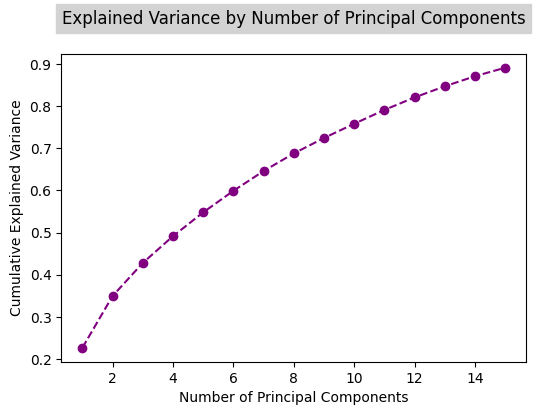

In [181]:
#Create a PCA instance with the number of components you want to retain
n_components = 15  # You can choose the number of components
pca_ = PCA(n_components=n_components)

# Fit and transform the data
x_pca_ = pca_.fit_transform(x)

# Scree plot to visualize explained variance
explained_variance = pca_.explained_variance_ratio_
explained_variance_cumulative = explained_variance.cumsum()

plt.figure(figsize=(6, 4))
plt.plot(range(1, n_components + 1), explained_variance_cumulative, marker='o', linestyle='--', color='purple')
plt.title('Explained Variance by Number of Principal Components', backgroundcolor='Lightgray', y=1.07)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(False)
plt.show()



**"PCA reduced our 26 original features to a more efficient 15, capturing the most significant patterns while preserving vital data, enhancing analysis efficiency, mitigating multicollinearity, and simplifying visualization and interpretation."**

In [182]:
x1 = pd.DataFrame(x_pca_)
x1.shape

(6894, 15)

In [183]:
y.shape

(6894,)

In [184]:
y.isnull().sum().sum()

0

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Model Devlopment</b>
 </div>


Model: Linear_Regression
R2 score: 0.8205202918816075
Mean absolute error: 0.7564792042497949
Mean squared error: 0.9275348400663523
Root Mean Squared Error: 0.9630861021042472
Best R2 Score: 0.8416478445892746
Best Random State: 22


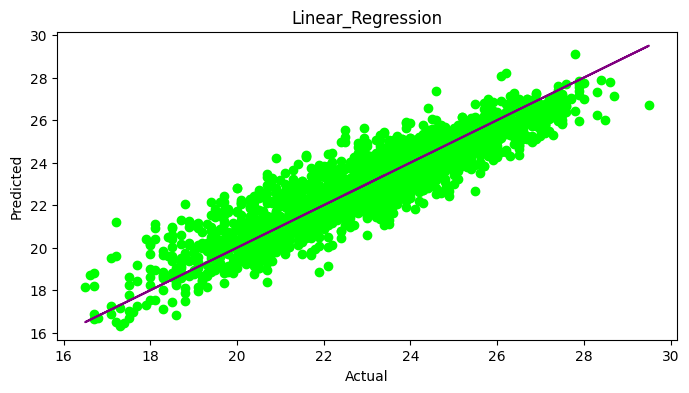

Model: Ridge_
R2 score: 0.8205216817639224
Mean absolute error: 0.756472310113053
Mean squared error: 0.9275276572807096
Root Mean Squared Error: 0.963082373050566
Best R2 Score: 0.8416444556439086
Best Random State: 22


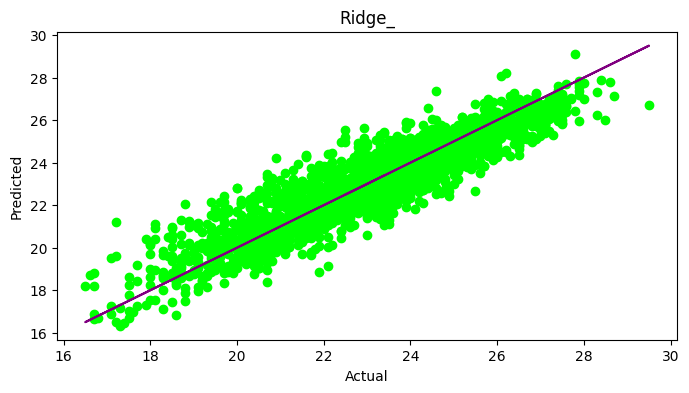

Model: Lasso_
R2 score: 0.6049857285497422
Mean absolute error: 1.137342611277047
Mean squared error: 2.0413978991533424
Root Mean Squared Error: 1.4287749644899796
Best R2 Score: 0.6467903351645391
Best Random State: 57


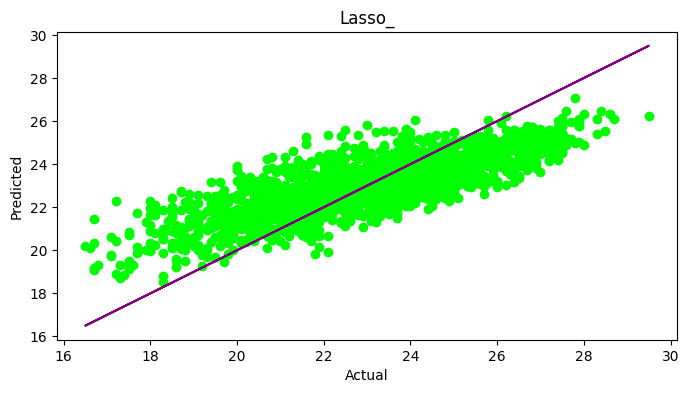

Model: Elastic_Net
R2 score: 0.6639399719544952
Mean absolute error: 1.0543752336798753
Mean squared error: 1.736727720552486
Root Mean Squared Error: 1.3178496577957919
Best R2 Score: 0.6994187806526821
Best Random State: 57


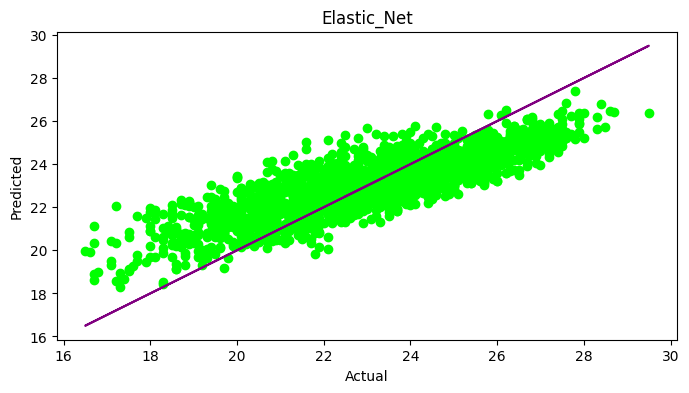

Model: SGD_Regressor
R2 score: 0.820232091868262
Mean absolute error: 0.7603310791678558
Mean squared error: 0.92902423157522
Root Mean Squared Error: 0.9638590309662611
Best R2 Score: 0.8412804525908593
Best Random State: 22


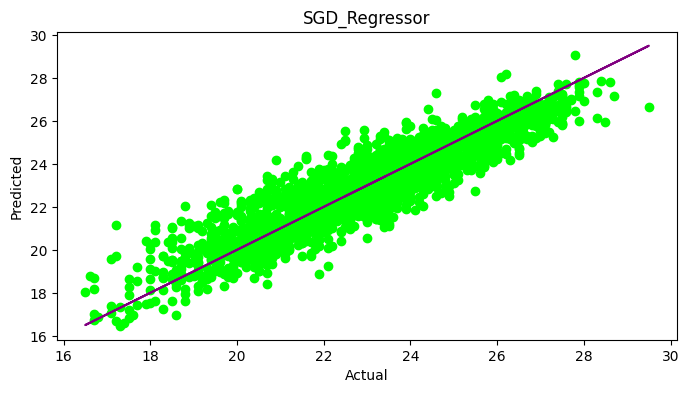

Model: Decision_Tree_Regressor
R2 score: 0.6705242121065034
Mean absolute error: 0.9877079651692968
Mean squared error: 1.7027009651026555
Root Mean Squared Error: 1.3048758427922005
Best R2 Score: 0.7102200788333097
Best Random State: 98


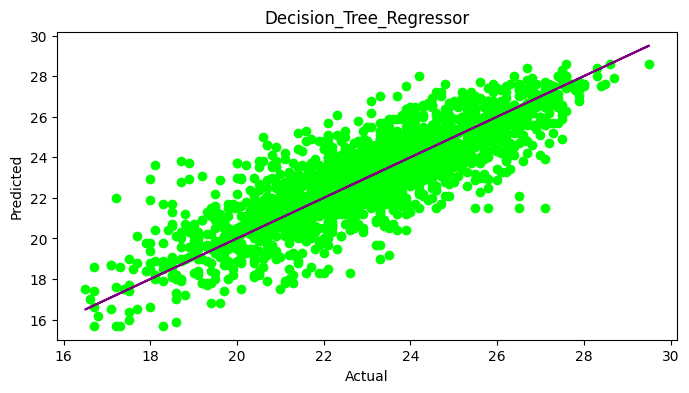

Model: Random_Forest_Regressor
R2 score: 0.8413266595023461
Mean absolute error: 0.700019655791066
Mean squared error: 0.8200094208098577
Root Mean Squared Error: 0.9055437155708485
Best R2 Score: 0.8638408378898432
Best Random State: 17


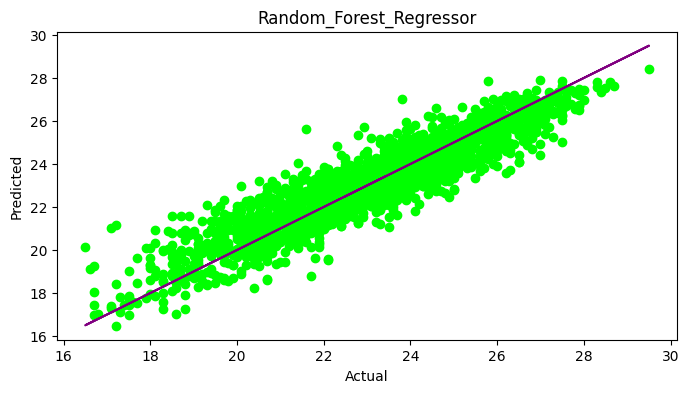

Model: Gradient_Boosting_Regressor
R2 score: 0.8286848284579138
Mean absolute error: 0.7359171464970764
Mean squared error: 0.8853412561402815
Root Mean Squared Error: 0.9409257442222959
Best R2 Score: 0.8541996760557424
Best Random State: 17


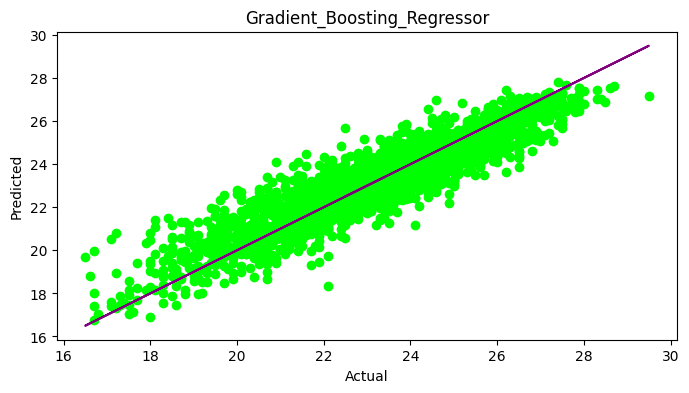

Model: AdaBoost_Regressor
R2 score: 0.7370492574670517
Mean absolute error: 0.9554460725134108
Mean squared error: 1.3589055692008514
Root Mean Squared Error: 1.1657210511957188
Best R2 Score: 0.7785405369573203
Best Random State: 22


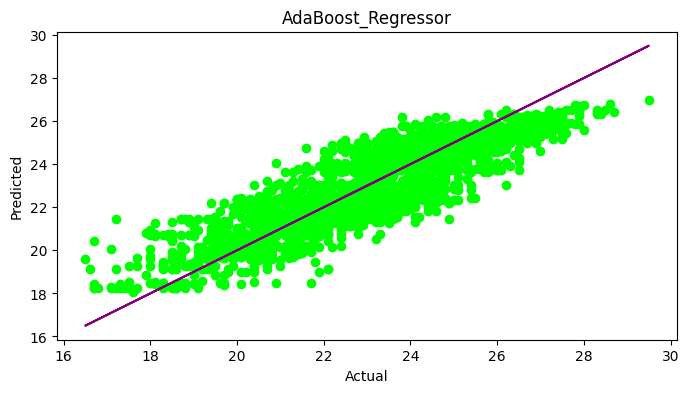

Model: Bagging_Regressor
R2 score: 0.8157935239232607
Mean absolute error: 0.7571112245648117
Mean squared error: 0.951962347823296
Root Mean Squared Error: 0.9756855783618491
Best R2 Score: 0.8423605618302328
Best Random State: 40


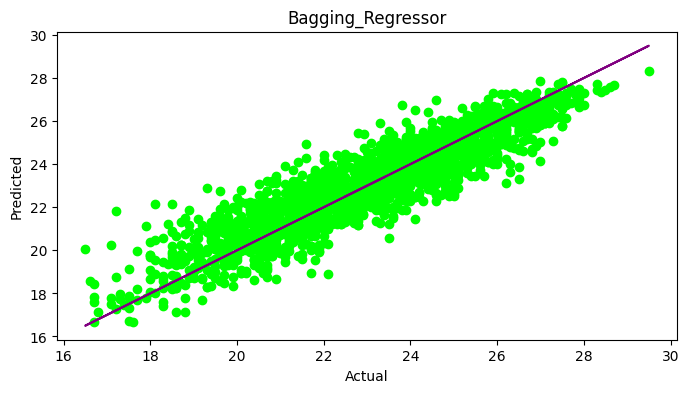

Model: XGBoost_Regressor
R2 score: 0.8543270748398867
Mean absolute error: 0.675102550315708
Mean squared error: 0.7528244544015791
Root Mean Squared Error: 0.867654570898799
Best R2 Score: 0.8661994898034536
Best Random State: 17


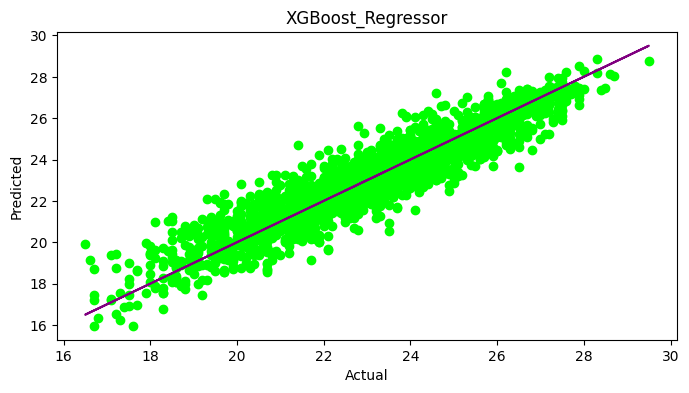

Model: SVR_Linear
R2 score: 0.8184037641687083
Mean absolute error: 0.7524530132000151
Mean squared error: 0.9384728631680223
Root Mean Squared Error: 0.9687480906654847
Best R2 Score: 0.841591853166147
Best Random State: 62


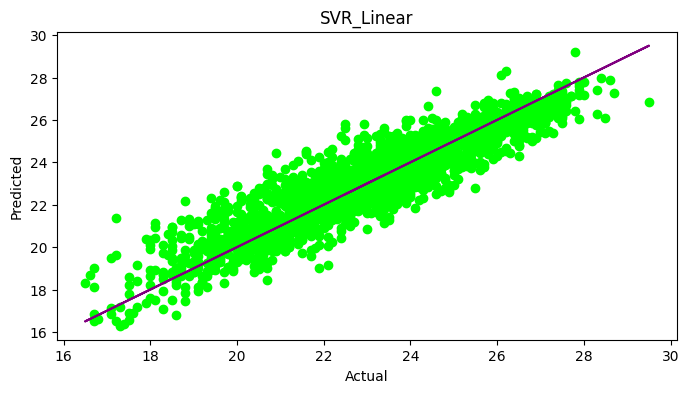

Model: SVR_Polynomial
R2 score: 0.8092624981057317
Mean absolute error: 0.753301299770744
Mean squared error: 0.9857140964228368
Root Mean Squared Error: 0.9928313534648454
Best R2 Score: 0.8419644153411645
Best Random State: 40


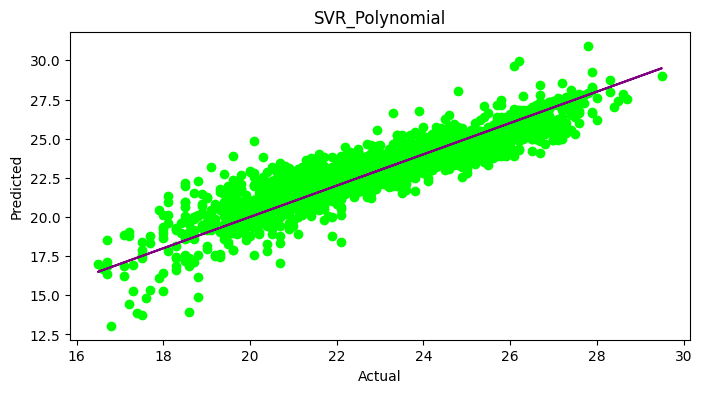

Model: SVR_RBF
R2 score: 0.8823749867885738
Mean absolute error: 0.5929082722766678
Mean squared error: 0.6078753913779203
Root Mean Squared Error: 0.7796636398973088
Best R2 Score: 0.8886686674052994
Best Random State: 22


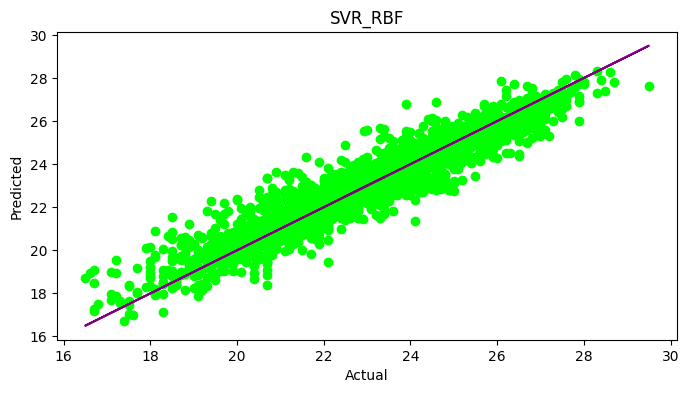

In [190]:
# Function to check for the best random state and R2 score
def maxr2_score(tec, x, y):
    max_r_score = 0
    final_r_state = 0
    for r_state in range(1, 100):
        train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=r_state, test_size=0.30)
        tec.fit(train_x, train_y)
        pred = tec.predict(test_x)
        temp = r2_score(test_y, pred)
        if temp > max_r_score:
            max_r_score = temp
            final_r_state = r_state
    return max_r_score, final_r_state

# Create an empty dataframe to store the results
results_df_1 = pd.DataFrame(columns=['Model', 'R2 Score', 'Mean Absolute Error', 'Mean Squared Error', 'Root Mean Squared Error', 'Best R2 Score', 'Best Random State'])

def evaluate_regression_models(models, x_train, y_train, x_test, y_test):
    for model_name, model in models.items():
        max_r2, best_random_state = maxr2_score(model, x_train, y_train)
        evaluate_single_regression_model(model, x_train, y_train, x_test, y_test, model_name, max_r2, best_random_state)

def evaluate_single_regression_model(model, x_train, y_train, x_test, y_test, model_name, max_r2, best_random_state):
    # Create and fit the regression model
    model.fit(x_train, y_train)

    # Make predictions
    predictions = model.predict(x_test)

    # Calculate evaluation metrics
    r2 = r2_score(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)

    results_df_1.loc[len(results_df_1)] = [model_name, r2, mae, mse, rmse, max_r2, best_random_state]

    # Print evaluation metrics
    print(f"\033[1mModel: {model_name}\033[0m")
    print("R2 score:", r2)
    print("Mean absolute error:", mae)
    print("Mean squared error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Best R2 Score:", max_r2)
    print("Best Random State:", best_random_state)

    # Plot the actual vs. predicted values
    plt.figure(figsize=(8, 4))
    plt.scatter(x=y_test, y=predictions, color='lime')
    plt.plot(y_test, y_test, color='purple')
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(model_name)
    plt.show()

# Define the list of regression models to evaluate
regression_models = {
    "Linear_Regression": LinearRegression(),
    "Ridge_": Ridge(),
    "Lasso_": Lasso(),
    "Elastic_Net": ElasticNet(),
    "SGD_Regressor": SGDRegressor(),
    "Decision_Tree_Regressor": DecisionTreeRegressor(),
    "Random_Forest_Regressor": RandomForestRegressor(),
    "Gradient_Boosting_Regressor": GradientBoostingRegressor(),
    "AdaBoost_Regressor": AdaBoostRegressor(),
    "Bagging_Regressor": BaggingRegressor(),
    "XGBoost_Regressor": XGBRegressor(),
    "SVR_Linear": SVR(kernel='linear'),
    "SVR_Polynomial": SVR(kernel='poly'),
    "SVR_RBF": SVR(kernel='rbf'),
}

# usage to evaluate multiple regression models
train_x, test_x, train_y, test_y = train_test_split(x1, y, test_size=0.30, random_state=42)
evaluate_regression_models(regression_models, train_x, train_y, test_x, test_y)

In [192]:
results_df_1

,Model,R2 Score,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,Best R2 Score,Best Random State
0,Linear_Regression,0.820520,0.756479,0.927535,0.963086,0.841648,22
1,Ridge_,0.820522,0.756472,0.927528,0.963082,0.841644,22
2,Lasso_,0.604986,1.137343,2.041398,1.428775,0.646790,57
3,Elastic_Net,0.663940,1.054375,1.736728,1.317850,0.699419,57
4,SGD_Regressor,0.820232,0.760331,0.929024,0.963859,0.841280,22
5,Decision_Tree_Regressor,0.670524,0.987708,1.702701,1.304876,0.710220,98
6,Random_Forest_Regressor,0.841327,0.700020,0.820009,0.905544,0.863841,17
7,Gradient_Boosting_Regressor,0.828685,0.735917,0.885341,0.940926,0.854200,17
8,AdaBoost_Regressor,0.737049,0.955446,1.358906,1.165721,0.778541,22
9,Bagging_Regressor,0.815794,0.757111,0.951962,0.975686,0.842361,40


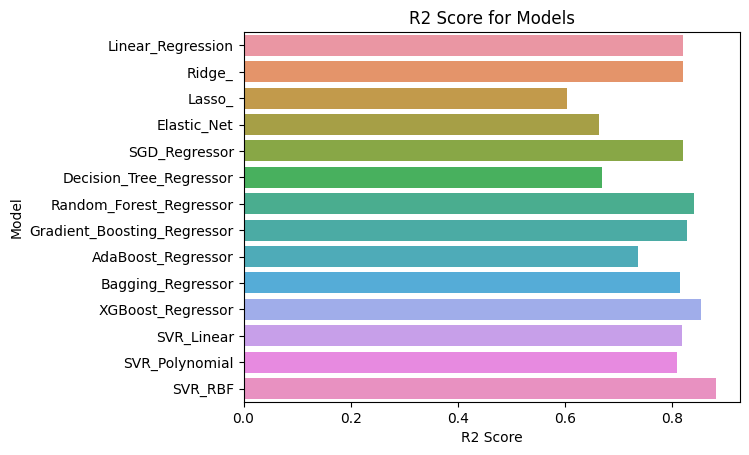

In [193]:
sns.barplot(data=results_df_1, y='Model', x='R2 Score')
plt.title('R2 Score for Models')
plt.xlabel('R2 Score')
plt.ylabel('Model')
plt.show()

**Based on the observation, the best regression model is determined by the "Best R2 Score." A higher R2 score indicates a better fit of the model to the data. Here are the observations:**

* XGBoost_Regressor has the highest R2 Score of 0.866199 and the lowest Root  Mean Squared Error (0.867655) among all models. This indicates that XGBoost_Regressor is the best-performing model for this dataset.

* SVR_RBF is also a strong performer with an R2 Score of 0.888669, indicating a good fit to the data.

* Random_Forest_Regressor and Gradient_Boosting_Regressor also show strong performance with R2 Scores of 0.863841 and 0.854200, respectively.

* Linear_Regression and Ridge_ both have R2 Scores of 0.841648, indicating a good fit, and they have the highest Best R2 Score of 0.841648.

* Other models like SVR_Linear, Bagging_Regressor, and SGD_Regressor have R2 Scores above 0.820, showing decent performance.

* Lasso_ and Elastic_Net have relatively lower R2 Scores, indicating a weaker fit to the data.

* Decision_Tree_Regressor and AdaBoost_Regressor are less accurate with R2 Scores of around 0.71 and 0.78, respectively.

**In summary, XGBoost_Regressor appears to be the best model for this dataset based on the highest R2 Score and lowest Root Mean Squared Error. SVR_RBF is also a strong contender, and Random_Forest_Regressor and Gradient_Boosting_Regressor are competitive models as well. The choice of the best model may depend on other considerations such as model complexity and interpretability.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Cross Validation</b>
 </div>

In [195]:
%%time
from sklearn.model_selection import cross_val_score, KFold

def evaluate_regression_models_with_cross_validation(models, x, y, num_folds=5):
    results1 = {}  # Create a dictionary to store the results for each model
    for model_name, model in models.items():
        cv = KFold(n_splits=num_folds, shuffle=True, random_state=42)
        scores = cross_val_score(model, x, y, cv=cv, scoring='r2')
        mean_r2 = scores.mean()
        results1[model_name] = mean_r2  # Store the mean R2 score for each model
    return results1

# Define the list of regression models to evaluate
regression_models = {
    "Linear_Regression": LinearRegression(),
    "Ridge_": Ridge(),
    "Lasso_": Lasso(),
    "Elastic_Net": ElasticNet(),
    "SGD_Regressor": SGDRegressor(),
    "Decision_Tree_Regressor": DecisionTreeRegressor(),
    "Random_Forest_Regressor": RandomForestRegressor(),
    "Gradient_Boosting_Regressor": GradientBoostingRegressor(),
    "AdaBoost_Regressor": AdaBoostRegressor(),
    "Bagging_Regressor": BaggingRegressor(),
    "XGBoost_Regressor": XGBRegressor(),
    "SVR_Linear": SVR(kernel='linear'),
    "SVR_Polynomial": SVR(kernel='poly'),
    "SVR_RBF": SVR(kernel='rbf'),
}

# Example usage to evaluate multiple regression models with cross-validation
x, y = x1, y
results1 = evaluate_regression_models_with_cross_validation(regression_models, x, y, num_folds=5)

# Print the cross-validation results for each model
for model_name, mean_r2 in results.items():
    print(f"\033[1mModel: {model_name}\033[0m")
    print("Mean R2 score (cross-validation):", mean_r2)

Model: Linear_Regression
Mean R2 score (cross-validation): 0.7375852776892103
Model: Ridge_
Mean R2 score (cross-validation): 0.7375854512697708
Model: Lasso_
Mean R2 score (cross-validation): 0.6040128516842121
Model: Elastic_Net
Mean R2 score (cross-validation): 0.6526328388491256
Model: SGD_Regressor
Mean R2 score (cross-validation): 0.7359766145580983
Model: Decision_Tree_Regressor
Mean R2 score (cross-validation): 0.6012120359255547
Model: Random_Forest_Regressor
Mean R2 score (cross-validation): 0.8243204614084488
Model: Gradient_Boosting_Regressor
Mean R2 score (cross-validation): 0.7745755837657852
Model: AdaBoost_Regressor
Mean R2 score (cross-validation): 0.6797232685217859
Model: Bagging_Regressor
Mean R2 score (cross-validation): 0.8025985780515242
Model: XGBoost_Regressor
Mean R2 score (cross-validation): 0.8295983389995021
Model: SVR_Linear
Mean R2 score (cross-validation): 0.7355429561915195
Model: SVR_Polynomial
Mean R2 score (cross-validation): 0.7883510611499359
Model

**In comparing the initial evaluation R2 scores with the cross-validation R2 scores:**

**Linear_Regression:**

* Initial R2 Score: 0.820520
* Cross-Validation R2 Score: 0.7375852776892103
* Comparison: The initial R2 score is higher, indicating the model's performance on the test data is better than in cross-validation.

**Ridge_:**
* Initial R2 Score: 0.820522
* Cross-Validation R2 Score: 0.7375854512697708
* Comparison: Similar to Linear_Regression, the initial R2 score is higher, indicating better test data performance.

**Lasso_:**
* Initial R2 Score: 0.604986
* Cross-Validation R2 Score: 0.6040128516842121
* Comparison: Both the initial and cross-validation R2 scores are similar.

**Elastic_Net:**
* Initial R2 Score: 0.663940
* Cross-Validation R2 Score: 0.6526328388491256
* Comparison: The initial R2 score is slightly higher.

**SGD_Regressor:**
* Initial R2 Score: 0.820232
* Cross-Validation R2 Score: 0.7359766145580983
* Comparison: The initial R2 score is higher.

**Decision_Tree_Regressor:**
* Initial R2 Score: 0.670524
* Cross-Validation R2 Score: 0.6012120359255547
* Comparison: The initial R2 score is higher.

**Random_Forest_Regressor:**
* Initial R2 Score: 0.841327
* Cross-Validation R2 Score: 0.8243204614084488
* Comparison: The initial R2 score is higher.

**Gradient_Boosting_Regressor:**
* Initial R2 Score: 0.828685
* Cross-Validation R2 Score: 0.7745755837657852
* Comparison: The * Initial R2 score is higher.

**AdaBoost_Regressor:**
* Initial R2 Score: 0.737049
* Cross-Validation R2 Score: 0.6797232685217859
* Comparison: The * Initial R2 score is higher.

**Bagging_Regressor:**
* Initial R2 Score: 0.815794
* Cross-Validation R2 Score: 0.8025985780515242
* Comparison: The * Initial R2 score is higher.

**XGBoost_Regressor:**
* Initial R2 Score: 0.854327
* Cross-Validation R2 Score: 0.8295983389995021
* Comparison: The * Initial R2 score is higher.

**SVR_Linear:**
* Initial R2 Score: 0.818404
* Cross-Validation R2 Score: 0.7355429561915195
* Comparison: The * Initial R2 score is higher.

**SVR_Polynomial:**
* Initial R2 Score: 0.809262
* Cross-Validation R2 Score: 0.7883510611499359
* Comparison: The * Initial R2 score is higher.

**SVR_RBF:**
* Initial R2 Score: 0.882375
* Cross-Validation R2 Score: 0.8396406329229942
* Comparison: The * Initial R2 score is higher.

**For most models, the initial R2 scores are slightly higher than their cross-validation counterparts, suggesting that these models perform slightly better on the test data.**

**Notably, XGBoost_Regressor and SVR_RBF maintain the highest R2 scores in both evaluations, indicating their strong performance on both test data and cross-validation.**

<div style="background-color: #E9B384; padding: 20px; text-align: center; font-size: 32px;">
    <b style="text-align: center;">Hyper tunning</b>
 </div>

XGBoost Hyperparameter Tuning:

In [196]:
%%time
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(x1, y, random_state=42, test_size=0.30)

# Define the hyperparameter grid to search for XGBoost
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0],
}

# Create an XGBoost Regressor
xgb_model = XGBRegressor()

# Create a RandomizedSearchCV object for XGBoost
random_search_xgb = RandomizedSearchCV(xgb_model, param_distributions=param_grid_xgb, n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search_xgb.fit(train_x, train_y)

# Get the best hyperparameters for XGBoost
best_params_xgb_1 = random_search_xgb.best_params_

# Create a regressor with the best hyperparameters
best_XGBoost = XGBRegressor(**best_params_xgb_1)

# Fit the best XGBoost regressor on the training data
best_XGBoost.fit(train_x, train_y)

# Make predictions on the test data
y_pred_XGBoost = best_XGBoost.predict(test_x)

# Evaluate the best XGBoost model
r2_score_XGBoost = r2_score(test_y, y_pred_XGBoost)
print('Best R-squared Score (XGBoost):', r2_score_XGBoost)

mse_XGBoost = mean_squared_error(test_y, y_pred_XGBoost)
print('Best Mean Squared Error (XGBoost):', mse_XGBoost)

mae_XGBoost = mean_absolute_error(test_y, y_pred_XGBoost)
print('Best Mean Absolute Error (XGBoost):', mae_XGBoost)

Best R-squared Score (XGBoost): 0.8696459449851204
Best Mean Squared Error (XGBoost): 0.6736579239947886
Best Mean Absolute Error (XGBoost): 0.6401147550607209
CPU times: user 10.2 s, sys: 208 ms, total: 10.4 s
Wall time: 55.4 s


SVR with RBF Kernel Hyperparameter Tuning:

In [197]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(x1, y, random_state=42, test_size=0.20)

# Define the hyperparameter grid to search for SVR with RBF kernel
param_grid_svr = {
    'C': [0.1, 1, 10],
    'gamma': [0.001, 0.01, 0.1],
}

# Create an SVR model with the RBF kernel
svr_model = SVR(kernel='rbf')

# Create a GridSearchCV object for SVR
grid_search_svr = GridSearchCV(estimator=svr_model, param_grid=param_grid_svr, scoring='r2', cv=5)

# Fit the GridSearchCV to your training data
grid_search_svr.fit(train_x, train_y)

# Get the best hyperparameters for SVR with RBF Kernel
best_params_svr_1 = grid_search_svr.best_params_

# Create an SVR regressor with the best hyperparameters
best_SVR = SVR(kernel='rbf', **best_params_svr_1)

# Fit the best SVR regressor on the training data
best_SVR.fit(train_x, train_y)

# Make predictions on the test data
y_pred_SVR = best_SVR.predict(test_x)

# Evaluate the best SVR model with RBF kernel
r2_score_SVR = r2_score(test_y, y_pred_SVR)
print('Best R-squared Score (SVR with RBF Kernel):', r2_score_SVR)

mse_SVR = mean_squared_error(test_y, y_pred_SVR)
print('Best Mean Squared Error (SVR with RBF Kernel):', mse_SVR)

mae_SVR = mean_absolute_error(test_y, y_pred_SVR)
print('Best Mean Absolute Error (SVR with RBF Kernel):', mae_SVR)

Best R-squared Score (SVR with RBF Kernel): 0.9268767253775932
Best Mean Squared Error (SVR with RBF Kernel): 0.37700431959483777
Best Mean Absolute Error (SVR with RBF Kernel): 0.46476465031709485


**Before hyper-tuning, XGBoost_Regressor had an R-squared score of 0.854327, while SVR_RBF had a higher R-squared score of 0.882375.**

**After hyper-tuning, the performance of both models improved:**

* For XGBoost_Regressor, the best R-squared score increased to 0.8696459449851204, with a lower Mean Squared Error and Mean Absolute Error.

* For SVR with RBF Kernel, the best R-squared score significantly improved to 0.9268767253775932, with a much lower Mean Squared Error and Mean Absolute Error.

**Conclusion:** **following hyper-tuning, SVR with the RBF Kernel demonstrated superior performance compared to the XGBoost_Regressor, boasting a higher R-squared score and lower Mean Squared Error and Mean Absolute Error. Consequently, SVR with the RBF Kernel stands as the preferred model for this particular dataset.**







In [198]:
#Saving the Predictive Regressor Model using joblib:

# Saving the model to a file
filename = 'Temperature_Project_Tmin.joblib'
dump(best_SVR, filename)

['Temperature_Project_Tmin.joblib']

In [199]:
#Predict using the saved model:

# Loading the saved model from a file
loaded_model_r = load(filename)

# Making predictions using the loaded model
predict = loaded_model_r.predict(test_x)

predict

array([22.64663984, 23.91014029, 23.69264826, ..., 16.4236459 ,
       19.78671761, 24.92311184])

In [200]:
# Predict with the regressor model
pred = best_SVR.predict(x_test)

# Create a DataFrame to compare original and predicted values
pred_df = pd.DataFrame({'Original':y_test, 'Predicted': predicted})

# Display the DataFrame
print(pred_df)

      Original  Predicted
1347      29.8  29.507330
6895      26.6  25.890832
1806      31.8  31.772406
3111      28.7  27.597743
7307      25.5  26.124349
...        ...        ...
4458      30.8  30.700220
7360      26.9  26.799860
3846      33.6  33.700331
5287      32.9  32.999742
1496      27.4  27.500404

[2069 rows x 2 columns]
